## Identify similar papers based cosine similarity

To test if we can automatically identify similar papers (based on abstracts) from existing ones, I start with universal-sentence-encoder which convert paper abstracts into vectors of size 512. Then I search for the top 5 similar papers with cosine similarity. 
See the example output below. Input dataset generated as method in notebook *Keyword window “polymerase + therapeut" R* and *Part 2 TFIDF Clustering at Abstract level* (a subset of CORD19 data, 1941 “polymerase” related paper abstracts) 


https://www.kaggle.com/leijiang1/part-3-keyword-window-polymerase-therapeut-r

https://www.kaggle.com/leijiang1/part-2-tfidf-clustering-at-abstract-level


For test 2, after manually reading the input, I think the original abstract focus on influenza medicine. My top results are focus on influenza. The reason I chose abstract level analysis is because I think use full body text for topic modeling could have the risk of picking up too much noise. Another point is I chose sentence encoder becasue we'd better not to tokenize medical words (it’s a domain specific property).

#### This method can also be used for a Question Answering system although the performance of which is still subject to evaluation.

I will manually read the output 20 papers for the question "What are clinical effective therapeutics or drugs for COVID-19?" and update.



## Pros and Cons of my method
### So the pros of my method is
My method used Transfer learning of universal-sentence-encoder which means I stand on the shoulder of giant. 🙂 

### cons of my method is 
need to manually read the outputs to validate if the results are solid.


### Universal Sentence Encoder family

There are a number of different Universal Sentence Encoders. I think universal-sentence-encoder-qa should be the best fit for the task of Question Answering.
However, I could not get it to run (ResourceExhaustedError).

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/3") #this step takes long on local, fast on cloud. worked well


embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/5") # took some time even on cloud about 1-2 min, got ResourceExhaustedError at next step
The universal-sentence-encoder-large model is trained with a Transformer encoder. try to run on cloud but got got ResourceExhaustedError# 


embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/3?tf-hub-format=compressed") #try compressed large, got TypeError: 'AutoTrackable' object is not callable

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-qa/3") # ResourceExhaustedError  




## Major Findings
By Keyword Window search with keywords identified by domain knowledge, I found the following 
### Potential drug candidates:
therapeutic peptides , antiviral nucleosides target rna polyermase; protease inhibitor; monoclonal antibody can be a target; macrocyclic peptides; gs5734; quercetin; pb2 subunit; xinjiaxiangruyin; iav usurps zbtb25; m2 inhibitors; nitazoxanide ntz; active small molecular inhibitors; NHC;… (Based on past researches on sars/mers,flu, hcv,herp, ebov – other diseases caused by rna viruses)


## Conclusion
CORD19 project is about Text Mining, Knowledge Discovery & Question Answer.
Our goal: efficiently extract information from 45,000 + papers to find cures for COVID-19.


My method of identify similar papers based cosine similarity is tested to be effective.

Question Answering system based on the same method also seem to work, but need further validation. How to design a informative enough question is actually the tricky part.

More research can be done use the top words identified in text mining in combination with domain knowledge. I plan to come back after my final projects to dig deeper.

Also got pretty good document dlustering results. Worth trying to label the clusters. May find useful information.

### Use methods in combination

Furthermore, after finding the most similar papers/abstracts, we can use the Keyword window method described in previous posts to retrieve more detailed information. So these methods can be used in combination to achieve better results.


## Import Libraries

In [110]:
from sklearn.cluster import KMeans 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize

In [111]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from nltk.corpus import stopwords
import matplotlib
from nltk.tokenize import word_tokenize
from nltk import edit_distance
import nltk
import matplotlib.pyplot as plt
%matplotlib inline

In [112]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

## Import Data

In [113]:
import pandas as pd 
df = pd.read_csv('/kaggle/input/polymerasesubset/POLYMERASE_ABSTRACT_TFIDF_10clustersResultsWithOriginalABS.csv')
df.head()

,index,ABS,0,1,2,3,4,5,6,7,...,G1,G2,G3,G4,G5,G6,G7,G8,G9,G10
0,1,abstract astrocytes produce granulocytemacroph...,-0.050448,0.017385,-0.039777,-0.067159,-0.029633,0.074573,-0.050444,-0.010799,...,0,0,0,0,0,1,0,0,0,0
1,2,abstract replication of avian infectious bronc...,-0.128422,-0.084803,0.084813,-0.013748,0.006486,0.128668,0.032655,0.066775,...,0,0,0,0,0,1,0,0,0,0
2,3,abstract the infectivity of vesicular stomatit...,-0.095019,-0.032279,0.017571,-0.065860,0.001315,0.048199,-0.031072,0.010103,...,0,0,0,0,0,1,0,0,0,0
3,4,abstract two temporally and enzymatically dist...,-0.134657,-0.086097,0.026415,-0.027553,-0.020280,-0.044637,-0.013312,-0.033345,...,0,0,0,0,0,0,1,0,0,0
4,5,abstract rnadependent rna polymerase rdrp acti...,-0.222713,-0.100353,0.107456,-0.079828,0.030818,-0.091040,-0.014809,0.012756,...,0,0,0,0,0,0,1,0,0,0


In [114]:
df.shape

(1941, 42)

In [115]:
df.isnull().sum()

index    0
ABS      0
0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
G1       0
G2       0
G3       0
G4       0
G5       0
G6       0
G7       0
G8       0
G9       0
G10      0
dtype: int64

In [116]:
outString = ' '.join(df["ABS"])
print (outString)

abstract astrocytes produce granulocytemacrophage colonystimulating factor gmcsf and support the survival and proliferation of microglia to study the functions of gmcsf in the central nervous system cns we examined the effects of gmcsf on cytokine production by glial cells gmcsf induced interleukin6 il6 production by microglia but not by astrocytes in a dosedependent manner as assessed by bioassay and the detection of il6 mrna by reverse transcriptasepolymerase chain reaction rtpcr analysis gmcsf did not induce tumor necrosis factor tnfa or il1 in microglia and astrocytes whereas lipopolysaccharide induced all these cytokines the induction of il6 by gmcsf in microglia was completely inhibited by antibodies to gmcsf neither il3 nor macrophagecsf mcsf induced il6 production in microglia given that il1 and tnf monokines derived from microglia induce il6 production in astrocytes but not in microglia results indicate that astrocytes and microglia may mutually regulate il6 production by diff

## Remove stopwords and apply stemmer on words

In [117]:
def stems(words, method) :
    prtr = nltk.stem.PorterStemmer()
    snob = nltk.stem.SnowballStemmer('english')
    lema = nltk.wordnet.WordNetLemmatizer()
    
    word_to_stem = stopwords_removal(words)

    stem = [w for w in word_to_stem]
    stem = []
    
    if method == 'porter' :
        for w in word_to_stem:
            stem.append(prtr.stem(w))
 
    elif method == 'snowball': 
        for w in word_to_stem:
            stem.append(snob.stem(w))

    return (stem)

In [118]:
def stopwords_removal(words) :
    stop_word = set(stopwords.words('english'))
    word_token = word_tokenize(words)
    output_sentence = [words for word in word_token if not word in stop_word]
    output_sentence = []
    for w in word_token:
        if w not in stop_word:
            output_sentence.append(w)
    return(output_sentence)


In [119]:
stopwords_output = stopwords_removal(outString)
for w in stopwords_output:
    print(w+"|",end=' ')

abstract| astrocytes| produce| granulocytemacrophage| colonystimulating| factor| gmcsf| support| survival| proliferation| microglia| study| functions| gmcsf| central| nervous| system| cns| examined| effects| gmcsf| cytokine| production| glial| cells| gmcsf| induced| interleukin6| il6| production| microglia| astrocytes| dosedependent| manner| assessed| bioassay| detection| il6| mrna| reverse| transcriptasepolymerase| chain| reaction| rtpcr| analysis| gmcsf| induce| tumor| necrosis| factor| tnfa| il1| microglia| astrocytes| whereas| lipopolysaccharide| induced| cytokines| induction| il6| gmcsf| microglia| completely| inhibited| antibodies| gmcsf| neither| il3| macrophagecsf| mcsf| induced| il6| production| microglia| given| il1| tnf| monokines| derived| microglia| induce| il6| production| astrocytes| microglia| results| indicate| astrocytes| microglia| may| mutually| regulate| il6| production| different| cytokines| abstract| replication| avian| infectious| bronchitis| virus| permissive| 

 bcv| strain| bcvly138| avirulent| bcvl9| related| norden| vaccine| bcvvaccine| strains| determined| using| polymerase| chain| reaction| pcr| amplify| cdnas| obtained| reverse| transcription| viral| rna| produce| single| strand| cdnas| dna| sequencing| gene| sequences| viral| strains| compared| recently| published| strains| bcvmebus| bcvquebec| bcvf15| open| reading| frame| 4092| nucleotides| encoding| protein| 1363| amino| acid| residues| found| six| strains| frameshifts| insertions| deletions| observed| except| bcvfl| 5| gene| sequences| 98| conserved| overall| inspite| different| origins| six| viruses| 45| 56| nt| differences| virulent| avirulent| groups| 6| 14| nt| differences| among| four| avirulent| strains| comparison| deduced| amino| acid| sequences| indicated| proteins| typical| properties| membrane| glycoproteins| nineteen| winked| glycosylation| sites| predicted| five| strains| 18| conserved| avirulent| strain| bcvl9| sequence| krrsrr| predicted| proteolytic| cleavage| site|

tnf| serum| recombinant| ftnf| rftnf| rftnfgst| cd50| 15| ng| ml1| 230| ng| ml1| respectively| l929| cytotoxicity| assay| cats| given| rftnfgst| intravenously| manifested| typical| biological| effects| tnf| including| fever| depression| piloerection| rftnfgst| upregulated| il2| receptor| mhcii| antigen| expression| peripheral| blood| mononuclear| cells| stimulated| vitro| effect| tnf| receptor| mhci| antigen| expression| abstract| polymerase| chain| reaction| pcr| used| synthesize| ds| ss| probes| detection| bovine| coronavirus| bcv| using| recombinant| plasmids| template| molecules| ds| probes| detected| minimum| 2| 105| viral| genomes| exposure| 1| h| detection| limit| similar| nicktranslated| probes| exposure| films| 60| h| 8| h| exposure| blots| probed| ds| probes| resulted| complete| darkening| film| ss| probes| synthesized| asymmetric| pcr| linearized| plasmids| permitted| detection| 5| 104| genomes| equalled| capacity| randomprimed| probes| prolonged| exposure| increase| backgro

 n| terminus| emcv| polyprotein| coding| region| thus| utilizing| highly| efficient| translation| initiation| site| expression| vectors| constructed| allow| cloning| three| reading| frames| reporter| genes| used| lacz| gene| number| genes| encoding| coronavirus| structural| proteins| among| others| genes| encoding| glycoproteins| nterminal| signal| sequences| signal| sequences| glycoproteins| located| internally| primary| translation| product| demonstrated| interfere| translocation| glycosylation| yields| biologically| active| proteins| usefulness| sequences| direct| internal| initiation| extended| using| emcv| utr| express| two| three| orfs| polycistronic| mrnas| abstract| envelope| glycoprotein| e| flaviviruses| exposed| surface| virion| responsible| eliciting| neutralizing| antibody| ab| response| well| protective| immunity| host| report| describe| method| fine| mapping| linear| sequence| e| protein| dengue| virus| type2| den2| recognized| typespecific| neutralizing| monoclonal| ab|

astrovirus| coronavirus| torovirus| cytomegalovirus| cmv| possibly| picobirnavirus| enteritisproducing| viruses| replicate| columar| epithelial| cells| distal| parts| villi| small| intestine| two| mechanisms| addressed| explain| diarrhea| occurs| clinically| main| expression| illness| watery| diarrhea| lasts| 24| h| 7| days| vomiting| shorter| duration| may| always| accompany| diarrhea| fever| generally| 385c| virus| shed| stool| 37| days| diagnostic| procedures| employ| electron| microscopy| em| immune| electron| microscopy| iem| enzymelinked| immunosorbent| assay| elisa| timeresolved| fluoroimmunoassay| trfia| latex| agglutination| polyacrylamide| gel| electrophoresis| page| polymerase| chain| reaction| pcr| conclusion| developed| countries| viral| enteritis| among| young| children| may| three| times| common| bacterial| gut| disease| exception| cmv| enteric| involvement| stool| characteristically| bloody| white| blood| cells| found| patient| management| may| involve| employment| iv| 

 chain| reaction| rapid| accurate| diagnosis| viral| infections| led| better| understanding| epidemiology| impact| many| common| respiratory| viruses| resulted| better| patient| care| past| decade| number| new| respiratory| viruses| including| human| metapneumovirus| new| coronaviruses| discovered| using| molecular| techniques| random| primer| amplification| panviral| array| next| generation| sequencing| analysis| host| transcriptional| response| respiratory| viral| infection| using| invitro| animal| models| natural| experimental| human| challenge| furthered| understanding| mechanisms| predictors| severe| disease| may| identify| potential| therapeutic| targets| prevent| ameliorate| illness| abstract| members| family| coronaviridae| large| enveloped| singlestranded| rna| viruses| largest| known| rna| viruses| genomes| ranging| 25| 32kb| virions| 118140nm| diameter| family| divided| two| subfamilies| coronavirinae| torovirinae| distinguished| basis| nucleocapsids| toroviruses| unique| do

subtype| h1n1| h3n2| h5n1| combination| multiplex| rtlamp| ics| could| complete| 40min| pathotyping| subtyping| influenza| virus| performed| even| 10| copies| viral| rna| templates| moreover| subtyping| clinical| samples| obtained| patients| infected| influenza| virus| successfully| confirmed| using| multiplex| rtlamp| ics| techniques| showing| great| feasibility| methodology| real| sample| analysis| high| speed| simplicity| sensitivity| abstract| developed| novel| multisample| detection| system| employing| technology| combining| tag| insertion| primer| electrochemical| dna| chip| first| application| helicobacter| speciesinfected| mouse| samples| detected| primers| insert| different| tag| sequence| sample| prepared| loopmediated| isothermal| amplification| lamp| reaction| carried| amplification| products| part| sequence| different| sample| could| obtained| target| sample| amplification| products| mixed| injected| cassette| included| dna| chip| immobilized| probes| cassette| set| dna| d

 asthma| outcomes| recorded| results| pregnant| women| asthma| prospective| selfreported| questionnairedetected| common| colds| pregnant| women| without| asthma| incidence| rate| ratio| 177| 95| ci| 130242| p| 0001| retrospectively| reported| common| colds| early| pregnancy| post| partum| increased| women| asthma| compared| women| without| asthma| severity| cold| symptoms| also| increased| women| asthma| total| cold| score| median| 8| interquartile| range| 5| 10| women| asthma| vs| 6| 5| 8| control| subjects| p| 031| among| women| asthma| laboratoryconfirmed| viral| infection| associated| poorer| maternal| health| 60| infections| associated| uncontrolled| asthma| higher| likelihood| preeclampsia| conclusions| pregnant| women| asthma| common| colds| pregnancy| pregnant| women| without| asthma| colds| pregnancy| associated| adverse| maternal| pregnancy| outcomes| prevention| viral| infection| pregnancy| may| improve| health| mothers| asthma| study| objectives| severe| acute| respiratory|

cases| 2| viruses| 3| 3| viruses| frequent| rhinovirus| coronavirus| 43| fever| neutropenic| patients| observed| 13| four| 307| positive| viruses| deaths| conclusions| prevalence| respiratory| viruses| relevant| infectious| episode| increase| morbidity| mortality| viral| codetection| frequent| patients| cancer| aris| abstract| case| severe| pyogranulomatous| necrotizing| orchitis| cat| later| succumbed| systemic| feline| infectious| peritonitis| fip| described| 35yearold| cat| positive| feline| immunodeficiency| virus| infection| presented| left| testicular| enlargement| months| castration| animal| humanely| destroyed| due| declining| health| postmortem| examination| revealed| inflammatory| lesions| abdominal| organs| brain| compatible| fip| infection| confirmed| reverse| transcriptasepolymerase| chain| reaction| test| immunohistochemical| demonstration| coronavirus| antigen| affected| tissues| including| left| testicle| fip| usually| systemic| disease| however| lesions| presenting| cl

 compared| 40| asymptomatic| episodes| p| 03| rhinovirus| coronaviruses| prevalent| symptomatic| asymptomatic| episodes| youngest| children| 9| pathogenpositive| episodes| asymptomatic| compared| 36| oldest| children| p| 01| multiple| pathogens| found| 17| symptomatic| episodes| 3| asymptomatic| episodes| p| 02| conclusions| respiratory| pathogens| frequently| detected| samples| children| respiratory| symptoms| symptomatic| cases| occurred| often| younger| children| detections| 1| respiratory| pathogen| objectives| determine| involvement| human| metapneumovirus| hmpv| childhood| communityacquired| alveolar| pneumonia| caap| compare| demographic| clinical| laboratory| features| hmpvassociated| caap| caap| associated| respiratory| viruses| study| design| nasopharyngeal| wash| specimens| obtained| prospectively| 4year| period| children| age| 5| years| evaluated| emergency| department| radiologically| diagnosed| caap| healthy| controls| tested| hmpv| reversetranscriptase| polymerase| chain

bvdv2| phylogenetic| analysis| suggested| bvdv2| isolate| korea| closer| north| american| strains| asian| strains| first| report| identification| isolation| bvdv2| korea| abstract| optimized| protocol| developed| detection| classical| swine| fever| virus| csfv| formalinfixed| paraffinembedded| tissues| obtained| experimentally| naturally| infected| pigs| seminested| reverse| transcriptionpolymerase| chain| reaction| rtpcr| results| seminested| rtpcr| compared| determined| situ| hybridization| results| obtained| show| use| deparaffinization| xylene| digestion| proteinase| k| extraction| trizol| ls| followed| seminested| rtpcr| reliable| detection| method| increase| sensitivity| observed| amplicon| size| decreased| highest| sensitivity| rtpcr| formalinfixed| paraffinembedded| tissues| rna| obtained| amplicon| sizes| less| approximately| 200| base| pairs| hybridization| signal| csfv| detected| lymph| nodes| 12| experimentally| 12| naturally| infected| pigs| sensitivity| seminested| rtpcr|

 purification| fulllength| gstrdrp| found| cleave| three| main| fragments| nterminal| p12| fragment| middle| p30| fragment| cterminal| p64| fragment| comprising| catalytic| domain| presumably| due| bacterial| proteases| biochemical| assays| show| fulllength| gstrdrp| rdrp| activity| p64| p12| fragments| form| complex| exhibits| comparable| rdrp| activity| whereas| gstp64| protein| activity| suggesting| p12| domain| required| polymerase| activity| possibly| via| involvement| templateprimer| binding| nonnucleoside| hiv1| rt| inhibitors| shown| evident| inhibitory| effect| sarscov| rdrp| activity| work| provides| basis| biochemical| structural| studies| sarscov| rdrp| development| antisars| drugs| abstract| novel| coronavirus| designated| ferret| enteric| coronavirus| fecv| identified| feces| domestic| ferrets| clinically| diagnosed| epizootic| catarrhal| enteritis| ece| initially| partial| sequences| polymerase| spike| membrane| protein| nucleocapsid| genes| generated| using| coronavirus

molecular| weight| orf1a1b| 754200| molecular| weight| compared| predicted| rna| polymerase| gene| products| infectious| bronchitis| virus| ibv| murine| hepatitis| virus| mhv| conserved| structural| features| putative| functional| domains| identified| analysis| completes| nucleotide| sequence| hcv| 229e| genome| abstract| common| leader| sequence| bovine| coronavirus| subgenomic| mrnas| genome| determined| examine| leadermrna| junction| sequences| subgenomic| mrnas| specific| oligodeoxynucleotide| sets| used| polymerase| chain| reaction| amplify| junction| sequences| either| positivestrand| mrna| eight| nine| total| identified| species| negativestrand| antimrna| six| nine| species| sequenced| mrna| species| studied| n| structural| proteins| 95| 127| 48| 49kda| putative| nonstructural| proteins| defining| leadermrna| junction| sequence| sequence| point| mismatch| leader| genome| ii| 3| end| consensus| heptameric| intergenic| sequence| uacucaaac| variant| unique| junction| sequence| foun

 demonstrated| acutephase| diffuse| alveolar| damage| dad| airspace| edema| bronchiolar| fibrin| cases| 10| days| duration| exhibited| organizingphase| dad| type| ii| pneumocyte| hyperplasia| squamous| metaplasia| multinucleated| giant| cells| acute| bronchopneumonia| acutephase| dad| pancytokeratin| staining| positive| hyaline| membranes| along| alveolar| walls| highlighted| absence| pneumocytes| multinucleated| cells| shown| type| ii| pneumocytes| macrophages| pancytokeratin| thyroid| transcription| factor1| cd68| staining| sarscov| rna| identified| reverse| transcriptasepolymerase| chain| reaction| 7| 8| cases| fresh| autopsy| tissue| 8| 8| cases| formalinfixed| paraffinembedded| lung| tissue| including| 1| negative| case| fresh| tissue| understanding| pathology| dad| sars| patients| may| provide| basis| therapeutic| strategies| studies| pathogenesis| sars| may| reveal| new| insight| mechanisms| dad| publisher| summary| chapter| provides| updated| view| host| factors| present| belie

indicators| adults| hospitalized| ili| fever| 102f| severe| myalgias| chest| xray| without| focal| segmentallobar| infiltrates| presence| three| indicators| ie| otherwise| unexplained| relative| lymphopenia| elevated| serum| transaminases| elevated| creatinine| phosphokinase| constituted| diagnostic| swine| influenza| triad| infectious| disease| divisions| diagnostic| swine| flu| triad| used| effectively| pandemic| progressed| useful| correctly| diagnosing| probable| h1n1| pneumonia| hospitalized| adults| negative| ridts| also| ruling| mimics| swine| influenza| eg| exacerbations| chronic| bronchitis| asthma| congestive| heart| failure| well| bacterial| communityacquired| pneumonias| caps| eg| legionnaires| disease| conclusion| clinicians| use| winthropuniversity| hospital| infectious| disease| divisions| diagnostic| swine| influenza| triad| make| rapid| clinical| diagnosis| probable| h1n1| pneumonia| hospitalized| adult| patients| negative| ridts| background| adults| hospitalized| atyp

 interferon| might| also| useful| controlling| avian| flu| combined| use| currently| available| drugs| taken| account| attempts| made| develop| new| strategies| directed| unexplored| targets| viral| proteins| hemagglutinin| viral| polymerase| endonuclease| nonstructural| protein| ns1| shown| viral| infections| rna| interference| could| powerful| means| suppress| replication| avian| h5n1| abstract| recombinase| polymerase| amplification| rpa| highly| sensitive| selective| isothermal| amplification| technique| operating| 3742c| minimal| sample| preparation| capable| amplifying| low| 110| dna| target| copies| less| 20| min| used| amplify| diverse| targets| including| rna| mirna| ssdna| dsdna| wide| variety| organisms| samples| ever| increasing| number| publications| detailing| use| rpa| appearing| amplification| carried| solution| phase| solid| phase| well| bridge| amplification| format| furthermore| rpa| successfully| integrated| different| detection| strategies| endpoint| lateral| flow|

among| 100| specimens| 40| positive| using| combination| immunofluorescent| antibody| test| shell| vial| cell| culture| assay| 9| infected| two| different| viruses| 27| parainfluenza| virus| type| 3| 10| adenovirus| 9| respiratory| syncytial| virus| 2| influenza| type| b| 1| influenza| type| prodect| bcs| rv| chip| detected| 10| positive| specimens| one| infected| two| different| viruses| 5| respiratory| syncytial| virus| 3| parainfluenza| virus| type| 3| 2| adenovirus| 1| influenza| virus| type| b| sensitivity| specificity| ppv| npv| diagnostic| accuracy| prodect| bcs| rv| chip| 250| 100| 100| 666| 700| respectively| compared| combination| shell| vial| cell| culture| immunofluorescent| antibody| test| result| specificity| prodect| bcs| rv| chip| high| however| sensitivity| 25| assay| sufficient| routine| laboratory| use| abstract| realtime| reverse| transcriptasepolymerase| chain| reaction| rtpcr| detection| bovine| coronavirus| bcov| rna| clinical| samples| described| assay| based| t

 samples| calves| without| diarrhoea| samples| obtained| 190| norwegian| dairy| beef| herds| bonov| detected| 496| samples| 611| herds| indicating| bonov| ubiquitous| norway| overall| prevalence| significantly| different| diarrhoea| nondiarrhoea| samples| analyses| polymerase| gene| sequences| revealed| genotype| iii1| iii2| genotype| iii2| newbury2like| prevalent| detected| capsid| sequences| restricted| newbury2like| chimeric| bothirsk1000uk| strain| rna| polymerase| genotypes| circulating| bonovs| norway| predicted| melting| temperature| analysis| additional| data| challenge| experiment| suggest| high| proportion| young| calves| shedding| low| levels| bonov| prolonged| time| recovering| associated| diarrhoea| findings| may| explain| discrepancies| detection| rates| previous| studies| explain| studies| failed| detect| significant| prevalence| differences| calves| without| diarrhoea| may| also| shed| new| light| epidemiological| aspects| norovirus| infections| abstract| toroviruses| t

member| genus| cardiovirus| widespread| laboratory| mice| rats| potential| contaminants| biological| materials| cardioviruses| infection| may| cause| serious| complications| biomedical| research| improve| efficiency| routine| screening| cardioviruses| infection| duplex| realtime| reverse| transcriptase| polymerase| chain| reaction| rtpcr| assay| developed| simultaneous| detection| differentiation| tmev| rtv| duplex| assay| specific| reference| strains| tmev| rtv| crossreaction| found| seven| rodent| viruses| limits| detection| tmev| rtv| 4101| copies| rnareaction| reproducibility| estimated| using| standard| dilutions| coefficients| variation| 31| 439| clinical| samples| evaluated| duplex| realtime| rtpcr| conventional| rtpcr| 439| clinical| samples95| samples| positive| tmev| 72| samples| positive| rtv| using| duplex| realtime| rtpcr| approach| whereas| 77| samples| positive| tmev| 66| samples| positive| rtv| conventional| rtpcr| applied| mixed| infections| found| 20| samples| analyze

 dogs| npcr| sensitivity| high| isolation| cell| cultures| therefore| used| diagnosis| ccv| infection| dogs| abstract| results| polymerase| chain| reaction| pcr| nested| polymerase| chain| reaction| npcr| assays| diagnosis| canine| coronavirus| ccv| infection| comparison| diagnostic| techniques| electron| microscopy| em| virus| isolation| using| a72| cell| line| reported| study| carried| 71| faecal| samples| pups| enteritis| 71| samples| examined| 14| positive| pcr| whereas| 30| samples| resulted| positive| npcr| assay| ccv| detected| em| examination| four| 45| samples| virus| isolation| three| 30| samples| npcr| positive| abstract| subacute| sclerosing| panencephalitis| sspe| rare| fatal| outcome| measles| virus| mev| infection| sspe| develops| prolonged| persistence| mutated| mev| called| sspe| virus| although| combination| therapy| using| interferon| inosiplex| ribavirin| appears| prolong| survival| time| extent| currently| effective| treatment| completely| cure| sspe| new| treatmen

primarily| neuraminidase| inhibitor| oseltamivir| phosphate| tamiflu| m2| inhibitors| amantadine| rimantadine| lack| effective| interventions| respiratory| viruses| 3day| programme| focused| discovery| development| inhibitors| several| virus| targets| key| host| cell| factors| involved| virus| replication| mediating| inflammatory| response| virus| targets| included| influenza| haemagglutinin| neuraminidase| m2| proteins| respiratory| syncytial| virus| influenza| polymerases| nucleoproteins| therapies| rhinoviruses| mers| sars| coronaviruses| also| discussed| emerging| development| monoclonal| antibodies| therapeutics| potential| implications| antibodydependent| enhancement| disease| also| addressed| topics| covered| aspects| structural| molecular| biology| preclinical| clinical| studies| importance| suitable| clinical| trial| endpoints| regulatory| issues| also| discussed| perspectives| industry| government| meeting| summary| provides| overview| conference| participants| also| interest

 protein| gene| bicistronic| gene| 5| n| protein| gene| order| 53| overall| nucleic| acid| structures| encoding| regions| tcov| similar| homologous| regions| ibv| consensus| transcriptionregulating| sequence| trs| ibv| cttgaacaa| highly| conserved| tcov| genome| levels| nucleotide| sequence| location| regarding| initiation| codon| individual| genes| pairwise| comparison| gene| 3| gene| gene| 5| n| gene| sequences| counterparts| ibv| revealed| high| levels| 821920| similarity| phylogenetic| analysis| based| deduced| amino| acid| sequences| n| protein| demonstrated| tcov| clustered| within| genomic| lineage| ibv| strains| mammalian| coronaviruses| grouped| separate| clusters| corresponding| antigenic| groups| ii| substantial| differences| protein| sequence| tcov| ibv| 338339| similarity| abstract| positivestrand| rna| viruses| exist| quasispecies| due| incorporation| mutations| viral| genome| replication| virusencoded| rnadependent| rna| polymerase| rdrp| therefore| rdrp| often| describe

replicationtranscription| multiprotein| complex| latter| directs| continuous| discontinuous| rna| synthesis| replicate| transcribe| large| coronavirus| genome| made| singlestranded| positivesense| rna| 30kb| review| summarize| current| understanding| sarscov| enzymes| involved| rna| biochemistry| vitro| characterization| highly| active| processive| rna| polymerase| complex| associate| methyltransferase| 35| exoribonuclease| activities| involved| rna| capping| rna| proofreading| respectively| recent| discoveries| reveal| fascinating| rnasynthesizing| machinery| highlighting| unique| position| coronaviruses| rna| virus| world| abstract| infectious| pancreatic| necrosis| virus| ipnv| one| major| viral| pathogens| causing| disease| farmed| atlantic| salmon| worldwide| present| work| show| several| ipn| proteins| powerful| antagonistic| properties| type| ifn| induction| atlantic| salmon| five| ipnv| genes| cloned| expression| vector| tested| ability| influence| activation| atlantic| salmon|

 coronavirusesinfectious| bronchitis| virus| ibv| chickens| turkey| coronavirus| tcvin| group| guy| js| barnes| hj| smith| lg| breslin| j| 1997| avian| dis| 41583590| single| pair| degenerate| primers| identified| amplify| 251| bp| region| coronaviruses| three| groups| using| reaction| conditions| consensus| pcr| assay| genus| coronavirus| may| useful| identifying| yet| unknown| coronaviruses| abstract| macromolecular| prodrugs| hold| much| promise| broadspectrum| antiviral| agents| either| microbicides| carriers| intracellular| delivery| antiviral| drugs| intriguing| opportunity| exists| combining| two| modes| antiviral| activity| polymer| structure| polymer| acts| microbicide| also| serves| deliver| conjugated| drug| ribavirin| cells| explore| opportunity| detail| focus| polymer| backbone| decisive| constituent| formulations| fourteen| polyanions| polycarboxylates| polyphosphates| polyphosphonates| polysulfonates| analyzed| blood| proanti| coagulation| effects| albumin| binding| albu

nine| 64| filters| tested| positive| influenza| virus| 2| filters| positive| influenza| b| virus| 1| filter| positive| parainfluenza| virus| 1| conclusion| findings| indicate| existing| building| hvac| filters| may| used| method| detection| airborne| viruses| integrated| longterm| bioaerosol| sampling| devices| may| yield| valuable| information| epidemiology| aerobiology| viruses| air| inform| development| methods| prevent| airborne| transmission| viruses| possible| deterrents| spread| bioterrorism| agents| background| fall| 2009| childrens| hospital| michigan| chm| instituted| combined| isolation| precautions| contact| droplet| isolation| pediatric| inpatients| upper| respiratory| infection| uri| symptoms| prevent| health| careassociated| infection| methods| pediatric| patients| symptoms| uri| nasopharyngeal| np| swab| samples| obtained| prospectively| january| april| september| december| 2010| small| volume| polymerase| chain| reaction| svpcr| array| respiratory| panel| rp| multiplex

 remains| established| methods| pneumonia| patients| aged| 65| years| visited| study| hospital| chiba| japan| prospectively| enrolled| february| 2012| january| 2014| sputum| samples| collected| participants| tested| influenza| virus| polymerase| chain| reaction| assays| influenza| vaccine| effectiveness| ive| laboratoryconfirmed| influenza| pneumonia| estimated| testnegative| design| results| among| total| 814| pneumonia| patients| 42| 52| tested| positive| influenza| 40| positive| influenza| virus| two| positive| influenza| b| virus| ive| laboratoryconfirmed| influenza| pneumonia| 583| 95| confidence| interval| 288756| ive| influenza| pneumonia| hospital| admission| severe| pneumonia| death| 602| 95| ci| 228794| 655| 95| ci| 443787| 71| 95| ci| 629| 948| respectively| subgroup| analyses| ive| influenza| pneumonia| higher| patients| immunosuppressive| conditions| 859| 95| ci| 674939| without| 487| 95| ci| 2773| differ| patients| statin| use| status| conclusion| iiv| effectively| reduce

cause| intestinal| lesions| leading| calf| scours| gnotobiotic| calfbased| infectivity| studies| needed| pathogenicity| giardia| calves| definitively| determined| abstract| trichomonads| infrequently| reported| feces| dogs| pathogenicity| remains| uncertain| currently| unknown| whether| tritrichomonas| foetus| pentatrichomonas| hominis| identified| commonly| dogs| trichomonosis| often| infections| accompanied| concurrent| enteric| infectious| agents| objective| study| determine| identity| trichomonads| present| series| 38| unsolicited| canine| diarrheic| fecal| samples| submitted| foetus| diagnostic| polymerase| chain| reaction| pcr| testing| 2007| 2010| also| examined| fecal| sample| association| trichomonosis| concurrent| infection| using| convenient| realtime| pcr| panel| nine| gastrointestinal| pathogens| p| hominis| foetus| identified| pcr| feces| 17| 1| 1| dogs| respectively| feces| remaining| 19| dogs| pcr| negative| foetus| p| hominis| using| broaderspectrum| trichomonadida| pr

polymerase| rdrp| product| 628| base| pair| partial| capsid| product| bayesian| maximum| likelihood| phylogenetic| analyses| performed| rdrp| capsid| protein| segments| animals| monitored| treated| bismuth| subsalicylate| tablets| 524mg| po| bid| 5| days| recovered| without| additional| intervention| first| report| aware| documenting| astrovirus| outbreak| cheetah| abstract| noroviruses| belonging| family| caliciviridae| identified| human| beings| several| animal| species| including| cattle| distribution| bovine| norovirus| infections| investigated| rtpcr| detect| norovirus| genomes| viruslike| particlesbased| elisa| detect| genotype| 2| bovine| norovirus| antibodies| 1year| systematic| study| virus| prevalence| 75| ci| 95| 37| 134| 10| 133| samples| found| stool| samples| diarrhoeic| calves| screened| rtpcr| nucleotide| sequencing| performed| polymerase| region| classified| norovirus| amplicons| bovine| norovirus| genotype| 2| rather| surprisingly| rotavirus| sequences| also| detected

 signs| symptoms| upper| respiratory| tract| infection| begun| within| previous| 24hours| realtime| polymerase| chain| reaction| pcr| used| detection| respiratory| viruses| primary| outcome| severity| duration| symptoms| upper| respiratory| tract| infection| assessed| using| wisconsin| upper| respiratory| system| survey| wurss21| questionnaire| secondary| outcome| interest| change| creactive| protein| crp| status| results| one| hundred| five| patients| completed| study| 51| placebo| group| 54| intervention| treated| group| baseline| characteristics| similar| two| groups| statistically| significant| differences| found| symptom| duration| severity| two| groups| although| small| clinically| favorable| effects| observed| analysis| restricted| subjects| laboratorydocumented| viral| infection| percentage| patients| cessation| symptoms| 6| days| treatment| 91| intervention| group| 70| control| group| p0089| baseline| one| third| patients| group| elevated| crp| levels| followup| respective| pr

infection| symptoms| 41| asymptomatic| controlsfrom| february| april| 2008| two| specimens| throat| swab| nasal| swab| participant| tested| using| eragen| multicodeplx| respiratory| virus| panel| detects| 17| viral| targets| throat| swabs| also| tested| group| streptococcus| gas| pcr| respiratory| viruses| detected| 2240| 55| cases| 341| 7| controls| p| 0001| gas| detected| 10| 25| cases| gas| respiratory| virus| coinfection| found| 4| 10| agreement| nasal| throat| swabs| viral| detection| 69| cases| 95| controls| 22| cases| detectable| virus| 12| 54| picked| 1| throat| nasal| specimen| detection| rate| increased| combining| results| nasal| throat| swab| testing| abstract| study| aimed| find| novel| information| concerning| pathogen| detection| probable| coinfection| factors| hand| foot| mouth| disease| hfmd| study| 1104| clinically| diagnosed| hfmd| patients| included| enterovirus| 71| ev71| coxsackievirus| a16| ca16| 14| different| respiratory| pathogens| examined| nasopharyngeal| sw

acid| material| provided| opportunity| study| virusinduced| wheezing| among| children| greater| detail| investigations| experimental| rhinovirus| infections| adults| demonstrated| virus| augment| early| late| phase| manifestations| airway| hyperreactivity| article| reviews| recent| advances| enhanced| understanding| virusinduced| wheezing| along| new| information| indicating| interactions| viral| infections| allergic| inflammation| may| critical| pathogenesis| acute| symptoms| abstract| designed| tested| two| highly| specific| quantitative| taqmanmgbbased| reverse| transcriptase| quantitative| polymerase| chain| reaction| rtqpcr| assays| middle| east| respiratory| syndrome| mers| primers| probes| assays| evaluated| found| limit| detection| lod| 0005| plaqueforming| unitspcr| pfupcr| abstract| influenza| acute| respiratory| infections| great| concern| public| health| causing| excessive| morbidity| mortality| throughout| world| influenza| virus| ah2n2| caused| pandemic| called| asian| fl

 dsrna| viruses| appears| closely| related| belong| four| additional| classes| partitiviridae| reoviridae| birnaviridae| cystoviridae| one| additional| order| totiviridae| one| classes| positive| ssrna| viruses| subphylum| positive| strand| rna| viruses| negative| strand| virus| polymerase| relationships| confirm| assignment| negative| strand| viruses| two| orders| single| class| separate| subphylum| rna| viruses| review| includes| preliminary| data| suggesting| dna| viruses| also| assigned| higher| taxa| basis| sequence| identities| highly| conserved| dna| polymerases| suggested| use| viral| polymerases| establish| higher| order| relationships| similar| principle| use| highly| conserved| ribosomal| rna| gene| sequences| prokaryotic| eukaryotic| taxonomy| review| also| discusses| assignment| 33| 35| groups| plant| viruses| genera| 25| families| based| nature| genome| arrangement| level| sequence| identity| lesser| extent| particle| morphology| summary| aim| evaluate| reverse| transcrip

le| virus| respiratoire| syncytial| na| retrouv| aucune| diffrence| significative| en| ce| qui| concerne| les| motifs| dhospitalisation| les| signes| cliniques| et| la| prise| en| charge| thrapeutique| conclusion| le| mtapneumovirus| humain| est| responsable| dun| tableau| typique| de| bronchiolite| aigu| du| nourrisson| abstract| background| new| paramyxovirus| human| metapneumovirus| recently| isolated| report| first| french| cases| collected| 2000| 2002| material| methods| samples| obtained| nasopharyngeal| aspirates| children| hospitalised| acute| respiratory| tract| infection| hospitals| caen| flers| bassenormandie| human| metapneumovirus| studied| polymerase| chain| reaction| negative| samples| respiratory| syncytial| virus| influenza| b| virus| parainfluenza| 1| 2| 3| virus| adenovirus| coronavirus| rhinovirus| comparison| metapneumovirus| virus| respiratory| syncytial| virus| infections| done| matching| sex| age| infection| month| results| twentysix| human| metapneumovirus| inf

 performed| retrospective| chart| review| immunosuppressed| adults| pulmonary| infiltrates| underwent| bal| university| rochester| medical| center| one| bal| per| patient| included| compared| rate| positive| pcr| testing| conventional| testing| investigated| factors| associated| positive| pcr| testing| finally| assessed| changes| antimicrobial| therapy| bronchoscopy| results| three| hundred| fiftynine| patients| underwent| bal| 249| patients| pneumocystis| pcr| testing| 142| viral| pcr| testing| pneumocystis| identification| occurred| 43| patients| viral| species| identification| occurred| 56| patients| pcr| testing| increased| pneumocystis| identification| compared| microscopy| 14| vs| 5| p| 001| viral| identification| compared| culture| 25| vs| 6| p| 00001| patients| positive| pneumocystis| pcr| testing| 49| antibiotics| stopped| 66| started| antipneumocystis| therapy| 6| receive| treatment| difference| number| patients| antibiotics| stopped| based| viral| pcr| testing| results| disc

little| known| adenovirus| infections| adult| lung| transplant| recipients| virus| establish| latency| reactivation| may| relatively| common| transplantation| methods| assessed| adenovirus| infection| 80| adult| lung| transplant| recipients| adenovirus| polymerase| chain| reaction| realtime| pcr| assay| limit| detection| 25| copiesml| plasma| done| plasma| samples| collected| regular| intervals| 1| year| posttransplant| results| adenovirus| dna| detected| 18| 80| patients| 225| 19| 595| 34| plasma| samples| 12| months| posttransplant| median| time| detection| viremia| 134| days| posttransplant| range| 1| 370| days| median| viral| load| 180| copiesml| plasma| range| 50| 360| copiesml| symptoms| evaluated| time| adenovirus| detection| 14| 18| 78| patients| asymptomatic| 4| 18| 22| patients| otherwise| unexplained| febrileflulike| illness| resolved| spontaneously| adenovirus| found| trigger| acute| rejection| detrimental| effect| pulmonary| function| seen| immediately| adenovirus| infecti

 spf| cats| 10| weeks| 13| years| age| infected| cattocat| fecaloral| passed| strain| feline| enteric| coronavirus| fecv| clinical| signs| ranged| unapparent| mild| selflimiting| diarrhea| twentynine| cats| fecv| nave| infection| followed| sequentially| fecal| virus| shedding| antibody| responses| period| 848| months| fecal| shedding| determined| realtime| polymerase| chain| reaction| rtpcr| rectal| swabs| appeared| within| week| significantly| higher| kittens| older| cats| fecv| shedding| remained| high| levels| 210| months| eventually| evolving| one| three| excretion| patterns| eleven| cats| shed| virus| persistently| varying| levels| observation| period| 924| months| eleven| cats| appeared| periods| virus| shedding| interlaced| periods| nonshedding| intermittent| recurrent| shedders| seven| cats| ceased| shedding| 519| months| average| 12| months| change| patterns| virus| shedding| among| cats| excreting| fecv| time| secondary| challenge| exposure| four| cats| ceased| shedding| rema

 prediction| model| produced| optimal| probability| cutoff| 033| sensitivity| 0716| specificity| 0783| conclusions| study| provides| simple| practical| valid| algorithm| identify| pneumonia| patients| increased| risk| merscov| infection| risk| prediction| model| could| useful| early| identification| patients| highest| risk| merscov| infection| validation| prediction| model| large| prospective| cohort| representative| patients| pneumonia| necessary| abstract| objective| reemergence| spread| tropical| viruses| new| areas| raised| wave| concern| worldwide| order| treat| patients| early| stage| prevent| diffusion| outbreak| early| diagnosis| therefore| fast| adequate| detection| needed| end| multiplex| reverse| transcription| realtime| polymerase| chain| reaction| taqman| method| designed| detect| zika| zikv| chikungunya| chikv| viruses| simultaneously| methods| two| methods| targeting| different| genome| segments| selected| literature| virus| adapted| high| genome| coverage| combined| fou

 multiplex| reversetranscription| polymerase| chain| reaction| rtpcr| assay| serological| analysis| performed| paired| serum| samples| using| complement| fixation| assays| rate| influenza| virus| positivity| compared| reports| ili| obtained| ssgp| network| results| 240| samples| received| laboratory| 132| 55| pcr| positive| influenza| virus| nine| 38| picornavirus| three| 12| rsv| pcr| positives| two| 08| dual| influenza| apicornavirus| infections| ninety| four| 392| negative| viruses| tested| results| paired| sera| 89| patients| showed| rising| titre| influenza| 48| 57| pcr| positive| samples| 842| one| pcr| negative| patient| displayed| significant| rising| titre| influenza| virological| data| paralleled| ssgp| data| available| least| week| earlier| conclusions| influenza| infection| detected| majority| patients| ili| picornavirus| infection| also| shown| important| cause| illness| pcr| rapid| sensitive| method| respiratory| virus| surveillance| serology| slow| insensitive| difficult

case| novel| pandemic| influenza| infection| specificity| discriminative| capacities| h275y| discrimination| assay| performed| testing| wild| type| recombinant| h275y| pandemic| influenza| results| 121| throat| swaps| collected| april| 2009| july| 2009| positive| least| two| three| rtpcrs| negative| seasonal| h3h1| subtype| specific| rtpcr| assays| 117| tested| positive| three| ctvalues| 151| 368| oseltamivir| resistance| detected| conclusions| present| sensitive| specific| approach| detection| pandemic| influenza| ah1n1| 2009| rapid| rtpcr| assay| detecting| primary| oseltamivir| resistance| mutation| incorporated| easily| clinical| virology| algorithms| abstract| background| military| personnel| highly| susceptible| febrile| respiratory| illnesses| fri| likely| due| crowding| stress| risk| factors| present| military| environment| objective| objective| investigate| viral| etiological| agents| responsible| fri| among| military| recruits| training| tropical| climate| singapore| study| d

 test| would| allow| mobile| detection| viruses| study| design| suitcase| laboratory| diagnosticsinasuitcase| 56cm455cm265cm| containing| reagents| devices| necessary| performing| reverse| transcription| recombinase| polymerase| amplification| rtrpa| assay| developed| example| two| rtrpa| assays| established| detection| hemagglutinin| h| neuraminidase| n| genes| novel| avian| influenza| h7n9| virus| results| sensitivities| h7| n9| rtrpa| assays| 10| 100| rna| molecules| respectively| assays| performed| single| temperature| 42c| results| obtained| within| 27min| h7n9| rtrpa| assays| show| crossdetection| either| respiratory| viruses| affecting| humans| andor| birds| human| chicken| genomes| reagents| used| stored| transported| ambient| temperature| cold| chain| independent| addition| diagnosticsinasuitcase| operated| solarpowered| battery| conclusions| developed| assay| protocol| mobile| setup| performed| well| moreover| easily| implemented| perform| diagnoses| airports| quarantine| sta

compare| molecular| detection| hadv| culture| examine| associations| various| methods| rti| study| design| nasopharyngeal| aspirates| npa| collected| 4319| children| admitted| rti| 361| controls| npas| examined| 23| viral| bacterial| pathogens| using| inhouse| realtime| pcrassays| based| taqman| probes| addition| bacterial| viral| culture| hadv| concentration| evaluated| semiquantitatively| ctvalue| quantitatively| use| adenovirus| rgene| results| hadvdna| detected| 61| patient| samples| 105| controls| p| 0001| compared| controls| patients| 38| 95| ci| 14103| monodetection| hadv| dna| 51| 95| ci| 20134| hadvpositive| samples| grew| adenovirus| culture| hadv| dna| loads| children| rti| consisted| two| clusters| one| cluster| high| viral| loads| ct| 30| 106| copiesml| one| cluster| low| viral| loads| whereas| among| controls| nearly| low| viral| loads| 78| 95| ci| 22271| 61| available| plasma| samples| 164| positive| hadv| dna| patients| conclusion| detection| hadv| dna| per| se| qualita

 rdrp| allowed| us| use| set| arteriviridae| taxa| root| coronaviridae| phylogeny| found| strong| evidence| recombination| breakpoint| within| sarscov| rdrp| based| different| well| supported| trees| 5| fragment| supporting| sarscov| sister| clade| including| coronaviruses| 3| fragment| supporting| sarscov| sister| group| three| avian| coronaviruses| different| topologies| statistically| significant| optimal| 5| tree| could| rejected| 3| region| optimal| 3| tree| could| rejected| 5| region| find| statistical| evidence| recombination| analyses| n| little| signal| differentiate| among| alternative| trees| comparison| phylogenetic| trees| 11| known| hostspecies| 36| coronaviruses| representing| coronavirus| groups| 13| sarscov| based| n| showed| statistical| incongruence| indicating| multiple| hostspecies| shifts| coronaviruses| inference| hostspecies| associations| highly| sensitive| sampling| must| considered| cautiously| however| current| sampling| suggests| hostspecies| shifts| mouse|

viral| identification| polymerase| chain| reaction| human| metapneumovirus| hmpv| human| boca| virus| hbov| human| corona| virus| clinical| features| laboratory| findings| recorded| analyzed| results| total| 48| children| enrolled| rsv| common| pathogen| 417| followed| hmpv| 271| hbov| enterovirus| 63| significant| differences| clinical| presentation| disease| severity| rsv| hmpv| groups| however| hmpv| group| higher| mixed| infection| rate| p| 0038| fourteen| children| identifiable| viruses| children| single| dual| triple| pathogens| numbered| 26| 7| 1| respectively| mixed| infection| rate| reached| 235| among| 34| children| identifiable| viruses| children| higher| severity| score| greater| chance| develop| asthma| next| 2| years| p| 0042| conclusion| rsv| common| pathogen| causing| lrtis| young| children| followed| hmpv| hmpv| group| higher| mixed| infection| rate| rsv| group| hbov| circulate| northern| taiwan| purpose| viral| etiology| bronchiolitis| children| taiwan| fragmentary| c

 los| nios| en| los| que| se| detect| algn| virus| respiratorio| la| asociacin| ms| frecuente| fue| el| virus| respiratorio| sincitial| con| rinovirus| conclusiones| se| detectaron| virus| respiratorios| en| la| mayora| de| los| nios| menores| de| 18| meses| hospitalizados| por| bronquiolitis| en| forma| de| infeccin| mixta| en| el| 36| de| aquellos| con| infeccin| viral| abstract| background| bronchiolitis| common| respiratory| disease| children| 2| yearsold| major| cause| hospitalization| young| children| especially| winter| objectives| determine| prevalence| etiology| bronchiolitis| southeast| spain| study| design| prospective| study| conducted| bronchiolitis| season| decemberapril| children| 18| monthsold| admitted| hospital| first| bronchiolitis| episode| included| nasopharyngeal| aspirates| analysed| reverse| transcription| polymerase| chain| reaction| rtpcr| respiratory| syncytial| virus| results| total| 235| children| included| period| 235| rtpcr| performed| total| 287| viruses

 applications| specimen| identity| confirmation| abstract| 6yearold| male| mongrel| dog| presented| acute| onset| dyspnea| cough| admission| dog| cachectic| severely| depressed| electrocardiogram| showed| sinus| rhythm| conducted| left| bundle| truncular| branch| block| interrupted| frequent| multiform| ventricular| ectopic| beats| organized| allorhythmias| thoracic| radiographs| revealed| marked| cardiomegaly| perihilar| edema| whereas| transthoracic| echocardiography| revealed| dilated| cardiomyopathy| segmental| dyskinesis| furosemide| enalapril| pimobendan| mexiletine| prescribed| holter| scheduled| resolution| congestive| heart| failure| three| days| later| dog| died| suddenly| sleep| histopathology| revealed| diffuse| myocyte| hypertrophy| multifocal| hemorrhages| alternating| areas| severe| replacement| fibrosis| lymphoplasmocytic| infiltrates| immunohystochemistry| stains| strongly| positive| tlymphocyte| infiltration| cd3| weakly| positive| blymphocytes| cd79| polymerase| chai

 directly| cloned| cdna| also| used| intracellular| transcription| expression| system| studying| structure| function| viral| genes| abstract| h9| subtype| avian| influenza| virus| aiv| infectious| bronchitis| virus| ibv| major| pathogens| circulating| poultry| resulted| great| economic| losses| due| respiratory| disease| reduced| egg| production| similar| symptoms| elicited| two| pathogens| difficult| differential| diagnosis| far| reverse| transcriptionpolymerase| chain| reaction| rtpcr| assay| found| differentiate| h9| aiv| ibv| one| reaction| therefore| developing| sensitive| specific| method| importance| simultaneously| detect| differentiate| h9| aiv| ibv| study| duplex| rtpcr| drtpcr| established| two| primer| sets| target| hemagglutinin| ha| gene| h9| aiv| nucleocapsid| n| gene| ibv| respectively| specific| pcr| products| obtained| tested| h9| aivs| ibvs| belonging| major| clades| circulating| china| aivs| subtypes| infectious| avian| viruses| sensitivity| drtpcr| assay| correspon

criteria| review| several| laboratory| protocols| confirmation| suspected| 2019ncov| cases| using| realtime| reverse| transcription| polymerase| chain| reaction| rtpcr| published| commercial| rtpcr| kit| developed| beijing| genomic| institute| currently| widely| used| china| likely| asia| however| serological| assays| well| pointofcare| testing| kits| developed| likely| near| future| several| vaccine| candidates| pipeline| likely| earliest| phase| 1| vaccine| trial| synthetic| dnabased| candidate| number| novel| compounds| well| therapeutics| licensed| conditions| appear| vitro| efficacy| 2019ncov| tested| clinical| trials| merscov| sarscov| others| listed| clinical| trials| 2019ncov| however| currently| effective| specific| antivirals| drug| combinations| supported| highlevel| evidence| severe| acute| respiratory| syndrome| coronavirus| 2| sarscov2| emerged| wuhan| china| december| 2019| spread| globally| sustained| humantohuman| transmission| outside| chinato| report| initial| experi

 window| active| viral| recombination| use| inadequately| validated| assays| insufficient| harmonization| instrument| malfunctioning| along| specific| technical| issues| practical| indications| hence| identified| minimizing| risk| diagnostic| errors| encompassing| improvement| diagnostic| accuracy| combining| clinical| evidence| results| chest| computed| tomography| ct| rtpcr| interpretation| rtpcr| results| according| epidemiologic| clinical| radiological| factors| recollection| testing| upper| lower| respiratory| specimens| patients| negative| rtpcr| test| results| high| suspicion| probability| infection| dissemination| clear| instructions| specimen| especially| swab| collection| management| storage| together| refinement| molecular| targets| thorough| compliance| analytical| procedures| including| quality| assurance| objective| confronting| new| coronavirus| infection| known| coronavirus| disease| 2019| covid19| challenging| requires| excluding| patients| suspected| covid19| actually

control| serum| specimens| tested| 2019ncov| igm| igg| specificity| sensitivity| colloidal| gold| assay| analyzed| results| sensitivity| specificity| igm| detection| reagents| 787| 982| respectively| igg| detection| reagents| 730| 993| respectively| igm| combined| igg| detection| 876| 982| respectively| suspected| patients| negative| 2019ncov| nucleic| acid| positive| rates| igm| igg| 598| 113189| 529| 100189| respectively| positive| rate| igm| combined| igg| detection| 661| 125189| conclusion| reagent| 2019ncov| antibodies| detection| colloidal| gold| technique| fulfills| requirement| clinical| application| high| specificity| sensitivity| served| supplementary| detection| method| 2019ncov| nucleic| acid| detection| rtpcr| objective| evaluate| clinical| characteristics| pregnant| outcomes| gravidae| covid19| methods| study| involved| nine| gravidae| covid19| admitted| renmin| hospital| wuhan| university| january| 22| february| 1| 2020| clinical| data| including| epidemiological| histor

 residues| d233| a231| essential| poliovirus| replicon| function| background| severe| acute| respiratory| syndrome| sars| caused| large| outbreak| pneumonia| beijing| china| 2003| reverse| transcriptase| polymerase| chain| reaction| rtpcr| used| detect| quantify| sarscov| 934| sera| selfcollected| throat| washes| fecal| samples| 271| patients| laboratoryconfirmed| sars| managed| single| institution| results| sarscov| detection| rates| sera| highest| first| 9| days| illness| whereas| detection| highest| throat| washes| 514| days| onset| symptoms| highest| sarscov| rtpcr| rates| 704863| viral| loads| log10| 4561| seen| fecal| samples| collected| 24| weeks| onset| clinical| illness| fecal| samples| frequently| sarscov| rtpcr| positive| beyond| 40| days| occasional| sera| still| sarscov| detected| 3| weeks| illness| conclusion| context| extensive| outbreak| major| pressure| hospital| resources| patient| selfcollected| samples| alternative| nasopharyngeal| aspirates| laboratory| confirmatio

rna| replication| strikingly| mutations| helix| give| rise| two| dramatically| opposite| 1a| function| phenotypes| implying| helix| acts| molecular| switch| regulating| intricate| balance| separable| 1a| functions| one| class| helix| deletions| amino| acid| substitutions| markedly| inhibits| 1amembrane| association| abolishes| er| membrane| invagination| viral| rna| template| recruitment| replication| doubles| 1amediated| increase| 2apol| accumulation| second| class| helix| mutations| maintains| efficient| 1amembrane| association| also| amplifies| number| 1ainduced| membrane| invaginations| 5| 8fold| enhances| viral| rna| template| recruitment| failing| stimulate| 2apol| accumulation| results| provide| new| insights| pathways| rna| replication| complex| assembly| show| helix| critical| assembly| function| viral| rna| replication| complex| including| central| role| targeting| replication| components| controlling| modes| 1a| action| background| common| method| gmo| detection| based| upon

 recent| cali| syphilis| seroprevalence| data| provide| additional| evidence| venereal| syphilis| highly| endemic| region| colombia| thus| underscoring| need| health| care| providers| region| acutely| aware| clinical| manifestations| ss| study| also| provides| first| time| quantitative| evidence| significant| proportion| untreated| ss| patients| substantial| numbers| circulating| spirochetes| tp| able| persist| blood| skin| ss| patients| despite| known| presence| circulating| treponemal| opsonizing| antibodies| robust| proinflammatory| cellular| immune| responses| characteristic| stage| disease| fully| understood| requires| study| study| evaluated| efficiency| pediatric| midturbinate| nasal| flocked| swabs| used| parents| 203| children| aged| 6| months| 5| years| signs| symptoms| respiratory| disease| two| nasal| samples| collected| child| randomised| sequence| one| trained| pediatrician| one| parent| realtime| polymerase| chain| reaction| influenza| virus| detection| rates| similar| s

61| influenza| virus| b| 39| parainfluenza| virus3| 29| parainfluenza| virus1| 23| coinfections| occurred| 294| 69235| infected| patients| rhinovirus| detected| virus| 275| children| 5| years| likely| one| detectable| virus| associated| ili| age| group| compared| 5| years| risk| detecting| one| virus| higher| 19| risk| detecting| rsv| 101| adenovirus| 47| rhinovirus| adenovirus| infections| occurred| year| round| rsv| influenza| virus| coronavirus| oc43| defined| period| circulation| conclusions| study| found| respiratory| viruses| play| important| role| ilis| malagasy| community| particularly| children| 5| years| old| data| provide| better| understanding| viral| etiology| outpatients| ili| describe| first| time| importance| viruses| different| age| group| period| circulation| background| describe| human| rhinovirus| hrv| detections| sakaeo| province| thailand| methods| september| 1| 2003august| 31| 2005| tested| hospitalized| patients| acute| lower| respiratory| illness| outpatient| c

reporter| levels| recombinant| 1b| hepatitis| c| virus| polymerase| found| enhance| tlr3| signaling| lung| epithelial| beas2b| cells| added| media| along| either| polyic| viral| dsrnas| polymerase| genotype| 2a| jfh1| hcv| poor| enhancer| tlr3| signaling| mutated| favor| conformation| could| bind| better| partially| duplexed| rna| 1b| polymerase| also| colocalizes| tlr3| endosomes| rnabinding| capsid| proteins| cps| two| positivestrand| rna| viruses| hepadenavirus| hepatitis| b| virus| hbv| also| potent| enhancers| tlr3| signaling| polyic| viral| dsrnas| truncated| version| hbv| cp| lacked| argininerich| rnabinding| domain| unable| enhance| tlr3| signaling| results| demonstrate| several| viral| rnabinding| proteins| enhance| dsrnadependent| innate| immune| response| initiated| tlr3| ideal| clinical| diagnostic| system| deliver| rapid| sensitive| specific| reproducible| results| minimizing| requirements| specialized| laboratory| facilities| skilled| technicians| describe| integrated| di

batsarslike| covs| using| reversetranscribedpolymerase| chain| reaction| assay| however| qualitative| pcr| could| underestimate| prevalence| infection| affecting| epidemiological| evaluation| bats| viral| ecology| work| sybr| greenreal| time| pcr| assay| developed| diagnosing| infection| sarsrelated| coronaviruses| bat| guano| applied| screening| tool| survey| carried| 45| greater| horseshoe| bats| rhinolophus| ferrumequinum| sampled| italy| 2009| assay| showed| high| sensitivity| reproducibility| application| bats| screening| resulted| prevalence| 42| method| could| suitable| screening| tool| epidemiological| surveys| presence| batsarslike| covs| consequently| obtain| realistic| scenario| viral| prevalence| population| background| acute| respiratory| tract| infections| one| major| causes| morbidity| mortality| among| young| children| developing| countries| information| viral| aetiology| acute| respiratory| infections| developing| countries| limited| study| done| identify| viruses| ass

 phage| types| 10| different| genetic| profiles| three| monophasic| typhimurium| b412i| isolates| also| found| characterized| displaying| three| different| phage| types| three| different| virulotypes| molecular| characterization| extended| 7| muenster| 7| give| isolates| collected| indicating| existence| different| virulotypes| also| within| serovars| three| representative| strains| typhimurium| tested| vivo| mouse| model| mixed| infection| pathogenic| strain| characterized| high| number| virulence| factors| presence| locus| agfa| coding| thin| aggregative| fimbria| conclusions| results| provide| evidence| salmonella| frequently| associated| gastroenteritis| water| buffalo| calves| particularly| typhimurium| moreover| variety| number| distribution| different| virulence| markers| among| collected| typhimurium| strains| suggests| within| serovar| different| pathotypes| potentially| responsible| different| clinical| syndromes| background| swineorigin| influenza| ah1n1pdm09| pandemic| 2009

 contained| 83| 66| 58| undamaged| hadv| particles| defined| genetic| material| protected| viral| capsid| peri| lagoon| spring| source| water| public| supply| system| water| respectively| 66| particles| pa| 75| iccrtqpcr| hadv| shown| infectious| due| undamaged| peri| lagoon| 33| pa| 58| iccrtqpcr| spring| source| water| 8| pa| 25| iccrtqpcr| public| water| supply| system| iccrtqpcr| sensitive| rapid| technique| able| detect| low| 1| 102| hadv| genome| copies| per| milliliter| infectious| viral| particles| environmental| water| samples| molecular| characterization| studies| indicated| hadv2| prevalent| serotype| conclusions| results| indicate| lack| proper| public| health| measures| suggest| hadv| efficiently| used| marker| environmental| drinking| water| contamination| iccrtqpcr| demonstrated| greater| sensitivity| speed| detection| infectious| viral| particles| compared| pa| background| acute| pharyngitis| frequently| seen| primary| care| acute| viral| pharyngitis| may| easily| misdi

 modified| e2| coding| sequence| using| targeted| recombination| strategy| enable| rescue| chimeric| pestiviruses| vr26e2gif| vr26tav| potential| new| marker| vaccine| candidates| sequencing| bacs| revealed| high| genetic| stability| passages| within| bacteria| complete| genome| sequences| rescued| viruses| extensive| passages| mammalian| cells| showed| modifications| e2| protein| coding| sequence| stably| maintained| single| amino| acid| substitution| d3431g| rna| dependent| rna| polymerase| observed| rescued| viruses| vr26e2gif| vr26| reversion| parental| riems| sequence| conclusions| results| show| targeted| recombinationmediated| mutagenesis| provides| powerful| tool| expediting| construction| novel| rna| genomes| applicable| manipulation| rna| viruses| bats| natural| reservoirs| many| mammalian| coronaviruses| received| renewed| interest| discovery| severe| acute| respiratory| syndrome| sars| middle| east| respiratory| syndrome| mers| cov| humans| study| describes| identification|

human| lumbar| vertebral| endplate| modic| changes| using| genorm| normfinder| bestkeeper| algorithms| results| showed| rarelyused| sdha| stable| single| reference| gene| combination| three| sdha| b2m| ldha| suitable| gene| set| normalization| samples| addition| commonlyused| genes| gapdh| actb| 18s| rrna| inappropriate| internal| standards| rankings| reference| genes| three| types| modic| change| differed| although| sdha| rpl13a| uniformly| ranked| first| last| position| respectively| simulated| expression| analysis| validated| arbitrary| use| reference| gene| could| lead| misinterpretation| data| study| confirmed| necessity| exploring| expression| stability| potential| reference| genes| specific| tissue| experimental| situation| quantitative| evaluation| gene| expression| qrtpcr| background| better| understanding| etiologyspecific| incidence| severe| acute| respiratory| infections| saris| resourcepoor| rural| settings| help| develop| prioritize| prevention| strategies| address| gap| 

 another| outbreak| prevention| viruses| urgent| universal| vaccine| strain| could| promising| solution| circumstance| study| aimed| design| epitope| based| vaccine| strain| human| coronavirus| results| multiple| sequence| alignment| msa| approach| employed| among| spike| membrane| enveloped| e| nucleocapsid| n| protein| replicase| polyprotein| 1ab| identify| one| highly| conserve| coronaviruses| strains| next| use| various| silico| tools| predict| consensus| immunogenic| conserved| peptide| found| conserved| region| present| rna| directed| rna| polymerase| protein| protein| identified| one| epitope| wdypkcdra| highly| immunogenic| 100| conserved| among| available| human| coronavirus| strains| conclusions| suggest| vivo| study| identified| novel| peptide| antigen| rna| directed| rna| polymerase| protein| universal| vaccine| may| way| prevent| human| coronavirus| disease| junin| virus| junv| etiological| agent| argentine| hemorrhagic| fever| ahf| human| disease| high| casefatality| rate

592| aa| ca| c| conclusion| results| suggest| possible| association| single| nucleotide| polymorphisms| snps| cytokine| genes| hypersensitivity| dust| mites| advances| cancer| therapy| focused| attention| quality| life| cancer| survivors| since| infertility| major| concern| following| chemotherapy| important| characterize| drugspecific| damage| reproductive| system| help| find| appropriate| protective| strategies| study| investigates| damage| neonatal| mouse| ovary| maintained| vitro| 6| days| exposed| 24| h| day| 2| clinically| relevant| doses| docetaxel| doc| low| 01| mid| 1| high| 10| furthermore| study| explores| putative| protective| action| exerted| triiodothyronine| t3| 107| end| culture| morphological| analyses| follicle| counts| showed| doc| negatively| impacts| early| growing| follicles| decreasing| primary| follicle| number| severely| affecting| health| transitional| primary| stages| poor| follicle| health| mainly| due| effects| granulosa| cells| indicating| effects| doc| oo

contribute| stable| rdrp| binding| accurate| initiation| subgenomic| rnas| efficient| rna| synthesis| using| method| combines| rna| crosslinking| mass| spectrometry| residues| near| template| channel| mnv| rdrp| found| contact| hairpin| rna| motif| mutations| hairpin| contact| site| mnv| rdrp| reduced| mnv| replication| virus| production| cells| work| demonstrates| specific| recognition| norovirus| subgenomic| promoter| binding| viral| rdrp| background| better| knowledge| distribution| respiratory| viruses| rvs| adolescents| adults| communityacquired| pneumonia| cap| needed| methods| investigate| rvs| etiology| among| adolescents| adults| cap| according| age| pneumonia| severity| index| psi| multicenter| prospective| study| conducted| november| 2010| april| 2012| fifteen| rvs| tested| polymerase| chain| reaction| pcr| bacteria| detected| urinary| antigen| conventional| culture| pcr| results| mean| sd| age| median| iqr| psi| score| 954| patients| enrolled| 452| 195| years| range| 1494| 

regions| thailand| characterization| additional| cov| genes| may| useful| better| describe| cov| divergence| ribosomal| rna| rrna| gene| rdna| transcription| rna| polymerase| pol| drives| cell| growth| underlies| nucleolar| structure| function| indirectly| coordinating| many| fundamental| cellular| processes| importance| keeping| rdna| transcription| tight| control| reflected| fact| deranged| pol| transcription| feature| cancer| human| disorders| review| discuss| multiple| aspects| rdna| function| including| relationship| pol| transcription| proliferative| capacity| role| pol| transcription| mediating| nucleolar| structure| integrity| rdnanucleolar| interactions| genome| influence| heterochromatin| global| genome| stability| furthermore| discuss| perturbations| structure| rdna| loci| might| contribute| human| disease| cases| independent| effects| ribosome| biogenesis| neopterin| produced| activated| monocytes| macrophages| dendritic| cells| upon| stimulation| interferon| gamma| produce

 hbv| wt| mutanttransfected| hepg2| cells| decreased| upon| treatment| phyllanthus| extract| secretion| hbsag| hbcag| also| fell| dosedependent| manner| phyllanthus| extract| induced| interferonbeta| ifn| cyclooxygenase2| cox2| interleukin6| il6| mrna| expression| hbv| wttransfected| hepg2| cells| possibly| via| activation| extracellular| signalregulated| kinases| cjun| nterminal| kinases| induction| retinoic| acid| inducible| genei| tolllike| receptor| 3| myeloid| differentiation| primary| response| gene| 88| andor| tumor| necrosis| factor| receptorassociated| factor| 6| gene| expression| hbv| transfection| absence| extract| exposure| cells| extract| alone| trigger| signaling| cascades| conclusions| phyllanthus| extract| inhibited| hbv| dna| synthesis| hbsag| hbcag| secretion| replicating| cells| harboring| hbv| wildtype| lmvresistant| mutants| likely| inducing| expression| ifn| cox2| il6| data| indicate| phyllanthus| extract| may| useful| alternative| therapeutic| agent| treatment| d

track| diagnostic| respiratory| pathogens| 21plus| kit| biomrieux| luxemburg| detects| 23| respiratory| pathogens| including| 18| viral| 5| bacterial| agents| results| among| 160| samples| tested| 138| 86| tested| positive| least| one| viral| bacterial| pathogen| 22| 16| sample| one| pathogen| detected| detected| least| one| respiratory| virus| 126| 78| samples| least| one| bacterium| 102| 64| samples| respiratory| syncytial| virus| 56160| 35| rhinovirus| 47160| 29| parainfluenza| virus| 39160| 24| common| viral| pathogens| detected| among| bacterial| pathogens| streptococcus| pneumoniae| 90160| 56| haemophilus| influenzae| type| b| 20160| 12| predominated| conclusions| high| prevalence| certain| viral| bacterial| pathogens| among| children| 5| years| age| sari| highlights| need| continued| expanded| surveillance| niger| introduction| respiratory| viruses| increasingly| recognized| significant| etiologies| pneumonia| among| hospitalized| patients| advanced| technologies| using| multipl

 elevation| alt| time| admission| background| human| coronaviruses| hcov| common| cause| respiratory| illnesses| responsible| considerable| morbidity| hospitalization| across| age| groups| especially| individuals| compromised| immunity| six| known| species| hcov| hcov229e| hcovnl63| hcovhku1| hcovoc43| merscov| sarshcov| although| studies| shown| evidence| global| distribution| hcovs| limited| information| presence| distribution| kenya| methods| hcov| strains| circulated| kenya| retrospectively| diagnosed| molecularly| characterized| total| 417| nasopharyngeal| specimens| obtained| january| 2009| december| 2012| around| kenya| analyzed| real| time| rtpcr| using| hcovspecific| primers| hcovpositive| specimens| subsequently| inoculated| onto| monolayers| llcmk2| cells| isolated| viruses| characterized| rtpcr| amplification| sequencing| partial| polymerase| pol| gene| results| prevalence| hcov| infection| follows| 417| specimens| 35| 84| positive| hcov| comprising| 10| 24| hcovnl63| 12| 2

findings| provide| insight| understanding| dynamics| complexity| hadvc| epidemic| extensive| studies| address| pathogenicity| clinical| characteristics| novel| recombinant| atypical| pneumonia| described| distinct| mild| form| communityacquired| pneumonia| cap| already| mycoplasma| pneumoniae| discovered| recognized| cause| pneumoniae| detected| cap| patients| frequently| among| schoolaged| children| 5| 15| years| age| decline| adolescence| tapering| adulthood| detection| rates| polymerase| chain| reaction| pcr| serology| children| cap| admitted| hospital| amount| 439| although| infection| generally| mild| selflimiting| patients| every| age| develop| severe| extrapulmonary| disease| recent| studies| indicate| high| rates| healthy| children| carry| pneumoniae| upper| respiratory| tract| current| diagnostic| pcr| serology| discriminate| pneumoniae| infection| carriage| symptoms| radiologic| features| specific| pneumoniae| infection| thus| patients| may| unnecessarily| treated| antimicrob

test| used| group| comparisons| results| least| one| respiratory| virus| detected| samples| 39| 87| episodes| febrile| neutropenia| 45| rhinoviruses| frequently| detected| followup| samples| collected| median| 28| days| range| 974| days| 32| 39| viruspositive| episodes| respiratory| viral| infection| resolved| 25| episodes| 78| virus| detected| followup| one| coronavirus| six| rhinovirus| episodes| genotyping| revealed| different| rhinovirus| species| two| six| rhinovirus| infections| conclusion| frequency| respiratory| viral| infections| group| patients| suggests| etiologic| role| febrile| neutropenia| however| findings| must| confirmed| larger| patient| cohorts| background| aujeszkys| disease| viral| disease| suids| caused| suid| herpesvirus| 1| disease| worldwide| distribution| significant| economic| impact| serbia| neither| aujeszkys| disease| eradication| national| vaccination| programme| domestic| pigs| since| clinical| symptoms| aujeszkys| disease| specific| important| establish

tests| naats| described| microfluidic| pointofcare| poc| diagnostics| test| quantify| hiv| viral| load| blood| samples| serves| representative| instructive| example| discuss| technical| issues| capabilities| lab| chip| naat| devices| portable| miniaturized| poc| naat| performance| comparable| conventional| pcr| polymerasechain| reactionbased| tests| clinical| laboratories| realized| disposable| palmsized| plastic| microfluidic| chip| 1| nucleic| acids| nas| extracted| relatively| large| ml| volume| sample| lysates| using| embedded| porous| silica| glass| fiber| cellulose| binding| phase| membrane| capture| sample| nas| flowthrough| filtration| mode| 2| nas| captured| membrane| isothermally| 65| c| amplified| 3| amplicon| production| monitored| realtime| fluorescence| detection| smartphone| ccd| camera| serving| lowcost| detector| 4| paraffinencapsulated| lyophilized| reagents| temperatureactivated| release| prestored| chip| limits| detection| lod| better| 103| vironssample| achieved| m

 conclusion| human| rhinoviruses| common| cause| respiratory| infections| hrv| c| present| southern| hemisphere| sequencing| multiple| hrv| regions| may| necessary| determine| exact| phylogenetic| relationships| remarkable| capacity| viruses| adapt| new| hosts| environments| highly| dependent| ability| generate| de| novo| diversity| short| period| time| rates| spontaneous| mutation| vary| amply| among| viruses| rna| viruses| mutate| faster| dna| viruses| singlestranded| viruses| mutate| faster| doublestrand| virus| genome| size| appears| correlate| negatively| mutation| rate| viral| mutation| rates| modulated| different| levels| including| polymerase| fidelity| sequence| context| template| secondary| structure| cellular| microenvironment| replication| mechanisms| proofreading| access| postreplicative| repair| additionally| massive| numbers| mutations| introduced| virusencoded| diversitygenerating| elements| well| hostencoded| cytidineadenine| deaminases| current| knowledge| viral| muta

number| starting| copies| tested| sample| besides| important| internal| control| multiplex| qpcr| also| allows| detecting| concentrations| one| dna| strand| within| sample| detection| avian| influenza| virus| h7n9| pcr| well| established| method| multiplex| qpcr| greatly| enhances| specificity| capable| distinguishing| haemagglutinin| ha| neuraminidase| na| genes| well| ratio| background| respiratory| syncytial| virus| rsv| leading| etiological| agent| acute| respiratory| tract| infections| hospitalizations| children| however| little| information| available| regarding| rsv| infections| latin| american| countries| particularly| among| adult| patients| objective| describe| epidemiology| rsv| infection| analyze| factors| associated| severe| infections| children| adults| mexico| methods| patients| 1| month| old| presented| influenzalike| illness| ili| six| hospitals| mexico| eligible| participation| study| multiplex| reversetranscriptase| polymerase| chain| reaction| identified| viral| pat

 host| cells| still| able| develop| dsrna| receptorsdependent| antiviral| response| avian| infectious| bronchitis| ib| caused| gammacoronavirus| oielisted| list| b| disease| characterized| respiratory| renal| involvements| causing| high| mortality| economic| loss| layers| broilers| comparison| diagnostic| methods| realtime| polymerase| chain| reaction| rtpcr| conventional| rtpcr| potent| sensitive| faster| techniques| infectious| bronchitis| virus| ibv| detection| research| conducted| detect| ibv| using| specific| primers| ib| three| governorates| basra| thiqar| muthana| south| iraq| tracheal| specimens| collected| 46| ib| suspected| commercial| broiler| flocks| xce2| xce2| primers| amplify| ibv| serotypes| used| primers| mce1| bce1| dce1| used| amplify| specific| nucleotide| sequences| massachusetts| 793b| d274| genotypes| respectively| results| realtime| rtpcr| study| showed| 34| 7400| 46| infected| flocks| positive| ibv| results| nested| pcr| showed| 5000| 589| positive| samples| be

well| coinfection| multiple| viruses| health| status| turkeys| furthermore| results| statistically| confirm| especially| young| birds| susceptible| infection| rotavirus| astrovirus| conclusions| study| demonstrated| presence| astrovirus| coronavirus| parvovirus| rotavirus| infections| polish| turkey| farms| viruses| detected| healthy| diseased| birds| however| presented| results| provide| valuable| feedback| could| help| evaluate| role| enteric| viruses| etiology| enteritis| turkey| baphicacanthus| cusia| nees| bremek| plant| source| many| kinds| drugs| traditional| chinese| medicine| widely| distributed| south| china| especially| fujian| recent| studies| b| cusia| mainly| focus| chemical| composition| pharmacological| effects| analysis| plants| gene| functions| expression| required| better| understand| synthesis| effective| compounds| realtime| quantitative| polymerase| chain| reaction| rtqpcr| powerful| method| gene| expression| analysis| necessary| select| suitable| reference| gene|

herds| suggesting| possible| subclinical| infections| app| isolated| 16| 80| case| herds| marked| resistance| observed| tetracycline| app| resistance| detected| trimethoprimsulfamethoxazole| ampicillin| penicillin| resistance| florfenicol| enrofloxacin| tulathromycin| tiamulin| found| serology| even| paired| serum| samples| gave| inconclusive| results| acute| app| infection| diagnosis| conclusions| app| common| cause| acute| respiratory| outbreaks| study| siv| suum| pcv2| certain| opportunistic| bacteria| also| detected| outbreaks| however| viral| pathogens| appeared| less| important| bacteria| necropsies| supplemented| microbiology| efficient| diagnostic| methods| characterizing| studied| outbreaks| background| hiv1| rna| genome| biased| nucleotide| composition| surplus| several| hypotheses| put| forward| explain| striking| phenomenon| acount| hiv1| genome| thus| far| systematically| manipulated| reason| reservation| likelihood| known| unknown| sequence| motifs| affected| massive| mut

regulatory| consumer| demands| highlight| importance| animal| feed| part| national| food| safety| system| porcine| epidemic| diarrhea| virus| pedv| first| viral| pathogen| confirmed| widely| transmissible| animal| food| potential| viral| contamination| animal| food| well| characterized| objectives| study| 1| observe| magnitude| virus| contamination| animal| food| manufacturing| facility| 2| investigate| proposed| method| feed| sequencing| decrease| virus| decontamination| animal| foodcontact| surfaces| us| virulent| pedv| isolate| used| inoculate| 50| kg| swine| feed| mixed| conveyed| discharged| bags| using| pilotscale| feed| manufacturing| equipment| surfaces| swabbed| analyzed| presence| pedv| rna| quantitative| realtime| polymerase| chain| reaction| qpcr| environmental| swabs| indicated| complete| contamination| animal| foodcontact| surfaces| 040| vs| 4848| positive| baseline| samplestotal| baseline| samples| positive| subsequent| samplestotal| subsequent| samples| respectively| p|

assays| identify| 13| respiratory| viruses| viral| infection| status| effect| inhospital| mortality| examined| age| group| comorbidity| status| results| total| 2617| patients| enrolled| study| 778| aged| 65| years| 574| 219| comorbidities| 790| 302| chronic| respiratory| disease| 1253| 479| comorbidities| viruses| detected| 605| 231| patients| human| rhinovirus| 98| frequently| identified| virus| followed| influenza| 39| respiratory| syncytial| virus| 39| respiratory| syncytial| virus| frequently| identified| patients| chronic| respiratory| disease| 47| comorbidities| 42| without| comorbidities| 21| p| 0037| frequencies| viruses| almost| identical| three| groups| virus| detection| overall| associated| increased| mortality| adjusted| risk| ratio| arr| 076| 95| ci| 053109| however| influenza| virus| b| associated| threefold| higher| mortality| patients| chronic| respiratory| disease| comorbidities| arr| 338| 95| ci| 154742| intriguingly| paramyxoviruses| associated| dramatically| lower| 

due| batchwise| testing| laboratorydeveloped| realtime| polymerase| chain| reaction| pcr| assays| ldt| often| result| time| result| one| day| ldt| compared| rapid| eplex| respiratory| pathogen| rp| panel| testing| genmark| diagnostics| carlsbad| ca| usa| regard| time| result| installed| isolation| precautions| antibacterialantiviral| treatment| january| march| 2017| 68| specimens| 64| patients| suspected| acute| respiratory| infection| tested| ldt| eplex| rp| panel| time| result| calculated| time| sample| reception| result| reporting| information| regarding| isolation| antibacterialantiviral| treatment| obtained| patient| records| thirty| specimens| tested| ldt| positive| 47| 29| eplex| rp| panel| positive| 45| median| time| result| 271| h| range| 65966| ldt| versus| 34| h| range| 15236| rp| panel| pvalue| 0001| 14| 30| patients| isolation| discontinued| based| eplex| rp| panel| results| saving| 21| isolation| days| eplex| rp| panel| test| results| available| approximately| one| day| a

 flocks| brazil| include| fowl| adenovirus| group| fadvi| chicken| parvovirus| chpv| chicken| astrovirus| castv| avian| nephritis| virus| anv| infectious| bronchitis| virus| ibv| avian| reovirus| areo| avian| rotavirus| artv| aim| study| identify| single| multiple| infections| using| data| obtained| 270| samples| eleven| brazilian| states| corresponding| period| 2010| 2017| accompanied| analysis| relationship| age| birds| clinical| signs| geographical| distribution| using| polymerase| chain| reaction| pcr| reverse| transcriptionpcr| rtpcr| techniques| twentyfive| profiles| virus| combinations| detected| single| infections| encountered| 863| samples| multiple| infections| present| remaining| 137| single| multiple| infections| affected| kinds| commercial| chickens| digestive| problems| stunting| syndrome| decreases| egg| meat| production| increased| mortality| respiratory| signs| fadvi| chpv| castv| anv| artv| mostly| detected| young| broilers| contrast| ibv| detected| hens| one| greater

activity| gc376| ic50| 18| using| cell| culture| assays| ppnds| quercetagetin| gc376| display| antivirals| effects| however| identified| nitazoxanide| 2cmethylcytidine| 2cmc| potent| inhibitors| fcv| replication| ec50| values| low| micromolar| range| 06| 25| respectively| conclusion| established| two| vitro| assays| accelerate| research| fcv| antivirals| used| highthroughput| screening| directacting| antivirals| background| multiplex| realtime| polymerase| chain| reaction| assays| improved| diagnostic| sensitivity| wide| range| pathogens| however| codetection| multiple| agents| bacterial| colonization| make| difficult| distinguish| asymptomatic| infection| illness| aetiology| assessed| whether| semiquantitative| microbial| load| data| differentiate| symptomatic| asymptomatic| states| common| respiratory| pathogens| methods| obtained| throat| nasal| swab| samples| military| trainees| two| thai| army| barracks| specimens| collected| start| end| 10week| training| periods| nonacute| sample

 state| par| brazil| characterized| urbanized| area| forest| fragments| fecal| specimens| collected| october| 2014| april| 2016| subjected| qualitative| realtime| polymerase| chain| reaction| rtqpcr| using| nsp3| gene| target| observed| 275| 178648| samples| presented| positive| results| rva| 178| samples| distributed| birds| 236| canines| 2135| chiropterans| 1798| bovines| 146| horses| 843| small| rodents| 674| pigs| 393| felines| 337| demonstrating| circulation| rva| domestic| animals| suggesting| proximity| could| cause| transmissions| different| species| occurrence| rearrangements| genome| rva| already| described| literature| associated| traces| environmental| degradation| studied| areas| background| aim| avian| infectious| bronchitis| virus| ibv| frequently| infects| broilers| responsible| severe| economic| losses| poultry| industry| worldwide| also| associated| kidney| damage| broiler| flocks| aim| present| study| determine| presence| ibv| possible| involvement| kidney| damage| b

differential| diagnosis| epidemiological| surveillance| dogs| background| isatis| indigotica| traditional| chinese| medicine| produces| variety| active| ingredients| however| little| known| key| genes| corresponding| expression| profiling| involved| biosynthesis| pathways| ingredients| quantitative| realtime| polymerase| chain| reaction| qrtpcr| powerful| commonlyused| method| gene| expression| analysis| accuracy| quantitative| data| produced| depends| appropriate| selection| reference| genes| results| study| systematic| analysis| reference| genes| performed| quantitative| realtime| pcr| normalization| indigotica| selected| nine| candidate| reference| genes| including| six| traditional| housekeeping| genes| act| tub| tub| ubc| cyp| ef1| three| newly| stable| internal| control| genes| mub| tip41| rpl| transcriptome| dataset| indigotica| evaluated| expression| stabilities| different| tissues| root| stem| leaf| petiole| leaves| exposed| three| abiotic| treatments| lownitrogen| aba| meja| 

 importance| biosynthesis| regulatory| mechanism| secondary| metabolites| lycoris| remain| uninvestigated| methods| blast| used| identify| sequence| tyrosine| decarboxylase| transcriptome| lycoris| aurea| lhr| herb| enzyme| activity| tydc| determined| using| heterologous| expressed| protein| escherichia| coli| cells| related| productive| contents| tyramine| detected| using| high| performance| liquid| chromatography| hplc| according| available| micro| rna| sequencing| profiles| degradome| database| l| aurea| microrna396| isolated| targets| latydc1| rna| ligasemediatedrapid| amplification| cdna| ends| rlmrace| used| confirm| cleavage| expression| levels| mir396| latydc1| measured| using| quantitative| realtime| polymerase| chain| reaction| qrtpcr| results| latydc1| mainly| expressed| root| bulb| leaf| flower| fitting| models| galanthamine| accumulation| decarboxylase| efficiently| catalyzes| tyrosine| tyramine| conversion| methyl| jasmonate| meja| treatment| expression| latydc1| content|

c| pneumoniae| sputa| higher| opss| p| 001| types| specimens| similarly| good| kappa| values| pathogens| except| mycoplasma| pneumonia| 061| chlamydia| pneumoniae| 024| additionally| 793| 349440| cases| showed| consistent| results| two| types| samples| significantly| younger| patients| inconsistent| results| p| 002| conclusions| flocked| oropharyngeal| swabs| sputum| performed| similarly| detection| common| respiratory| pathogens| hospitalized| children| multiplexpcr| except| mycoplasma| pneumoniae| chlamydia| pneumoniae| young| patients| likely| consistent| results| two| specimens| electronic| supplementary| material| online| version| article| 101186s129850191177x| contains| supplementary| material| available| authorized| users| objective| present| study| aimed| identify| relationship| 2macroglobulin| microvascular| vessel| pathology| steroidinduced| femoral| head| necrosis| southeast| chinese| population| methods| study| enrolled| 40| patients| diagnosed| steroidinduced| necrosis| fe

 respiratory| syndrome| coronavirus| merscov| 14| bacteria| cases| reported| via| secure| webbased| system| results| specimens| 972| cases| available| testing| december| 2010| december| 2015| 589| 606| potential| etiology| identified| 399| 678| children| aged| 5| years| least| one| viral| agent| detected| 394| 405| cases| common| single| vial| pathogen| detected| respiratory| syncytial| virus| rsv| 110589| 187| especially| children| 5| years| bacterial| pathogens| detected| 341| cases| 67| cases| apparent| mixed| infections| system| added| merscov| testing| september| 2012| part| thailands| outbreak| preparedness| cases| identified| 767| samples| tested| conclusions| enhanced| surveillance| improved| understanding| etiology| severe| pneumonia| cases| improved| mophs| preparedness| response| capacity| emerging| respiratory| pathogens| thailand| thereby| enhanced| global| health| security| guidelines| investigation| severe| pneumonia| project| incorporated| surveillance| research| activi

staffs| school| similar| symptoms| attack| rate| ar| 39| 551398| students| cases| mainly| male| 58| age| range| 78| years| median| 7| years| 72| 1825| inpatients| radiograph| findings| consistent| pneumonia| cases| hospitalized| 4| weeks| pathogen| detection| results| indicated| mycoplasma| pneumonia| pneumoniae| p1| type| 1| causative| agent| outbreak| strain| harbored| one| point| mutation| g| position| 2063| conclusions| infections| macrolideresistant| pneumoniae| always| mild| pneumonia| common| pneumoniae| could| causes| serious| complications| require| longterm| hospitalization| future| infectious| disease| prevention| control| practice| pneumoniae| paid| attention| necessary| establish| improve| pathogen| drug| resistance| surveillance| system| order| prevent| control| mutated| strains| pneumoniae| causing| future| outbreaks| epidemics| china| background| mortality| high| among| patients| middle| east| respiratory| syndrome| coronavirus| merscov| infection| aimed| determine| hos

 healthcare| workers| hospital| onset| outbreak| multidisciplinary| team| devised| institutional| merscontrol| guidelines| two| standard| operating| rooms| converted| temporary| negativepressure| rooms| physically| decreasing| inflow| air| volume| 47| pa| main| room| 12| pa| anteroom| healthcare| workers| equipped| standard| enhanced| personal| protective| equipment| according| mersrelated| patients| profile| symptoms| six| mersrelated| patients| underwent| emergency| surgery| including| four| mersexposed| two| mersconfirmed| patients| negative| conversion| merscov| polymerase| chain| reaction| tests| noticed| mersconfirmed| patients| surgery| mersexposed| patients| also| tested| twice| preoperatively| negative| operative| procedures| mersrelated| patients| performed| without| specific| adverse| events| perioperative| mers| transmission| experience| setting| temporary| negativepressure| operation| room| conservative| approach| managing| mersrelated| patients| referred| cases| future| u

 sputum| culture| used| measure| adenovirus| bacteria| viruses| respiratory| specimens| evaluated| compared| demographics| clinicolaboratory| findings| radiological| findings| upon| admission| two| groups| results| 251| military| personnel| cap| study| periods| 67| classified| adv| group| 134| classified| nonadv| group| 50| classified| unknown| pathogen| group| patients| adv| group| longer| duration| fever| admission| 32| 16| vs| 19| 12| vs| 22| 15| days| p| 0018| symptom| onset| 58| 22| vs| 39| 25| vs| 37| 20| days| p| 0006| patients| nonadv| unknown| pathogen| groups| respectively| patients| adv| group| higher| mean| temperature| admission| 378| 03| vs| 373| 03| vs| 373| 03| p| 0005| patients| observed| 40| 39| 40149| vs| 22| vs| 40| 358| vs| 37| vs| 60| p| 0001| nonadv| unknown| pathogen| groups| respectively| adv| group| commonly| response| exhibited| adverse| events| antipyretic| treatment| compared| nonadv| group| 179| vs| 15| 350| vs| 43| p| 0001| p| 005| respectively| addition|

 16| years| old| suffering| acute| respiratory| diseases| tested| hmpv| hcovnl63| reverse| transcriptasepolymerase| chain| reaction| samples| collected| july| 2007| november| 2008| results| viruses| found| among| saudi| children| upper| lower| respiratory| tract| diseases| autumn| winter| 2007| 2008| contributing| 111| viral| diagnoses| individual| incidences| 83| hmpv| 28| hcovnl63| among| 489| specimens| initial| symptoms| included| fever| cough| nasal| congestion| lower| respiratory| tract| disease| occurs| immunocompromised| individuals| underlying| conditions| clinical| findings| respiratory| failure| culturenegative| shock| established| 7| children| infected| hmpv| hematologic| malignancies| myelofibrosis| gaucher| disease| congenital| immunodeficiency| 2| 7| patients| died| acute| respiratory| failure| children| infected| hcovnl63| underlying| conditions| 1| 4| patients| developed| respiratory| failure| conclusion| hmpv| hcovnl63| important| causes| acute| respiratory| illness| 

 copd| prognosis| accelerating| loss| lung| function| important| know| microorganisms| commonly| cause| exacerbations| patient| groups| classified| according| clinical| functional| characteristics| fast| accurate| treatment| acute| exacerbations| objectives| last| global| initiative| chronic| obstructive| lung| disease| gold| publication| recommended| new| staging| system| containing| obstruction| degree| frequency| exacerbations| quality| life| questionnaires| study| designed| analyze| relationship| bacteria| isolated| acute| exacerbations| new| gold| stages| methods| potentially| pathogenic| bacteria| ppb| isolation| culture| polymerase| chain| reaction| methods| obtained| 114| acute| exacerbation| copd| patients| classified| b| c| groups| analyzing| forced| expiratory| volume| 1| second| fev1| value| copd| assessment| test| cat| score| exacerbation| frequency| according| new| gold| staging| system| results| significant| correlation| exacerbation| frequency| ppb| isolation| p0002| re

 similarities| differences| methyltransferases| human| cells| human| pathogens| may| helpful| development| antiviral| antiparasitic| drugs| background| parainfluenza| virus| piv| common| cause| acute| respiratory| tract| infections| little| known| piv| infection| children| adults| africa| especially| settings| human| immunodeficiency| virus| hiv| prevalence| high| methods| conducted| active| prospective| sentinel| surveillance| children| adults| hospitalized| severe| acute| respiratory| illness| sari| 2009| 2014| south| africa| enrolled| controls| outpatients| without| febrile| respiratory| illness| calculate| attributable| fraction| piv| infection| respiratory| specimens| tested| multiplex| realtime| reversetranscription| polymerase| chain| reaction| assay| parainfluenza| types| 1| 2| 3| results| 18| 282| sari| cases| enrolled| 1188| 65| tested| positive| piv| type| 230| 194| type| 1| 168| 141| type| 2| 762| 641| type| 3| 28| 24| coinfection| 2| piv| types| adjusting| age| hiv| serost

pivs| 13| detected| 80| 7716| ilirelated| outpatient| specimens| 30| piv1| 26| piv2| 44| piv3| piv| circulation| varied| noticeably| year| type| piv3| predominating| 20102011| incidence| 110| per| 100000| children| piv1| 20112012| 89| per| 100000| dual| predominance| piv2| piv3| 88| 131| per| 100000| 20122013| piv3| 100| per| 100000| 20132014| highest| incidence| piv| detections| among| patients| aged| 5| years| 2591307| per| 100000| median| age| detection| piv3| 34| years| significantly| lower| median| ages| piv1| 45| years| piv2| 70| years| p| 005| conclusions| pivs| 13| comprise| substantial| amount| medically| attended| pediatric| ili| particularly| among| children| aged| 5| years| distinct| seasonal| circulation| patterns| well| significant| differences| rates| age| observed| piv| types| background| 2015| outbreak| middle| east| respiratory| syndrome| coronavirus| merscov| six| different| commercial| merscov| rna| detection| kits| based| realtime| reversetranscription| polymerase|

 medical| conditions| p| 0020| diagnosed| lower| respiratory| tract| infection| p| 0011| significantly| higher| coinfection| group| adv| group| multivariate| analysis| younger| age| significantly| associated| coinfection| p| 0001| although| children| coinfection| group| received| oxygen| therapy| p| 0029| duration| fever| hospitalization| significantly| different| two| groups| conclusion| respiratory| viral| coinfection| adv| occurred| frequently| children| younger| 24| months| age| compared| children| aged| 24| months| older| respiratory| viral| coinfection| may| increase| severity| adv| infection| however| appropriate| therapy| prevented| prolonged| hospitalization| poor| prognosis| due| coinfection| purpose| sought| examine| relationship| clinical| manifestations| nonspecific| reactive| hepatitis| respiratory| virus| infection| pediatric| patients| methods| patients| admitted| pediatric| unit| konyang| university| hospital| lower| respiratory| tract| disease| january| 1| 2014| decem

p0003| seasonal| pattern| noted| detection| rates| rv| september| december| ifv| january| april| piv| may| september| rsv| ab| september| april| conclusions| respiratory| viruses| identified| approximately| 20| lrti| irrespective| presence| asthma| exacerbation| rv| ifv| ab| frequently| detected| group| patients| experienced| frequent| viral| infections| followed| asthma| exacerbations| background| bacterial| pneumonia| occurring| respiratory| viral| infection| common| however| predominant| bacterial| species| causing| pneumonia| secondary| respiratory| viral| infections| influenza| remain| unknown| purpose| study| know| whether| pathogens| causing| postviral| bacterial| pneumonia| vary| according| type| respiratory| virus| methods| study| subjects| 5298| patients| underwent| multiplex| realtime| polymerase| chain| reaction| simultaneous| detection| respiratory| viruses| among| visited| emergency| department| outpatient| clinic| respiratory| symptoms| ulsan| university| hospital| april

 statistics| t315| p0009| conclusion| countries| desert| hot| weather| bronchiolitis| might| affect| children| throughout| year| results| suggest| combination| date| regarding| uninterrupted| rsv| seasonality| provide| guidance| health| care| planning| application| rsv| prevention| scheme| extending| palivizumab| immunoglobulin| series| background| paramyxoviruses| include| respiratory| syncytial| virus| rsv| parainfluenza| virus| piv| human| metapneumovirus| mpv| may| cause| significant| respiratory| tract| infectious| disease| rtid| mortality| allogeneic| hematopoietic| cell| transplantation| hct| however| clinical| data| regarding| frequency| outcome| scarce| methods| identified| paramyxovirus| rtids| allogeneic| hct| recipients| diagnosed| multiplex| polymerase| chain| reaction| 2010| 2014| baseline| characteristics| patients| treatment| outcome| episode| analyzed| ie| moderate| severe| severe| immunodeficiency| verysid| according| hct| 6| months| bcell| depletion| 3| months| graft

phylogenetic| analysis| isolates| closely| related| qxlike| viruses| pcrlab062012| iran| qx| hc9| hc10| ckchgxnn111| ckchjsyc111| ckchjs201013| ckchjs20112| china| qxsgk21| qxsgk11| iraq| nucleotide| homology| 9900| study| indicates| role| ibvs| respiratory| disorders| broiler| flocks| located| southwest| iran| also| existence| variant| ibv| distinguishable| iranian| variants| background| deadly| zoonotic| middle| east| respiratory| syndrome| coronavirus| merscov| emerged| last| 7| years| arabian| peninsula| february| 28| 2018| 2182| cases| merscov| infection| 779| deaths| 27| countries| reported| worldwide| objectives| study| identify| clinical| epidemiological| characteristics| merscov| infection| well| determine| clinical| outcome| methods| retrospectiveobservational| study| laboratory| confirmed| cases| merscov| infection| conducted| main| seven| hospitals| state| qatar| january| 2012| april| 2018| used| fast| track| diagnostics| realtime| reversetranscription| polymerase| chain| r

concentration| thoracic| radiographs| showed| mild| bronchial| pattern| cytology| bronchoalveolar| lavage| fluid| revealed| septic| inflammation| bordetella| bronchiseptica| mycoplasma| spp| pneumocystis| carinii| identified| polymerase| chain| reaction| testing| klebsiella| pneumonia| cultured| bronchoalveolar| lavage| fluid| moreover| escherichia| coli| also| cultured| urine| pneumocystis| spp| identification| done| sequencing| genetic| amplicons| dog| died| due| cardiopulmonary| arrest| secondary| spontaneous| pneumothorax| day| following| procedure| report| documents| detection| pneumocystis| carinii| f| sp| canis| suspected| immunocompromised| cavalier| king| charles| spaniel| concurrent| pulmonary| urinary| tract| infections| involving| four| different| pathogens| highlights| importance| use| polymerase| chain| reaction| testing| detect| canine| pneumocystis| spp| cases| negative| bronchoalveolar| lavage| cytology| flock| 54| wkold| layer| birds| exhibiting| signs| respiratory| d

cases| 17| 094| 151| confirmed| cases| results| reported| cases| registered| riyadh| region| period| study| highest| number| confirmed| cases| 9262| 542| 2015| case| fatality| rate| confirmed| cases| 36| conclusion| influenza| ah1n1pdm09| showed| seasonal| trends| number| suspected| influenza| cases| year| proportionate| number| confirmed| cases| year| riyadh| jeddah| eastern| areas| regions| highest| population| reported| cases| limitation| one| strain| h1n1| tested| conflict| interest| none| 70yearold| woman| admitted| hospital| dyspnea| fever| 2| weeks| duration| chest| imaging| showed| bilateral| infiltration| rapid| diagnostic| test| influenza| virus| mycoplasma| pneumoniae| streptococcus| pneumoniae| legionella| spp| negative| intubated| mechanically| ventilated| underwent| bronchoalveolar| lavage| bronchoalveolar| lavage| fluid| yielded| significant| pathogens| multiplex| polymerase| chain| reaction| test| positive| human| bocavirus| specific| antibodies| significant| pathogens|

 respiratory| tract| infections| immediate| postsevere| acute| respiratory| syndrome| period| together| significant| contribution| adverse| factors| like| environmental| air| pollution| conclude| viral| infections| children| asthma| lead| asthma| exacerbation| attributing| effect| different| triggers| asthma| exacerbations| children| vary| across| different| time| periods| across| different| localities| given| potential| laboratoryassociated| severe| acute| respiratory| syndromeassociated| coronavirus| sarscov| infections| must| know| cell| lines| susceptible| virus| investigated| 21| cell| lines| routinely| used| virus| isolation| research| infection| sarscov| cells| observed| cytopathic| effects| quantitative| realtime| polymerase| chain| reaction| used| measure| ongoing| viral| replication| indirect| immunofluorescence| assay| also| used| confirmatory| test| study| identified| 10| new| cell| lines| capable| supporting| replication| sarscov| confirmed| susceptibility| 4| cell| lines|

techniques| antibodies| sfv| detected| western| blotting| serum| 1| 82| humans| tested| sfv| dna| detected| nested| polymerase| chain| reaction| pcr| blood| person| cloning| sequencing| pcr| products| confirmed| viruss| close| phylogenetic| relationship| sfv| isolated| macaques| temple| study| raises| concerns| persons| work| live| around| monkey| temples| risk| infection| sfv| 2005| new| human| coronavirus| hcovhku1| identified| hong| kong| screened| respiratory| specimens| collected| december| 16| 2001| december| 15| 2002| children| 5| years| age| tested| negative| respiratory| syncytial| virus| parainfluenza| viruses| influenza| virus| adenovirus| hcovhku1| reverse| transcriptionpolymerase| chain| reaction| overall| 1048| respiratory| specimens| 851| children| tested| 9| hcovhku1positive| children| 1| identified| 2| 2| positive| specimens| children| hcovhku1| infection| evidence| either| upper| lower| respiratory| tract| infection| two| patients| disease| beyond| respiratory| tract|

existing| matrix| gene| rrt| pcr| sensitive| generic| detection| h1n1v| european| sivs| second| design| h1| rrt| pcr| specifically| detect| h1n1v| infections| methods| rrt| pcr| assays| used| test| laboratory| isolates| siv| n| 51| 37| european| 14| north| american| h1n1v| n| 5| avian| influenza| virus| aiv| n| 43| diagnostic| sensitivity| specificity| calculated| swabs| n| 133| tissues| n| 116| collected| field| cases| pigs| infected| experimentally| sivs| h1n1v| results| perfect| match| gene| rrt| pcr| sensitive| variant| test| detection| established| european| sivs| h1n1v| h1| rrt| pcr| specifically| detected| h1n1v| european| sivs| validation| clinical| specimens| included| comparison| virus| isolation| vi| gold| standard| field| infection| h1n1v| swine| independently| confirmed| sequencing| h1n1v| amplified| conventional| rt| pcr| perfect| match| gene| rrt| pcr| 100| sensitivity| 952| specificity| swabs| 936| 986| tissues| h1| rrt| pcr| demonstrated| sensitivity| specificity| 100|

nanopore| technology| fully| work| illustrates| drs| may| significantly| advance| genomic| studies| complex| virus| populations| including| predictions| longrange| interactions| individual| fulllength| viral| rna| haplotypes| coronavirus| nonstructural| protein| 8| nsp8| suggested| diverse| activities| including| noncanonical| templatedependent| polymerase| activities| characterized| recombinant| form| human| coronavirus| 229e| hcov229e| nsp8| found| protein| metal| iondependent| rna| 3terminal| adenylyltransferase| tatase| activity| nucleotides| inefficiently| transferred| 3| ends| singlestranded| fully| doublestranded| acceptor| rnas| using| partially| doublestranded| rnas| efficient| tatase| activity| observed| opposite| template| strand| contained| short| 5| oligou| sequence| little| activity| detected| substrates| homopolymeric| heteropolymeric| sequences| 5| overhang| oligouassistedtemplated| tatase| activity| partialduplex| rnas| confirmed| two| coronavirus| nsp8| proteins| sugg

 virions| cells| viperin| catalyzes| formation| nucleoside| analogue| inhibits| viral| rna| polymerases| zap| binds| virus| rnas| target| degradation| also| discuss| countermeasures| employed| specific| viruses| restriction| factors| mention| secondary| functions| several| factors| modulating| immune| responses| important| examples| highlight| diverse| strategies| cells| evolved| combat| virus| infections| background| clinical| relevance| positive| human| rhinovirus| hrv| hospitalized| patients| unclear| objective| describe| clinical| characteristics| outcomes| hrv| positivity| heterogeneous| population| hospitalized| children| compared| positive| another| respiratory| virus| respiratory| virus| detected| methods| retrospective| casecontrol| study| children| hospitalized| january| 2014| april| 2015| respiratory| viral| specimen| collected| clinical| laboratory| data| collected| baseline| characteristics| clinical| variables| compared| results| study| period| 671| specimens| obtained| 5

polymerase| continuously| direct| mutations| specific| welldefined| dna| regions| relevant| length| mutat7| thus| provides| mechanism| vivo| targeted| mutagenesis| across| multikb| dna| sequences| mutat7| prove| useful| diverse| organisms| opening| door| new| types| vivo| evolution| experiments| background| patients| community| acquired| pneumonia| cap| caused| viruses| develop| severe| complications| result| hospitalization| death| purpose| study| analyse| aetiology| incidence| clinical| characteristics| outcomes| cap| patients| fever| nonpandemics| provide| theoretical| basis| accurate| diagnosis| treatment| cap| patients| methods| enrolment| system| established| monitoring| cap| patients| fever| multiplex| polymerase| chain| reaction| mpcr| kits| used| detect| 10| viruses| influenza| b| adenovirus| adv| respiratory| syncytial| virus| rsv| b| picornavirus| parainfluenza| virus| piv| coronavirus| human| metapneumovirus| hmpv| bocavirus| data| age| gender| underlying| diseases| complic

 models| identified| date| rapid| development| virus| resistance| recorded| study| investigated| possibility| using| modified| nucleoside| analog| dn4hydroxycytidine| nhc| antiveev| agent| defined| mechanism| antiveev| activity| results| demonstrate| nhc| potent| antiviral| agent| affects| release| genome| rnacontaining| vee| virions| infectivity| antiviral| activities| determined| nhcinduced| accumulation| mutations| virusspecific| rnas| antiviral| effect| prominent| nhc| applied| early| infectious| process| amplification| negative| positivestrand| rnas| infected| cells| importantly| lowlevel| resistance| veev| nhc| developed| requires| acquisition| cooperative| function| one| mutation| nsp4| adaptive| mutations| closely| located| segment| nsp4| data| suggest| nhc| potent| ribavirin| antiveev| agent| likely| used| treat| alphavirus| infections| importance| venezuelan| equine| encephalitis| virus| veev| cause| widespread| epidemics| among| humans| domestic| animals| veev| infections| r

novel| potential| therapeutic| antiviral| target| importance| iavinduced| seasonal| influenza| causes| severe| illness| death| highrisk| populations| however| iav| developed| resistance| current| antiviral| drugs| due| high| mutation| rate| therefore| development| drugs| targeting| cellular| factors| required| iav| replication| attractive| alternative| iav| therapy| discovered| cellular| protein| zbtb25| enhances| viral| rdrp| activity| binding| viral| rdrp| viral| rna| stimulate| viral| rna| synthesis| unique| feature| zbtb25| regulation| viral| replication| dual| transcription| functions| namely| promoting| viral| rna| transcription| binding| urich| region| vrna| suppressing| cellular| interferon| production| zbtb25| contains| zinc| finger| domain| required| rnainhibitory| activity| chelating| zinc| ions| disulfiram| treatment| disrupts| zinc| finger| functions| effectively| repressing| iav| replication| based| findings| demonstrate| zbtb25| regulates| iav| rna| transcription| replic

 survey| human| populations| emerging| pathogens| necessary| xenosurveillance| method| utilizes| mosquitoes| sampling| devices| search| genetic| signatures| pathogens| vertebrates| previously| demonstrated| xenosurveillance| detect| viral| rna| laboratory| field| settings| however| ability| detect| bacteria| parasites| remains| assessed| accordingly| fed| anopheles| gambiae| mosquitoes| blood| contained| trypanosoma| brucei| gambiense| bacillus| anthracis| addition| determined| whether| two| additional| emerging| viruses| middle| east| respiratory| syndrome| coronavirus| zika| virus| could| detected| method| pathogenspecific| realtime| reverse| transcription| polymerase| chain| reaction| used| evaluate| sensitivity| xenosurveillance| across| multiple| pathogen| taxa| time| detected| rna| pathogens| clinically| relevant| concentrations| mosquitoes| processed| 1| day| postbloodfeeding| results| demonstrate| xenosurveillance| may| used| tool| expand| surveillance| viral| parasitic| bacter

results| identified| 35| patients| 37| episodes| hcov| lrtd| among| 23| available| bal| samples| 48| strain| oc43| 22| nl63| 17| 229e| 13| hku1| overall| 21| patients| 60| required| oxygen| therapy| diagnosis| 19| 54| died| within| 90| days| diagnosis| respiratory| copathogens| detected| 21| episodes| 57| including| viruses| n| 12| fungi| n| 10| bacteria| n| 8| mortality| rates| different| patients| without| copathogens| p| 65| multivariable| models| mortality| associated| hcov| lrtd| similar| seen| rsv| influenza| piv| lrtd| hct| recipients| adjusted| hazard| ratio| 134| 95| confidence| interval| 66271| p| 41| vs| rsv| adjusted| cell| source| cytopenia| copathogens| oxygen| use| steroid| use| conclusions| hcov| lrtd| patients| hct| hm| associated| high| rates| oxygen| use| mortality| mortality| associated| hcov| lrtd| hct| recipients| appears| similar| seen| rsv| influenza| virus| piv| september| 2012| january| 20| 2017| world| health| organization| received| reports| 27| countries| 1

 immune| responses| production| protective| amounts| type| ifn| critically| depends| positive| feedback| amplification| via| ifnar| unexpectedly| observed| robust| ifnarindependent| type| ifn| expression| upon| thov| infection| unraveled| molecular| mechanisms| determined| tissue| cell| type| involved| data| indicate| host| effectively| use| alternative| pathways| induce| type| ifn| responses| classical| feedback| amplification| available| understanding| type| ifn| produced| large| amounts| independently| ifnardependent| enhancement| identify| mechanisms| might| contribute| novel| therapeutic| strategies| fight| viral| pathogens| human| metapneumovirus| hmpv| human| respiratory| syncytial| virus| hrsv| ubiquitous| respiratory| viral| pathogens| belong| family| paramyxoviridae| subfamily| pneumovirinae| responsible| acute| respiratory| tract| infections| children| elderly| immunocompromised| patients| designed| tested| multiplex| reverse| transcriptase| polymerase| chain| reaction| mrtp

rnadependent| rna| polymerase| plays| critical| role| viral| rna| transcription| replication| study| demonstrate| prrsv| n| protein| bound| nsp9| proteinprotein| interaction| contacting| surface| nsp9| located| two| predicted| helixes| formed| 48| residues| cterminal| end| protein| mutagenesis| analyses| identified| e646| e608| e611| nsp9| q85| n| protein| pivotal| residues| participating| nnsp9| interaction| overexpressing| n| protein| binding| fragment| nsp9| infected| marc145| cells| synthesis| viral| rnas| well| production| infectious| progeny| viruses| dramatically| inhibited| suggesting| nsp9n| protein| association| involved| process| viral| rna| production| addition| show| prrsv| n| interacts| cellular| rna| helicase| dhx9| redistributes| protein| cytoplasm| knockdown| dhx9| increased| ratio| short| subgenomic| mrnas| sgmrnas| contrast| dhx9| overexpression| benefited| synthesis| longer| sgmrnas| viral| genomic| rna| grna| results| imply| dhx9| recruited| n| protein| prrsv| infe

 ns3| helicase| ic50| 3| nm| vivo| finally| observed| preferred| tissue| distribution| vitisin| b| liver| ip| injection| rats| clinically| attainable| concentrations| conclusion| implications| vitisin| b| one| potent| hcv| helicase| inhibitors| identified| far| vitisin| b| thus| prime| candidate| developed| first| hcv| drug| derived| natural| products| norovirus| nov| positivesense| singlestranded| rna| virus| causes| acute| gastroenteritis| responsible| 200000| deaths| per| year| worldwide| effective| vaccine| treatment| available| recent| studies| shown| nucleoside| analogs| favipiravir| t705| 2cmethylcytidine| 2cmc| inhibit| nov| replication| vitro| animal| models| precise| mechanism| action| unknown| evaluated| molecular| interactions| nucleoside| triphosphates| nov| rnadependent| rna| polymerase| novpol| enzyme| responsible| replication| transcription| nov| genomic| rna| found| t705| ribonucleoside| triphosphate| rtp| 2cmc| triphosphate| 2cmctp| equally| inhibited| human| mouse| n

 patients| communityacquired| pneumonia| cap| often| unclear| methods| conducted| prospective| study| identify| prevalence| 13| viruses| upper| respiratory| tract| patients| cap| concurrently| enrolled| asymptomatic| controls| realtime| reversetranscriptase| polymerase| chain| reaction| compared| agestratified| prevalence| virus| patients| cap| controls| used| multivariable| logistic| regression| calculate| attributable| fractions| afs| results| enrolled| 1024| patients| cap| 759| controls| detections| influenza| respiratory| syncytial| virus| human| metapneumovirus| substantially| common| patients| cap| ages| controls| afs| near| 10| parainfluenza| coronaviruses| also| common| among| patients| cap| af| 05075| rhinovirus| associated| cap| among| adults| af| 093| children| af| 002| adenovirus| associated| cap| among| children| 2| years| old| af| 077| conclusions| probability| virus| detected| realtime| reversetranscriptase| polymerase| chain| reaction| patients| cap| contributed| sympto

 difficult| examined| whether| respiratory| virus| detection| hct| influenced| requirement| bronchoscopy| hospitalization| overall| survival| following| hct| methods| prehct| weekly| posthct| nasal| washes| collected| day| 100| patients| without| symptoms| samples| tested| multiplex| polymerase| chain| reaction| respiratory| syncytial| virus| parainfluenza| viruses| 14| influenza| b| human| metapneumovirus| adenovirus| human| rhinoviruses| coronaviruses| bocavirus| results| 458| patients| 116| 25| respiratory| viruses| detected| prehct| overall| patients| viruses| detected| prehct| fewer| days| alive| hospital| lower| survival| day| 100| adjusted| hazard| ratio| ahr| 24| 95| confidence| interval| ci| 1345| p| 007| patients| negative| samples| risk| also| present| rhinovirus| alone| ahr| mortality| 26| 95| ci| 1255| p| 01| difference| bronchoscopy| incidence| seen| patients| without| respiratory| viruses| ahr| 13| 95| ci| 820| p| 32| symptomatic| patients| respiratory| viruses| detected

different| elongation| kinetics| wt| ns5| effect| rather| opposite| observed| initiation| moreover| constructs| mtase| andor| linker| region| residues| 266| 275| removed| still| retained| polymerase| activities| albeit| overall| lower| levels| however| removal| nterminal| extension| residues| 276| 303| abolished| regular| templatedirected| synthesis| together| data| showed| mtaserdrp| interface| relevant| polymerase| initiation| elongation| likely| different| regulation| mechanisms| two| major| phases| rna| synthesis| importance| flavivirus| ns5| unique| methyltransferase| mtase| placed| immediate| n| terminus| rnadependent| rna| polymerase| rdrp| recently| solved| crystal| structure| fulllength| ns5| revealed| conserved| interface| mtase| rdrp| building| discovery| carried| vitro| polymerase| assays| address| functional| relevance| interface| interactions| explicitly| probing| polymerase| initiation| elongation| activities| found| perturbation| mtaserdrp| interface| different| impacts

 representing| outbreaks| jeddah| riyadh| different| merscov| emc2012| replication| escape| interferon| response| serum| neutralization| conclusions| virus| shedding| virus| functions| change| significantly| outbreak| jeddah| results| suggest| outbreaks| caused| biologically| unchanged| viruses| connection| nosocomial| transmission| paramyxoviruses| human| respiratory| syncytial| virus| hrsv| human| metapneumovirus| hmpv| human| parainfluenza| virus| type| 3| hpiv3| responsible| majority| pediatric| respiratory| diseases| inflict| significant| economic| loss| health| care| costs| emotional| burdens| despite| major| efforts| vaccines| available| viruses| conserved| region| vi| cr| vi| large| l| polymerase| proteins| paramyxoviruses| catalyzes| methyltransferase| mtase| activities| typically| methylate| viral| mrnas| positions| guanine| n7| gn7| ribose| 2o| study| generated| panel| recombinant| hmpvs| carrying| mutations| sadenosylmethionine| sam| binding| site| cr| vi| l| protein| recom

background| sensitive| diagnostic| assays| increased| detection| viruses| asymptomatic| individuals| clinical| significance| asymptomatic| respiratory| viral| infection| infants| unknown| methods| highthroughput| quantitative| polymerase| chain| reaction| assays| used| detect| 13| common| respiratory| viruses| nasopharyngeal| specimens| collected| 2028| visits| 362| infants| followed| near| birth| 12| months| age| specimens| collected| monthly| interval| months| 16| month| 9| upper| respiratory| tract| infection| urti| episodes| subjects| followed| closely| acute| otitis| media| aom| development| results| viruses| detected| 76| 394| urti| specimens| 27| asymptomatic| monthly| specimens| rhinovirus| detected| often| multiple| viruses| detected| 29| specimens| generalized| mixedmodel| analyses| associated| symptoms| increasing| age| female| sex| detection| respiratory| syncytial| virus| rsv| influenza| rhinovirus| metapneumovirus| adenovirus| highly| associated| symptoms| increasing| age

 swabs| collected| four| counties| yunnan| province| identified| hundreds| sequences| relating| alpha| betacoronaviruses| phylogenetic| analysis| based| conserved| region| rnadependent| rna| polymerase| gene| revealed| alphacoronaviruses| diversities| obvious| differences| reported| previously| full| genomic| analysis| new| sarslike| cov| baoshan| lyra11| showed| 29805| nucleotides| nt| length| 13| open| reading| frames| orfs| sharing| 91| nucleotide| identity| humancivet| sars| covs| recently| reported| sarslike| cov| rs3367| sharing| 89| bat| sarslike| covs| notably| showed| highest| sequence| identity| gene| sars| covs| rs3367| especially| rbd| region| antigenic| analysis| showed| s1| domain| lyra11| could| efficiently| recognized| sarsconvalescent| human| serum| indicating| lyra11| novel| virus| antigenically| close| sars| cov| recombination| analyses| indicate| lyra11| likely| recombinant| descended| parental| lineages| evolved| number| bat| sarslike| covs| importance| although| m

10| genetic| analysis| partial| rnadependent| rna| polymerase| rdrp| region| 690| nt| revealed| kobuviruses| circulating| east| africa| diverse| sharing| nucleotide| sequence| identities| ranging| 897| 991| 88| 923| among| known| porcine| kobuviruses| respectively| nucleotide| sequence| identities| kobuvirus| strains| human| bovine| canine| kobuviruses| 694707| 731744| 67707| respectively| additionally| upon| sequencing| selected| samples| showed| consistent| 720bp| rtpcr| bands| using| primer| set| detected| porcine| astroviruses| samples| belonging| type| 2| type| 3| mamastroviruses| knowledge| study| reports| first| detection| molecular| analysis| porcine| kobuviruses| astroviruses| african| region| studies| required| determine| role| viruses| gastrointestinal| infections| pigs| region| determine| genetic| diversity| circulating| strains| develop| accurate| diagnostic| tools| implement| appropriate| control| strategies| background| rapid| comprehensive| pathogen| identification| cru

 disease| whose| gene| expression| signatures| pbmcs| could| serve| novel| diagnostic| therapeutic| targets| infectious| bursal| disease| virus| ibdv| doublestranded| rna| virus| belonging| birnaviridae| family| causes| immunosuppression| chickens| study| defined| localization| ibdv| replication| complexes| based| colocalization| analysis| vp3| major| protein| component| ibdv| ribonucleoproteins| rnps| results| indicate| vp3| localizes| vesicular| structures| bearing| features| early| late| endocytic| compartments| located| juxtanuclear| region| interfering| endocytic| pathway| dominant| negative| version| rab5| internalization| step| leads| reduction| virus| titer| tripleimmunostaining| studies| vp3| viral| rnadependent| rna| polymerase| vp1| viral| doublestranded| rna| dsrna| showed| welldefined| colocalization| indicating| three| critical| components| rnps| colocalize| structure| likely| representing| replication| complexes| interestingly| recombinant| expressed| vp3| also| localize

 methods| positive| respiratory| pathogens| used| majority| positive| samples| dfa| reference| method| ten| analytes| luminextm| xtag| respiratory| virus| panel| rvp| reference| method| rhinovirus| discrepant| results| resolved| positive| culture| fluorescent| antibody| stain| andor| laboratorydeveloped| realtime| polymerase| chain| reaction| pcr| assays| ldt| results| agreement| analytes| concordance| established| reference| methods| exception| adenovirus| additionally| farp| detected| several| pathogens| previously| detected| dfa| confirmed| ldt| several| dfapositive| analytes| confirmed| truenegatives| farp| ldt| conclusion| farp| overall| performed| better| dfa| exception| adenovirus| making| farp| attractive| alternative| laboratories| looking| replace| dfa| rapid| userfriendly| multiplex| molecular| assay| j| clin| lab| anal| 27148154| 2013| 2013| wiley| periodicals| inc| investigate| possible| role| cpb2positive| type| clostridium| perfringens| neonatal| diarrheal| illness| pigs

 human| oral| squamous| cell| carcinoma| oscc| cell| line| results| showed| baicalensis| root| extract| concentration| 100| gml| inhibited| monolayer| anchorageindependent| growth| human| oscc| cell| lines| affecting| adhering| abilities| cells| suggested| alter| expression| adhesion| receptors| mediate| cellextracellular| matrix| ecm| interactions| baicalensis| root| extract| demonstrated| potent| cytostatic| apoptotic| effects| due| downregulation| cyclindependent| kinase| 4| expression| partner| cyclin| d1| resulting| g1| arrest| poly| adpribose| polymerase| parp| cleavage| additionally| baicalensis| root| extract| found| blocked| vascular| endothelial| growth| factor| vegfinduced| migration| tube| formation| human| endothelial| cells| taken| together| results| demonstrate| herbal| product| baicalensis| root| extract| potential| inhibitor| tumori| angiogenesis| may| valuable| development| pharmaceutical| medications| treatment| oral| squamous| cell| carcinoma| introduction| laborato

infectivity| assay| results| infectious| influenza| recovered| aerosol| fractions| 50| 4| aerodynamic| diameter| 755| 14| 195| 1| n| 5| tightly| sealing| mask| face| blocked| entry| 945| total| virus| 948| infectious| virus| n| 3| tightly| sealed| respirator| blocked| 998| total| virus| 996| infectious| virus| n| 3| poorly| fitted| respirator| blocked| 645| total| virus| 665| infectious| virus| n| 3| mask| documented| loosely| fitting| portacount| fit| tester| simulate| masks| worn| healthcare| workers| blocked| entry| 685| total| virus| 566| infectious| virus| n| 2| conclusions| results| support| role| aerosol| transmission| represent| first| reported| laboratory| study| efficacy| masks| respirators| blocking| inhalation| influenza| aerosols| results| indicate| poorly| fitted| respirator| performs| better| loosely| fitting| mask| vitro| transcription| synthesis| rna| transcripts| rna| polymerase| linear| dna| template| containing| corresponding| promoter| sequence| t7| t3| sp6| gene| 

 virus| 14| 29| patients| receiving| antiretroviral| treatment| final| diagnoses| bacterial| pneumonia| 29| pneumocystis| jirovecii| pneumonia| 27| pulmonary| tuberculosis| 22| pulmonary| kaposis| sarcoma| 16| 39| 77| cases| confirmed| cases| fifteen| 29| patients| multiple| isolates| least| 3| 11| viralpositive| polymerase| chain| reaction| pcr| results| bronchoalveolar| lavage| fluid| attributed| clinical| relevance| atypical| bacterial| organisms| found| coronavirus| cov| previously| shown| associated| catarrhal| gastroenteritis| mink| mustela| vison| identified| electron| microscopy| mink| faeces| two| fur| farms| wisconsin| minnesota| 1998| pancoronavirus| genusspecific| rtpcr| assay| used| initially| demonstrate| newly| discovered| mink| covs| mcovs| members| genus| alphacoronavirus| subsequently| using| random| rtpcr| approach| fullgenomic| sequences| generated| confirmed| phylogenetically| mcovs| belonged| genus| alphacoronavirus| closest| relatedness| recently| identified| par

four| strains| among| 10| bats| complete| rnadependent| rna| polymerase| rdrp| spike| nucleocapsid| n| genes| sequenced| three| two| sequence| clades| three| genes| codetected| two| five| bats| respectively| suggesting| coexistence| two| three| distinct| genotypes| robatcov| hku9| bat| complete| genome| sequencing| distinct| genotypes| two| bats| using| degenerategenomespecific| primers| overlapping| sequences| confirmed| specific| pcr| supported| coexistence| least| two| distinct| genomes| bat| recombination| analysis| using| eight| robatcov| hku9| genomes| showed| possible| recombination| events| strains| different| bat| individuals| may| allowed| generation| different| genotypes| western| blot| assays| using| recombinant| n| proteins| robatcov| hku9| betacoronavirus| subgroup| hcovhku1| subgroup| b| sarsrrhbatcov| subgroup| c| tybatcov| hku4| pibatcov| hku5| coronaviruses| subgroup| specific| supporting| classification| separate| subgroups| betacoronavirus| antibodies| detected| 75|

 platform| provides| new| tool| diagnosis| monitoring| orthopoxviral| loads| vaccine| antiviral| studies| also| could| provide| rapid| identification| natural| outbreaks| bioterrorism| attacks| objective| investigate| distributions| human| leukocyte| antigen| hlaa| b| alleles| hlaab| haplotypes| yi| ethnic| minority| yunnan| province| situated| southwestern| china| methods| dna| typing| hlaa| b| loci| performed| using| polymerase| chain| reactionsequencebased| typing| pcrsbt| method| 114| randomly| selected| healthy| individuals| yi| population| allelic| frequencies| hlaa| b| loci| calculated| direct| counting| hlaab| haplotypes| estimated| using| expectation| maximization| algorithm| results| total| 17| hlaa| 38| hlab| alleles| found| yi| population| frequent| alleles| a2402| 3246| a1101| 2632| a0203| 1009| hlaa| locus| b4601| 1228| b1525| 1009| b4001| 877| b3802| 789| hlab| locus| predominant| hlaab| haplotypes| a2402b1525| 786| a0203b3802| 564| followed| a1101b4001| 469| phylogeneti

rna| cleavage| independent| divalent| cations| vitro| greatly| reduced| replacement| residues| previously| implicated| catalysis| comparative| characterization| nendou| activity| arteriviruses| severe| acute| respiratory| syndrome| coronavirus| revealed| common| distinct| features| substrate| requirements| reaction| mechanism| data| provide| first| biochemical| evidence| endoribonuclease| activity| associated| arterivirus| nsp11| support| conclusion| remarkable| rnaprocessing| enzyme| whose| substrate| infected| cell| remains| identified| distinguishes| nidoviruses| rna| viruses| infectious| bronchitis| ib| one| important| viral| diseases| poultry| causes| major| economic| losses| poultry| industry| study| conducted| investigate| prevalence| infectious| bronchitis| virus| ibv| commercial| chicken| flocks| jordan| serum| samples| 70| commercial| chicken| flocks| 40| broilers| 18| layers| 12| broiler| breeders| free| respiratory| disease| collected| screened| presence| massachusetts41| m

 samples| assayed| bvdv| using| virus| isolation| reverse| transcriptionnested| polymerase| chain| reaction| rtnpcr| serum| assayed| antibody| using| standard| virus| isolation| virus| isolated| blood| cerebrospinal| fluid| semen| 4| bulls| study| period| one| bulls| positive| bvdv| semen| rtnpcr| throughout| study| period| bvdv| recovered| incontact| control| steers| 28day| study| period| incontact| control| steers| seroconvert| bvdv| raw| semen| 1| bull| rtnpcr| positive| intravenously| inoculated| 7| seronegative| steers| based| upon| cornell| semen| test| bvdv| could| recovered| steers| none| seroconverted| bvdv| results| indicated| reactivation| bvdv| bulls| localized| testicular| infection| unlikely| however| research| necessary| determine| full| potential| bvdv| transmission| bulls| localized| testicular| infection| many| eukaryotic| positivestrand| rna| viruses| transcribe| subgenomic| sg| mrnas| virusderived| messages| template| translation| subset| viral| proteins| currently|

putative| group| 2c| batcov| hku9| putative| group| 2dwere| sequenced| comparative| genome| analysis| showed| various| open| reading| frames| orfs| genomes| three| coronaviruses| significantly| higher| amino| acid| identities| group| 2| coronaviruses| group| 1| 3| coronaviruses| phylogenetic| trees| constructed| using| chymotrypsinlike| protease| rnadependent| rna| polymerase| helicase| spike| nucleocapsid| showed| group| 2a| 2b| putative| group| 2c| 2d| coronaviruses| closely| related| group| 1| 3| coronaviruses| unique| genomic| features| distinguishing| four| subgroups| including| number| papainlike| proteases| presence| absence| hemagglutinin| esterase| small| orfs| membrane| nucleocapsid| genes| orfs| ns7a| ns7b| bulged| stemloop| pseudoknot| structures| downstream| nucleocapsid| gene| transcription| regulatory| sequence| ribosomal| recognition| signal| envelope| gene| also| observed| first| time| ns7a| ns7b| downstream| nucleocapsid| gene| found| group| 2| coronavirus| high| kaks

 surveillance| respiratory| viruses| conducted| may| help| management| patients| demonstrate| successful| engineering| rna| genome| porcine| reproductive| respiratory| syndrome| virus| prrsv| using| infectious| cdna| bacterial| artificial| chromosome| runoff| transcription| cdna| sp6| polymerase| resulted| capped| synthetic| rnas| bearing| authentic| 5| 3| ends| viral| genome| specific| infectivities| 5| 105| pfug| rna| synthetic| viruses| recovered| transfected| cells| genotypically| phenotypically| indistinguishable| parental| virus| using| system| series| genomic| rnas| nucleotide| deletions| 5| ends| produced| viruses| decreased| infectivity| various| pseudorevertants| isolated| acquisition| novel| 5| sequences| various| sizes| composed| predominantly| u| bases| restored| infectivities| providing| novel| insight| functional| elements| 5| end| prrsv| genome| addition| system| engineered| generate| panel| selfreplicating| selflimiting| luciferaseexpressing| prrsv| viral| replicons| b

detection| micrometastasis| peripheral| blood| patients| pancreatic| cancer| ck20mrna| expression| peripheral| blood| correlated| biological| characteristic| pancreatic| cancer| help| predict| prognosis| pancreatic| cancer| operation| determine| patient| benefit| aggressive| adjuvant| therapies| generation| subgenomic| mrnas| coronavirus| involves| discontinuous| mechanism| transcription| common| leader| sequence| derived| genome| 5| terminus| fused| 5| end| mrna| coding| sequence| body| transcriptionregulating| sequences| trss| precede| gene| include| conserved| core| sequence| cs| surrounded| relatively| variable| sequences| 5| trs| 3| trs| regulation| transcription| coronaviruses| studied| reversegenetics| analysis| sequences| immediately| flanking| unique| cs| transmissible| gastroenteritis| virus| genome| css2| located| inside| gene| lead| detectable| amounts| corresponding| mrna| spite| canonical| sequence| transcriptional| inactivity| css2| genome| position| independent| presenc

 chiefly| inhibitory| discussed| established| potential| roles| two| recently| recognized| contributors| overactivity| enzyme| polyadpribose| polymerase| 1| parp1| escape| highmobilitygroup| box| 1| hmgb1| protein| normal| location| circulation| also| put| context| pathogenesis| disease| caused| falciparum| malaria| considered| light| learned| roles| mediators| diseases| well| malaria| severe| acute| respiratory| syndrome| sars| acute| respiratory| infectious| disease| spread| worldwide| early| 2003| cause| determined| novel| coronavirus| cov| sarsassociated| cov| sarscov| singlestranded| plussense| rna| date| effective| specific| treatment| identified| exploit| possibility| using| rna| interference| therapeutic| approach| fight| disease| plasmidmediated| small| interfering| rnas| sirnas| generated| target| sarscov| genome| expression| sirnas| two| plasmids| specifically| target| viral| rna| polymerase| effectively| blocked| cytopathic| effects| sarscov| vero| cells| two| plasmids| als

ratio| however| differ| infants| without| wheeze| urtis| p| 044| infants| atopic| nonatopic| p| 049| study| suggests| rsv| associated| lower| ifn| production| young| babies| regardless| atopic| status| compared| upper| respiratory| tract| infections| either| another| virus| detected| viral| identification| made| despite| high| frequency| rna| recombination| plusstrand| coronaviruses| characteristic| strictly| conserved| genome| organization| essential| genes| occurring| order| 5polymerase| polsemn3| investigated| significance| remarkable| conservation| rearrangement| murine| coronavirus| genome| targeted| recombination| thus| viruses| prepared| following| gene| order| 5polsmen3| 5polsnem3| 5polmsen3| 5polemsn3| viruses| surprisingly| viable| viruses| replicated| cell| culture| growth| characteristics| similar| parental| virus| recombinant| virus| gene| order| 5polemsn3| also| tested| ability| replicate| natural| host| mouse| results| indicate| canonical| coronavirus| genome| organizati

 believed| recognized| replicase| cp| cheng| ch| tsai| j| mol| biol| 288555565| 1999| electrophoretic| mobility| shift| competition| assays| used| demonstrate| escherichia| coliexpressed| rnadependent| rna| polymerase| domain| 893| derived| bamv| open| reading| frame| 1| could| specifically| bind| 3| utr| bamv| rna| competition| observed| bovine| liver| trnas| polyic| doublestranded| homopolymers| used| competitors| cucumber| mosaic| virus| 3| utr| less| efficient| competitor| competition| analysis| different| regions| bamv| 3| utr| showed| 893| binds| least| two| independent| rna| binding| sites| stemloop| polya| tail| footprinting| analysis| revealed| 893| could| protect| sequences| loop| containing| potexviral| conserved| hexamer| motif| part| stem| domain| chemical| cleavage| positivestrand| rna| viruses| assemble| rna| replication| complexes| intracellular| membranes| brome| mosaic| virus| bmv| replicates| rna| endoplasmic| reticulum| erassociated| complexes| plant| cells| yeast| 

helper| repbhk| cell| line| stably| producing| functional| replication| complexes| kun| replicon| rna| recently| showed| replication| kun| rnas| large| carboxyterminal| deletions| including| entire| rna| polymerase| region| ns5| gene| representing| 34| 75| ns5| coding| content| could| complemented| transfection| repbhk| cells| study| demonstrated| kun| rnas| deletions| 84| 97| ns1| gene| 13| 63| ns3| gene| including| entire| helicase| region| also| complemented| repbhk| cells| variable| efficiencies| contrast| kun| rnas| deletions| four| nonstructural| genes| ns2a| ns2b| ns4a| ns4b| complemented| also| demonstrated| successful| trans| complementation| kun| rnas| containing| either| combined| double| deletions| ns1| ns5| genes| triple| deletions| ns1| ns3| ns5| genes| comprising| much| 38| entire| nonstructural| coding| content| based| previous| complementation| results| generated| map| cis| transacting| elements| rna| replication| nonstructural| coding| region| flavivirus| genome| resu

 intermediate| compartment| situ| labeling| nascent| viral| rna| bromoutp| demonstrated| membranebound| complex| replicase| subunits| accumulate| indeed| site| viral| rna| synthesis| number| orf1aencoded| hydrophobic| domains| postulated| involved| membrane| association| arterivirus| replication| complex| using| various| biochemical| methods| triton| x114| extraction| membrane| purification| sodium| carbonate| treatment| replicase| subunits| containing| domains| shown| behave| integral| membrane| proteins| membrane| associated| infected| cells| thus| contribution| formation| membranebound| scaffold| viral| replicationtranscription| complex| appears| important| novel| function| arterivirus| orf1a| replicase| polyprotein| fulllength| cdna| clone| beet| yellows| closterovirus| byv| engineered| used| map| functions| involved| replication| viral| rna| genome| subgenomic| rna| formation| among| 10| open| reading| frames| orfs| present| byv| orfs| 1a| 1b| suffice| rna| replication| transcript

eav| replicase| orf1b| polyprotein| 158| kda| immunoprecipitation| immunoblotting| experiments| processing| products| 80| 50| 26| 12| kda| detected| 80kda| 50kda| proteins| contain| putative| viral| polymerase| helicase| domains| respectively| together| four| cleavage| products| probably| cover| entire| orf1bencoded| region| eav| replicase| thereby| representing| first| complete| processing| scheme| coronaviruslike| orf1b| polyprotein| pulsechase| analysis| revealed| processing| orf1b| polyprotein| slow| several| large| precursor| proteins| containing| orf1a| orf1bencoded| regions| generated| localization| orf1bspecific| proteins| infected| cell| studied| immunofluorescence| perinuclear| staining| observed| suggests| association| membranous| compartment| objective| study| relative| diagnostic| value| enterovirusspecific| molecular| biological| serological| assays| patients| endstage| dilated| cardiomyopathy| investigate| possible| role| cardiotropic| viruses| dilated| cardiomyopathy| d

 templatedependent| bmv| rnadependent| rna| polymerase| rdrp| able| synthesize| strand| rna| bmv| strand| rna| templates| added| vitro| virusspecific| yeastderived| rdrp| mirrored| template| selectivity| characteristics| rdrp| bmvinfected| plants| equivalent| extracts| yeast| expressing| 1a| 2a| lacking| rna3| contained| normal| amounts| 1a| 2a| rdrp| activity| bmv| rnas| added| vitro| determine| rna3| sequences| required| vivo| yield| rdrp| activity| tested| deletions| throughout| rna3| including| 53| intercistronic| noncoding| regions| contain| cisacting| elements| required| rna3| replication| vivo| rdrp| activity| obtained| cells| expressing| 1a| 2a| rna3| derivatives| retaining| 3| intercistronic| noncoding| sequences| strong| correlation| extracted| rdrp| activity| bmv| strand| rna| accumulation| vivo| found| rna3| derivatives| tested| thus| extractable| vitro| rdrp| activity| paralleled| formation| complex| capable| viral| rna| synthesis| vivo| results| suggest| assembly| active|

pseudoknot| regions| polish| isolate| plrv| plrvp| analyzed| mutations| located| second| stem| s2| potential| pseudoknot| structure| located| unpaired| regions| alternative| stemloop| structure| reduce| frameshift| efficiency| deletion| 3| end| sequence| alternative| stemloop| structure| reduce| frameshift| efficiency| results| confirm| 1| frameshift| overlap| region| depends| slippery| site| downstream| positioned| sequence| propose| plrvp| pseudoknot| required| efficient| frameshifting| results| agreement| recently| published| closely| related| beet| western| yellows| luteovirus| bwyv| mouse| hepatitis| virusa59| mhva59| murine| coronavirus| utilize| cellular| receptor| mhvr| murine| glycoprotein| biliary| glycoprotein| bgp| subfamily| carcinoembryonic| antigen| cea| family| immunoglobulin| superfamily| gs| dveksler| n| pensiero| c| b| cardellichio| r| k| williams| gs| jiang| k| v| holmes| c| w| dieffenbach| j| virol| 6568816891| 1991| several| different| bgp| isoforms| expressed| ti

 rna| g| molecules| smaller| 327| bases| amplified| efficiently| plants| two| murine| hepatitis| virus| strain| a59| defective| interfering| di| rnas| generated| undiluted| virus| passages| di| rnas| encapsidated| efficiently| smallest| di| particle| dia| contained| 55kb| rna| consisting| following| three| noncontiguous| regions| mhva59| genome| joined| frame| 5terminal| 39| kb| 798nucleotide| fragment| 3| end| polymerase| gene| 3terminal| 805| nucleotides| fulllength| cdna| clone| dia| genome| constructed| cloned| downstream| bacteriophage| t7| promoter| transcripts| derived| clone| pmidi| used| transfection| mhva59infected| cells| found| amplified| packaged| deletion| analysis| pmidi| allowed| us| identify| 650nucleotide| region| derived| 3| end| second| open| reading| frame| polymerase| gene| required| efficient| encapsidation| polypeptides| encoded| open| reading| frame| orf| 1b| mouse| hepatitis| virus| a59| putative| polymerase| gene| rna| 1| identified| products| vitro| translat

proteins| approach| juxtaposed| putative| rnadependent| rna| polymerase| nucleic| acid| binding| fingerlike| rna| helicase| domains| identified| f2| together| domains| might| constitute| core| protein| complex| involved| primerdependent| transcription| replication| recombination| coronaviruses| f1| two| cysteine| proteaselike| domains| growth| factorlike| one| revealed| one| putative| proteases| ibv| similar| 3c| proteases| picornaviruses| related| enzymes| como| nepo| potyviruses| search| ibv| f1| f2| sequences| sites| similar| cleaved| latter| proteases| intercomparison| surrounding| sequence| stretches| revealed| 13| dipeptides| qsg| probably| cleaved| coronavirus| 3clike| protease| based| observations| partial| tentative| scheme| functional| organization| expression| strategy| nonstructural| polyproteins| ibv| proposed| implies| despite| general| similarity| positive| strand| rna| viruses| particularly| potyviruses| coronaviruses| possess| number| unique| structural| functional| fe

 rna| synthesis| hepatitis| c| virus| hcv| rnadependent| rna| polymerase| rdrp| ns5b| extensively| studied| vitro| cellulo| intracellular| replication| thought| rely| exclusively| terminal| de| novo| initiation| conserves| genetic| information| genome| vitro| however| additional| modes| initiation| observed| study| aimed| clarify| whether| intracellular| environment| allows| internal| initiation| rna| replication| hcv| replicase| used| dual| luciferase| replicon| harboring| terminal| internal| copy| viral| genomic| 5| untranslated| region| anticipated| support| noncanonical| initiation| indeed| shorter| rna| species| detected| northern| blotting| low| frequency| depending| length| sequence| composition| upstream| internal| initiation| site| introducing| mutations| either| site| furthermore| established| internal| terminal| initiation| shared| identical| sequence| requirements| importantly| lethal| point| mutations| terminal| site| resulted| exclusively| truncated| replicons| contrast| 

infections| rural| areasnnauthor| summaryrespiratory| tract| infections| one| leading| causes| death| worldwide| populations| underdeveloped| countries| affected| especially| children| 5| years| age| among| pathogens| responsible| infections| bacteria| viruses| identified| poor| countries| laboratory| diagnosis| done| urban| areas| generally| based| bacteriological| immunological| molecular| biology| techniques| concept| poc| developed| underdeveloped| countries| existence| would| made| possible| carry| rdts| confirm| clinicians| diagnosis| allow| rapid| management| patient| current| situation| time| required| achieve| results| often| long| patients| study| sought| demonstrate| significant| contribution| filmarray| respiratory| panel| management| respiratory| tract| infections| rural| areas| also| wanted| reduce| time| takes| deliver| results| order| improve| patient| care| dispositif| integrated| field| poc| implemented| niakhar| since| 2015| order| improve| management| emerging| dise

addition| pnuts| loss| causes| derepression| silent| variant| surface| glycoprotein| genes| important| host| immune| evasion| results| provide| first| direct| mechanistic| link| base| j| regulation| pol| ii| termination| suggest| novel| molecular| model| role| ctd| pol| ii| terminating| polycistronic| transcription| trypanosomatidsnnauthor| summarytrypanosoma| brucei| earlydiverged| parasitic| protozoan| causes| african| sleeping| sickness| humans| genome| brucei| organized| polycistronic| gene| clusters| contain| multiple| genes| cotranscribed| single| promoter| recently| described| presence| modified| dna| base| j| variant| histone| h3| h3v| transcription| termination| sites| within| gene| clusters| loss| base| j| h3v| leads| readthrough| transcription| expression| downstream| genes| identify| novel| stable| multimeric| complex| containing| j| binding| protein| jbp3| base| j| glucosyltransferase| jgt| pp1| phosphatase| pp1| interactiveregulatory| protein| pnuts| wdr82| refer| pjwpp1|

global| health| imperative| finally| also| developed| parallel| tested| multiplexpcrbased| metagenomic| method| amenable| detect| sarscov2| additional| benefit| potential| uncovering| mutational| diversity| novel| pathogens| low| sequencing| depth| summarysarscov2| member| coronavirus| family| caused| global| public| health| emergency1| based| analysis| hepatitis| c| virus| coronavirus| replication| molecular| structures| activities| viral| inhibitors| previously| reasoned| fdaapproved| heptatitis| c| drug| epclusa| sofosbuvirvelpatasvir| inhibit| coronaviruses| including| sarscov22| using| model| polymerase| extension| experiments| demonstrate| activated| triphosphate| form| sofosbuvir| incorporated| lowfidelity| polymerases| sarscov| rnadependent| rna| polymerase| rdrp| blocks| incorporation| polymerases| activated| triphosphate| form| sofosbuvir| incorporated| hostlike| highfidelity| dna| polymerase| using| molecular| insight| selected| two| antiviral| agents| alovudine| azt| fda| a

also| examined| presence| several| viruses| hcovs| often| detected| children| fs| 19192| 99| 95| ci| 615| followed| children| age| 19218| 87| 95| ci| 53133| ab| 20308| 65| 95| ci| 4098| presence| viruses| common| finding| frequent| group| children| ab| 1920| 95| 95| ci| 751998| followed| fs| 1019| 526| 95| ci| 289756| age| 719| 368| 95| ci| 163616| healthy| control| children| hcovs| detected| 3156| 19| 95| ci| 0455| np| swabs| 1150| 07| 95| ci| 00233| stool| samples| seems| etiological| role| hcovs| likely| children| fs| considering| higher| proportion| positive| hcovs| results| patients| ab| age| highest| viral| load| however| codetection| viruses| 526| trial| registration| clinicaltrialsgov| nct00987519| since| outbreak| severe| acute| respiratory| syndrome| sars| 2003| threedimensional| structures| several| replicasetranscriptase| components| sars| coronavirus| sarscov| nonstructural| proteins| nsps| determined| however| within| large| nsp3| 1922| aminoacid| residues| structure| fun

biopsy| saliva| specimens| guianan| never| travelled| overseas| died| cayenne| presenting| clinically| typical| meningoencephalitis| methodologyprincipal| findings| molecular| typing| virus| identified| lyssavirus| rabies| virus| species| closely| related| circulating| hematophagous| bats| mainly| desmodus| rotundus| latin| america| multidisciplinary| crisis| unit| activated| objectives| implement| epidemiological| investigation| veterinary| survey| provide| control| measures| establish| communications| program| origin| contamination| formally| established| probably| linked| bat| bite| based| virus| type| isolated| confirming| exposure| 90| persons| vaccinated| rabies| 42| cases| entourage| 48| healthcare| workers| handle| emergence| local| populations| increased| demand| vaccinated| specific| communications| program| established| using| several| media| television| newspaper| radio| conclusionsignificance| episode| occurring| context| department| far| continental| france| strongly| aff

 activities| ns5| exploration| possible| conformations| ns5| different| circumstances| absolute| precise| quantification| methods| expand| scope| nucleic| acids| research| many| practical| applications| digital| polymerase| chain| reaction| dpcr| powerful| method| nucleic| acid| detection| absolute| quantification| however| requires| thermal| cycling| accurate| temperature| control| difficult| resourcelimited| conditions| accordingly| isothermal| methods| recombinase| polymerase| amplification| rpa| attractive| developed| picoliter| well| array| pwa| chip| 27000| consistently| sized| picoliter| reactions| 314| pl| isothermal| dna| quantification| using| digital| rpa| drpa| 39c| sample| loading| using| scraping| liquid| blade| simple| fast| required| small| reagent| volumes| ie| 20| l| passivating| chip| surface| using| methoxypegsilane| agent| effectively| eliminated| crosscontamination| drpa| creative| optical| design| enabled| widefield| fluorescence| imaging| situ| endpoint| realtim

antibiotic| therapy| within| 48| h| procalcitonin| 025| gml| positive| viral| rp| result| results| 4869| patients| pct| andor| rp| results| 2031| included| pct| rp| testing| obtained| 503| 1823| patients| respectively| 295| patients| results| tests| suggested| 789| patients| potential| candidates| antibiotic| avoidance| included| 219| pct| 025| gml| 601| positive| viral| rp| result| 31| antibiotics| administered| 307| patients| 39| within| first| 72| h| antibiotics| discontinued| within| 48| h| laboratory| results| availability| conclusion| results| suggest| positive| viral| rp| low| pct| results| infrequently| associated| discontinuation| antibiotic| therapy| proven| possible| respiratory| infections| institution| direct| interventions| clinicians| likely| needed| correct| behavior| decrease| unnecessary| antibiotic| use| electronic| supplementary| material| online| version| article| doi101007s4012101500875| contains| supplementary| material| available| authorized| users| image| see| 

control| epidemics| onestep| singletube| accelerated| quantitative| soivspecific| h1| reverse| transcription| loopmediated| isothermal| amplification| rtlamp| assay| clinical| diagnosis| soiv| targeting| h1| gene| reported| article| comparative| evaluation| h1specific| rtlamp| assay| visvis| world| health| organizationapproved| realtime| polymerase| chain| reaction| rtpcr| involving| 239| acutephase| throat| swab| samples| demonstrated| exceptionally| higher| sensitivity| picking| 116| h1n1positive| cases| 36| additional| positive| cases| among| negatives| sequenceconfirmed| soiv| h1n1| none| realtime| rtpcrpositive| samples| missed| rtlamp| system| comparative| analysis| revealed| soiv| rtlamp| tenfold| sensitive| world| health| organization| realtime| rtpcr| detection| limit| 01| tissue| culture| infectious| dosage| 50ml| one| attractive| features| isothermal| gene| amplification| assay| seems| advantage| monitoring| gene| amplification| means| sybr| green| dyemediated| nakedeye| vis

membrane| host| defence| supporting| proteins| primary| human| bronchial| epithelial| cells| hbec| cells| isolated| patients| severe| asthma| n| 6| moderate| copd| n| 6| nondiseased| controls| n| 6| protein| expression| determined| westernblot| immunofluorescence| rhinovirus| infection| determined| immunofluorescence| well| polymerase| chain| reaction| cell| survival| determined| manual| cell| count| livedeath| immunofluorescence| staining| parameters| determined| period| 3| days| results| show| eps| 7630| concentrationdependently| significantly| increased| hbec| survival| rhinovirus| infection| effect| paralleled| decreased| expression| inducible| costimulator| icos| ligand| icosl| cell| surface| calreticulin| c1qr| contrast| eps| 7630| upregulated| expression| host| defence| supporting| proteins| defensin1| socs1| rhinovirus| infected| uninfected| hbec| expression| virus| interacting| cell| membrane| proteins| myd88| trl24| icam1| altered| eps| 7630| results| indicate| eps| 7630| may

 rnadependent| rnapolymerase| rdrp| rdrp| consists| three| subunits| pa| pb1| pb2| binds| highly| conserved| 3| 5ends| vrna| segment| iav| rdrp| important| antiviral| target| structural| mechanism| remained| largely| elusive| date| applying| polyprotein| strategy| produced| rdrp| complexes| define| minimal| human| iav| rdrp| core| complex| show| papb1| forms| stable| heterodimeric| submodule| strongly| interact| 5vrna| contrast| 3vrna| recognition| critically| depends| pb2| nterminal| domain| moreover| demonstrate| papb1| forms| stable| stoichiometric| complex| host| nuclear| import| factor| ranbp5| modelled| using| saxs| show| papb1ranpb5| complex| longer| capable| 5vrna| binding| results| provide| evidence| stepwise| assembly| iav| structural| components| regulated| nuclear| transport| mechanisms| host| factor| binding| apoptosis| plays| important| role| pathogenesis| viral| infections| study| investigated| cell| death| processes| productive| hhv6a| infection| underlying| mechanisms|

cellular| viral| resources| di244| naturally| occurring| prototypic| segment| 1derived| di| rna| pb2| open| reading| frame| deleted| currently| developed| antiviral| therapy| present| coinfection| wt| virus| required| production| di244| particles| raises| concerns| regarding| biosafety| may| complicate| interpretation| research| results| show| cocultures| 293t| mdck| cell| lines| stably| expressing| codon| optimized| pb2| allow| production| di244| particles| solely| plasmids| absence| helper| virus| moreover| demonstrate| infectivity| particles| quantified| using| mdckpb2| cells| finally| report| di244| particles| produced| novel| system| exert| potent| antiviral| activity| h1n1| h3n2| iav| unrelated| vesicular| stomatitis| virus| first| report| dip| production| absence| infectious| iav| may| spur| efforts| develop| dips| antiviral| therapy| background| pneumonia| remains| leading| cause| child| death| developing| countries| viruses| severe| pneumonia| remain| poorly| defined| methods|

 fever| virus| yellow| fever| virus| bcx4430| demonstrated| pronounced| efficacy| experiments| conducted| several| models| reduction| viral| load| improvement| survival| found| related| dose| bcx4430| phase| 1| clinical| trial| intramuscular| administration| bcx4430| healthy| subjects| currently| ongoing| recent| history| punctuated| emergence| highly| pathogenic| coronaviruses| sars| merscov| human| circulation| upon| infecting| host| cells| coronaviruses| assemble| multisubunit| rnasynthesis| complex| viral| nonstructural| proteins| nsp| responsible| replication| transcription| viral| genome| present| 31| resolution| structure| sarscov| nsp12| polymerase| bound| essential| cofactors| nsp7| nsp8| using| single| particle| cryoelectron| microscopy| nsp12| possesses| architecture| common| viral| polymerases| well| large| nterminal| extension| containing| kinaselike| fold| bound| two| nsp8| cofactors| structure| illuminates| assembly| coronavirus| core| rnasynthesis| machinery| provides| 

cellular| processes| performed| certain| function| target| genes| downregulated| different| degree| vsirnas| shown| realtime| reverse| transcription| polymerase| chain| reaction| taken| together| cymmv| orsv| sirnas| played| important| roles| interplay| p| equestris| modulating| expression| levels| endogenous| genes| host| plant| background| deep| sequencing| makes| possible| observe| lowfrequency| viral| variants| subpopulations| greater| accuracy| sensitivity| ever| existing| platforms| used| multiplex| large| number| samples| however| analysis| resulting| data| complex| involves| separating| barcoded| samples| various| read| manipulation| processes| ending| final| assembly| many| assembly| tools| designed| larger| genomes| higher| fidelity| polymerases| mind| perform| well| reads| derived| highly| variable| viral| genomes| referencebased| assemblers| may| leave| gaps| viral| assemblies| de| novo| assemblers| may| struggle| assemble| unique| genomes| results| irma| iterative| refinem

 focused| 10| identified| taiwanese| hpevs| reported| clinical| significance| hrvs| genomes| assembled| genetic| diversity| explored| one| novel| 6bp| deletion| found| one| hpev1| virus| terms| nucleotide| heterogeneity| 64| genetic| variants| detected| hpevs| using| mapped| ngs| reads| importantly| recombination| event| found| hpev3| known| hpev4| strain| database| similar| event| detected| hpev3| strains| clade| phylogenetic| tree| findings| demonstrated| proposed| ngs| data| analysis| pipeline| identified| unknown| viruses| mixed| clinical| samples| revealed| genetic| identity| variants| characterized| genetic| features| terms| viral| evolution| summary| background| ongoing| outbreak| pneumonia| associated| novel| coronavirus| reported| wuhan| city| hubei| province| china| affected| patients| geographically| linked| local| wet| market| potential| source| data| persontoperson| nosocomial| transmission| published| date| methods| study| report| epidemiological| clinical| laboratory| ra

diagnosis| developed| cloning| mutated| hcv| sequence| ms2| replicase| gene| pet47bms2| produces| nonpropagating| ms2| particle| utility| ms2like| particles| ic| evaluated| onestep| format| multiplex| realtime| rtpcr| hcv| detection| findings| demonstrated| competitive| noncompetitive| ic| could| successfully| used| monitor| hcv| amplification| performance| including| extraction| reverse| transcription| amplification| detection| steps| without| compromising| detection| samples| low| target| concentrations| conclusion| ms2like| particles| generated| strategy| proved| useful| ic| rna| virus| diagnosis| advantage| produced| low| cost| protocol| attractive| feature| system| allows| construction| multicontrol| insertion| sequences| one| pathogen| increasing| applicability| diagnosing| different| rna| viruses| therapeutic| targeting| host| cell| factors| required| virus| replication| rather| pathogen| components| opens| new| perspectives| counteract| virus| infections| anticipated| advantage

In [120]:
snowball_stems = stems(outString, "snowball")
print("After stemming, there are",len(snowball_stems),"words. And they are as following:")
print()
for s in snowball_stems:
    print(s+"|",end=' ')
    
 #After stemming, there are 290097 words. And they are as following:

After stemming, there are 290097 words. And they are as following:



abstract| astrocyt| produc| granulocytemacrophag| colonystimul| factor| gmcsf| support| surviv| prolifer| microglia| studi| function| gmcsf| central| nervous| system| cns| examin| effect| gmcsf| cytokin| product| glial| cell| gmcsf| induc| interleukin6| il6| product| microglia| astrocyt| dosedepend| manner| assess| bioassay| detect| il6| mrna| revers| transcriptasepolymeras| chain| reaction| rtpcr| analysi| gmcsf| induc| tumor| necrosi| factor| tnfa| il1| microglia| astrocyt| wherea| lipopolysaccharid| induc| cytokin| induct| il6| gmcsf| microglia| complet| inhibit| antibodi| gmcsf| neither| il3| macrophagecsf| mcsf| induc| il6| product| microglia| given| il1| tnf| monokin| deriv| microglia| induc| il6| product| astrocyt| microglia| result| indic| astrocyt| microglia| may| mutual| regul| il6| product| differ| cytokin| abstract| replic| avian| infecti| bronchiti| virus| permiss| bhk21| cell| block| cell| enucl| irradi| ultraviolet| light| prior| infect| cell| treat| amanitin| virus| gro

 copi| choic| mechan| rna| recombin| viral| rna| polymeras| switch| templat| negat| strand| synthesi| abstract| 136| fecal| sampl| collect| 47| dairi| calv| calf| ranch| dairi| herd| california| test| presenc| group| group| b| rotavirus| revers| transcriptionpolymeras| chain| reaction| rtpcr| sampl| collect| calf| day| 1| 7| 14| within| 14| day| period| 44| calv| 94| posit| group| rotavirus| unexpect| high| number| calv| 38| calv| 81| posit| group| b| rotavirus| sampl| examin| polyacrylamid| gel| electrophoresi| page| rotavirus| found| 21| calv| group| electropherotyp| among| 25| page| posit| sampl| 21| calv| 17| 68| short| electropherotyp| 4| 28| long| electropherotyp| 4| 28| contain| short| long| electropherotyp| rotavirus| group| b| short| long| electropherotyp| group| rotavirus| found| normal| diarrheic| calv| abstract| report| clone| express| character| biolog| activ| felin| tumour| necrosi| factor| ftnf| messeng| rna| extract| felin| periton| macrophag| cultur| use| synthes| cdna

enhanc| accomplish| fuse| open| read| frame| orf| n| terminus| emcv| polyprotein| code| region| thus| util| high| effici| translat| initi| site| express| vector| construct| allow| clone| three| read| frame| report| gene| use| lacz| gene| number| gene| encod| coronavirus| structur| protein| among| other| gene| encod| glycoprotein| ntermin| signal| sequenc| signal| sequenc| glycoprotein| locat| intern| primari| translat| product| demonstr| interfer| transloc| glycosyl| yield| biolog| activ| protein| use| sequenc| direct| intern| initi| extend| use| emcv| utr| express| two| three| orf| polycistron| mrnas| abstract| envelop| glycoprotein| e| flavivirus| expos| surfac| virion| respons| elicit| neutral| antibodi| ab| respons| well| protect| immun| host| report| describ| method| fine| map| linear| sequenc| e| protein| dengu| virus| type2| den2| recogn| typespecif| neutral| monoclon| ab| mab| 3h5| first| escherichia| coli| express| vector| contain| heatinduc| p| l| promot| use| synthes| sever|

 demonstr| presenc| infecti| virus| structur| compon| direct| patient| specimen| investig| specif| antibodi| respons| serum| specim| virus| isol| use| demonstr| infecti| virus| patient| specimen| wherea| nucleic| acid| amplif| techniqu| like| polymeras| chain| reaction| pcr| wide| use| detect| virus| nucleic| acid| virus| antigen| investig| antigen| detect| assay| serolog| diagnosi| base| either| demonstr| presenc| virusspecif| igm| antibodi| signific| increas| level| specif| igg| antibodi| immunoassay| common| use| serolog| assay| pointofcar| test| poc| test| antigen| antibodi| also| becom| common| diagnost| use| order| reach| best| diagnost| effici| patient| import| select| suitabl| method| use| right| sampl| collect| right| time| abstract| region| messeng| rna| mrna| molecul| preced| code| sequenc| gene| call| leader| sequenc| region| also| known| five| prime| untransl| region| figur| 1| mrna| leader| sequenc| propens| form| secondari| structur| stemloop| base| pair| complementari| 

effect| therapi| condit| without| diagnosi| may| leav| patient| sever| neurolog| incapacit| sometim| even| death| cerebrospin| fluid| csf| mirror| reflect| nervous| system| patholog| promot| earli| diagnosi| therapi| present| chapter| focus| csf| find| neuroinfect| main| viral| bacteri| open| pressur| protein| glucos| level| presenc| cell| type| cellular| reaction| monitor| test| also| shed| light| causat| agent| serolog| cultur| stain| molecular| techniqu| polymeras| chain| reaction| specif| examin| panbacteri| panfung| examin| examin| relev| chapter| guidetext| combin| clinic| present| cours| csf| find| usua| tool| diagnosi| neuroinfect| abstract| chapter| provid| comprehens| updat| various| technolog| develop| field| biothreat| agent| detect| attempt| provid| reader| basic| inform| start| cultur| consid| gold| standard| diagnosi| immunolog| assay| like| immunochromatograph| test| ict| includ| later| flow| rapid| strip| test| flow| spot| test| molecular| assay| polymeras| chain| reac

 premir| le| procd| de| fabric| qui| inclu| des| tape| apt| limin| ou| inactiv| les| virus| et| ventuel| les| contrl| des| produit| intermdiair| ou| fini| la| qualit| de| la| matir| premir| est| dsormai| aisment| garanti| pour| les| mds| par| le| screen| des| don| de| sang| ou| de| plasma| screen| individuel| ou| en| pool| pour| les| marqueur| direct| antign| gnome| et| indirect| anticorp| de| virus| majeur| la| success| dtape| de| purif| des| princip| actif| tape| de| partit| dtape| dinactiv| des| virus| traitement| solvantdterg| chauffag| et| dtape| ddi| spcifiqu| llimin| des| virus| nanofiltr| au| cour| du| procd| de| fabric| permet| de| rduir| considrabl| le| risqu| viral| cett| rduction| peut| tre| estim| quantitativ| lor| des| tude| de| valid| par| preuv| de| surcharg| chell| rduit| les| contrl| virologiqu| sur| produit| intermdiair| ou| sur| produit| fini| permett| de| confort| la| scurit| viral| dun| mdicament| lorsqu| les| contribut| des| deux| premier| lment| qualit| de| la| 

reaction| pcr| realtim| pcr| posit| 40| 47| patient| 85| test| perform| conclus| none| present| symptom| laboratori| find| pathognomon| sar| even| though| cough| develop| major| patient| occur| later| diseas| cours| suggest| cough| preced| concurr| onset| fever| less| like| indic| sar| pcr| sarscov| appear| best| earli| diagnost| test| current| avail| clear| better| method| need| differenti| sar| nonsar| ill| initi| present| studi| object| report| efficaci| find| largescal| prevent| screen| program| sever| acut| respiratori| syndromeassoci| coronavirus| sarscov| use| amplif| virus| nasopharyng| swab| nps| obtain| healthcar| worker| hcws| design| prospect| observ| studi| set| medic| center| taiwan| particip| two| hundr| thirti| hcws| intervent| nps| examin| presenc| sarscov| two| nest| revers| transcriptionpolymeras| chain| reaction| rtpcr| assay| measur| result| outbreak| sever| acut| respiratori| syndrom| sar| nps| polymeras| chain| reaction| screen| hcws| sarscov| perform| sarscov| e

 caus| extens| replic| pcv2| summari| past| 6| year| increas| report| describ| outbreak| sever| fatal| respiratori| diseas| associ| streptococcus| equi| subspeci| zooepidemicus| sez| dog| maintain| shelter| research| facil| kennel| although| sez| appear| emerg| pathogen| dog| kept| intens| hous| environ| bacterium| report| caus| death| intens| hous| cat| report| describ| fatal| sez| infect| two| adult| cat| hous| separ| anim| shelter| facil| cat| acut| onset| ill| progress| death| less| 24h| postmortem| examin| reveal| rhiniti| mening| sez| demonstr| nasal| caviti| brain| polymeras| chain| reaction| sequenc| analysi| 500| base| pair| region| 16s| rrna| gene| confirm| ident| bacterium| summari| twenti| 1dayold| specif| pathogen| free| chick| 20| 1dayold| commerci| deriv| turkey| poult| inocul| brazilian| strain| turkey| coronavirus| tcov| studi| pathogen| virus| distribut| 14| day| postinocul| histopatholog| immunohistochemistri| revers| transcriptas| polymeras| chain| reaction| sequenc

 rsv| human| coronavirus| infect| children| age| 6| month| 12| year| otiti| media| effus| ome| determin| long| hrv| rna| detect| hrv| infect| method| middl| ear| effus| mee| sampl| collect| time| tympanostomi| tube| placement| 100| children| ome| examin| viral| rna| detect| reversetranscriptas| polymeras| chain| reaction| hrv| result| compar| virus| isol| cell| cultur| vitro| studi| persist| hrv| infect| rna| conduct| combin| 105| median| cell| cultur| infecti| dose| hrv| pool| mee| 37c| assay| serial| sampl| 12| week| result| virus| rna| detect| 30| children| hrv| detect| reversetranscriptas| polymeras| chain| reaction| 19| children| ome| virus| isol| 5| children| rsv| rna| found| 8| hcv| 3| children| ome| dual| viral| infect| found| bacteri| pathogen| isol| 35| mee| sampl| associ| viral| rna| 11| case| often| hrv| 9| case| vitro| condit| hrv| cultur| posit| declin| rapid| 2| day| rna| detect| 8| week| conclus| result| suggest| virus| infect| particular| hrv| infect| either| alon| con

 zinc| status| analyz| dog| n| 70| acut| case| gastroenter| dog| associ| alter| erythrocyt| lipid| peroxid| evid| estim| malonaldehyd| mda| concentr| activ| antioxid| enzym| catalas| superoxid| dismutas| first| line| antioxid| defens| damag| effect| free| radic| also| alter| alter| oxid| stress| indic| pronounc| case| involv| canin| parvovirus| compar| parvoneg| case| result| also| reveal| decreas| blood| zinc| level| diarrhoea| dog| irrespect| involv| canin| parvovirus| abstract| footandmouth| diseas| virus| fmdv| causat| agent| footandmouth| diseas| sever| clinic| acut| vesicular| diseas| clovenhoof| anim| rna| interfer| rnai| mechan| silenc| gene| express| posttranscript| exploit| rapid| antivir| strategi| identifi| efficaci| small| interf| rnas| sirna| inhibit| replic| fmdv| candid| sirna| correspond| fmdv| vp1| gene| design| synthes| vitro| use| t7| rna| polymeras| report| assay| five| sirna| show| signific| sequencespecif| silenc| effect| express| vp1egfp| fusion| protein| plasmi

show| two| polymeras| genotyp| newbury1| nb| circul| uk| cattl| antibodi| newbury1lik| virus| common| cattl| sera| present| studi| defin| exist| new| genus| calicivirida| propos| name| becovirus| nabovirus| distinguish| new| clade| bovin| norovirus| abstract| exist| coronavirus| bat| unknown| recent| discoveri| batsarscov| chines| horsesho| bat| novel| group| 1| coronavirus| bat| speci| among| 309| bat| 13| speci| captur| 20| differ| locat| rural| area| hong| kong| 16month| period| coronavirus| amplifi| anal| swab| 37| 12| bat| rtpcr| phylogenet| analysi| rnadependentrnapolymeras| pol| helicas| gene| reveal| six| novel| coronavirus| six| differ| bat| speci| addit| two| previous| describ| coronavirus| among| six| novel| coronavirus| four| group| 1| coronavirus| batcov| hku2| chines| horsesho| bat| batcov| hku6| rickett| bigfoot| bat| batcov| hku7| greater| bentwing| bat| batcov| hku8| lesser| bentwing| bat| two| group| 2| coronavirus| batcov| hku4| lesser| bamboo| bat| batcov| hku5| jap

 rna| detect| virion| higher| amount| subgenom| mrnas| abstract| murin| coronavirus| polymeras| gene| 22| kb| length| potenti| encod| polyprotein| approxim| 750| kda| polyprotein| propos| encod| three| proteinas| domain| respons| process| polyprotein| matur| protein| proteolyt| activ| first| proteinas| domain| character| resembl| papain| famili| cystein| proteinas| proteinas| domain| act| autoproteolyt| cleav| amino| termin| portion| polymeras| polyprotein| releas| 28kda| protein| design| p28| identifi| cleavag| site| papainlik| cystein| proteinas| isol| peptid| adjac| p28| determin| amino| terminus| sequenc| edman| degrad| reaction| report| proteolysi| occur| gly247| val248| dipeptid| bond| determin| role| amino| acid| residu| surround| cleavag| site| introduc| total| 42| sitespecif| mutat| residu| span| p5| p3| posit| assess| effect| mutat| process| p28| vitro| transcript| translat| system| substitut| gly247| p1| posit| arg246| p2| posit| result| dramat| decreas| proteolyt| activ| mu

various| aspect| clinic| virolog| rhinovirus| attribut| virus| epidemiolog| diseas| clinic| relev| effici| method| detect| presenc| virus| human| respiratori| tract| mean| symptomat| ill| produc| rhinovirus| infect| respiratori| tract| describ| rhinovirus| caus| infect| human| microorgan| chapter| also| discuss| attribut| virus| epidemiolog| diseas| acidsensit| picornavirus| infect| epitheli| cell| follow| inocul| onto| nasal| mucosa| detect| reliabl| nasopharyng| secret| rhinovirus| cold| occur| year| round| peak| ill| fall| typespecif| serum| antibodi| correl| protect| infect| fact| least| 100| differ| immunotyp| make| develop| effect| vaccin| unlik| chapter| present| various| techniqu| detect| rhinovirus| sampl| cell| cultur| polymeras| chain| reaction| publish| summari| coronavirus| recent| emerg| import| group| anim| human| pathogen| share| distinct| replic| cycl| uniqu| characterist| replic| coronavirus| includ| generat| 3| coterminalnest| set| five| six| subgenom| mrnas| appear|

 diseas| requir| influenza| precaut| oseltamivir| requir| antilegionella| antimicrobi| therapi| method| base| winthropunivers| hospit| infecti| diseas| divis| diagnost| weight| point| score| system| legionnair| diseas| modifi| key| indic| identifi| becam| basi| diagnost| legionnair| diseas| triad| diagnost| legionnair| diseas| triad| use| make| clinic| diagnosi| legionnair| diseas| result| legionella| diagnost| test| report| diagnost| legionnair| diseas| triad| diagnos| legionnair| diseas| hospit| adult| cap| extrapulmonari| find| atyp| cap| relat| bradycardia| accompani| three| ie| triad| follow| otherwis| unexplain| relat| lymphopenia| earlymild| elev| serum| transaminas| sgotsgpt| high| increas| ferritin| level| 2| n| hypophosphatemia| diagnost| legionnair| diseas| triad| provid| clinician| rapid| way| clinic| diagnos| legionnair| diseas| pend| legionella| test| result| result| accuraci| diagnost| legionnair| diseas| triad| confirm| 9| case| legionnair| diseas| subsequ| legionella| 

lyssavirus| genotyp| 7| 18| nonrabi| virus| import| veterinari| field| n| gene| use| target| probe| well| conserv| intens| use| genotyp| rabi| isol| addit| found| contain| region| specif| genotyp| conduc| probe| design| rtpcr| assay| describ| amplifi| portion| nucleoprotein| gene| 107| rabi| rabiesrel| virus| none| virus| test| inclus| taqmangenotypespecif| probe| rtpcr| assay| permit| rapid| identif| virus| present| combin| rtpcr| taqman| genotyp| probe| suspect| rabi| virus| isol| identifi| singl| close| tube| system| prevent| potenti| pcrproduct| carri| contamin| abstract| norwalklik| virus| nlvs| genet| divers| group| human| calicivirus| common| caus| epidem| gastroenter| detect| typic| stool| revers| transcript| rtpcr| electron| microscopi| em| applic| rapid| nucleic| acid| sequencebas| amplif| nasba| assay| detect| nlv| rna| stool| describ| use| nuclisen| basic| kit| primer| probe| nlv| basic| kit| assay| base| rna| polymeras| region| prototyp| nlv| norwalk| virus| nv| genom| cou

 direct| antigen| test| shell| vial| cultur| detect| hmpv| 14| 15| 933| nasopharyng| aspir| initi| diagnosi| larger| group| prospect| studi| nasopharyng| aspir| 92| children| acut| respiratori| tract| infect| test| hmpv| rtpcr| direct| antigen| test| shell| vial| cultur| direct| antigen| test| shell| vial| cultur| show| posit| 4| 5| specimen| posit| rtpcr| find| indic| direct| antigen| test| shell| vial| cultur| would| reliabl| time| method| diagnosi| hmpv| infect| clinic| laboratori| abstract| revers| transcript| loopmedi| isotherm| amplif| rtlamp| assay| target| open| read| frame| 1a| high| pathogen| porcin| reproduct| respiratori| syndrom| virus| genom| develop| 10| refer| strain| 1| clinic| isol| strain| 122| posit| sampl| test| posit| reaction| confirm| strain| specimen| revers| transcript| loopmedi| isotherm| amplif| nest| revers| transcript| polymeras| chain| reaction| rtpcr| result| show| detect| techniqu| reliabl| conveni| rapid| sensit| diagnosi| high| pathogen| porcin| repro

rang| 10103| 70109| copi| viral| dna| per| mg| stool| sampl| analyt| sensit| sybr| green| base| realtim| pcr| shown| equival| 10| copi| faecal| sampl| 47| dog| suspect| cpv| 2| infect| analyz| realtim| pcr| haemagglutin| ha| assay| convent| pcr| 24| 20| 22| sampl| found| posit| cpv| 2| respect| comparison| result| three| differ| assay| reveal| realtim| pcr| sensit| ha| convent| pcr| allow| detect| low| titer| cpv| 2| infect| dog| abstract| coronavirus| rna| synthesi| sophist| process| perform| viral| multienzymat| replicas| complex| togeth| cellular| factor| key| enzym| replic| complex| rna| depend| rna| polymeras| rdrp| studi| replic| coronavirus| genom| six| monoclon| antibodi| mab| specif| transmiss| gastroenter| virus| tgev| rdrp| generat| character| histag| rdrp| express| baculovirus| purifi| use| immunogen| produc| mab| tgev| rdrp| recogn| mab| context| virus| infect| immunofluoresc| analysi| western| blot| epitop| map| pepscan| indic| rdrp| mab| recogn| four| nonoverlap| linear|

 necessit| develop| improv| detect| control| measur| cov| previous| pancoronavirus| pancov| rtpcr| establish| laboratori| 20072011| detect| deltacoronavirus| cov| swine| fecal| serum| sampl| goal| develop| new| pancov| rtpcr| assay| detect| known| human| anim| cov| includ| cov| studi| design| new| primer| set| amplifi| 668| bpregion| within| rnadepend| rna| polymeras| rdrp| gene| encod| conserv| protein| domain| cov| establish| onestep| pancov| rtpcr| assay| standard| assay| condit| newli| establish| pancov| rtpcr| assay| demonstr| high| sensit| specif| use| panel| 60| swine| biolog| sampl| fece| intestin| content| sera| character| pedv| pdcov| transmiss| gastroenter| virusspecif| rtpcr| assay| demonstr| sensit| specif| newli| establish| pancov| rtpcr| assay| 100| 400| avian| fecal| rna| sampl| test| simultan| cov| new| pancov| rtpcr| onestep| rtpcr| assay| cov| nucleocapsidspecif| univers| primer| four| 400| avian| sampl| posit| cov| three| posit| cov| convent| rtpcr| pancov| rtpcr| f

anzueto| niederman| ms| 2003| diagnosi| treatment| rhinovirus| respiratori| infect| chest| 123| 5| 16641672| rotbart| ha| 2002| treatment| picornavirus| infect| antivir| res| 53| 8398| increas| evid| also| describ| link| hrv| infect| serious| medic| complic| hrvinduc| cold| import| predispos| factor| acut| otiti| media| sinus| major| factor| induct| exacerb| asthma| adult| children| hrv| infect| also| associ| lower| respiratori| tract| syndrom| individu| cystic| fibrosi| bronchiti| under| respiratori| disord| anzueto| niederman| ms| 2003| diagnosi| treatment| rhinovirus| respiratori| infect| chest| 123| 5| 16641672| gern| je| buss| ww| 1999| associ| rhinovirus| infect| asthma| clin| microbiol| rev| 12| 1| 918| pitkaranta| arruda| e| malmberg| h| hayden| fg| 1997| detect| rhinovirus| sinus| brush| patient| acut| communityacquir| sinus| revers| transcriptionpcr| j| clin| microbiol| 35| 17911793| pitkaranta| virolainen| jero| j| arruda| e| hayden| fg| 1998| detect| rhinovirus| respiratori

 rna| polymeras| may| effect| treatment| zikv| infect| data| provid| new| insight| mechan| inhibit| zikv| replic| prevent| zika| fever| abstract| two| high| pathogen| human| coronavirus| associ| sever| respiratori| syndrom| emerg| sinc| begin| centuri| sever| acut| respiratori| syndrom| sarscoronavirus| cov| spread| first| southern| china| 2003| 8000| infect| case| month| 2012| middl| east| respiratori| syndrom| merscov| emerg| arabian| peninsula| give| still| ongo| epidem| associ| high| fatal| rate| cov| thus| consid| major| health| threat| especi| true| vaccin| specif| therapeut| avail| either| sar| merscov| therefor| new| drug| need| identifi| order| develop| antivir| treatment| limit| cov| replic| studi| focus| nsp14| protein| play| key| role| virus| replic| methyl| rna| cap| structur| n7| posit| guanin| develop| highthroughput| n7mtase| assay| base| homogen| time| resolv| fluoresc| htrf| screen| chemic| librari| 2000| compound| sarscov| nsp14| 20| compound| inhibit| sarscov| nsp14

genus| torovirus| within| famili| coronavirida| less| well| character| part| torovirus| yet| grown| cell| cultur| except| bern| virus| studi| determin| sequenc| complet| genom| breda1| botv1| bovin| torovirus| first| complet| torovirus| genom| sequenc| report| botv1| rna| amplifi| use| long| rtpcr| amplicon| sequenc| genom| length| 28475kb| consist| main| replicas| gene| 202kb| contain| two| larg| overlap| orf| orf1a| orf1b| encod| polyprotein| pp1a| pp1b| respect| sequenc| analysi| identifi| conserv| domain| within| predict| sequenc| pp1a| pp1b| sequenc| align| protein| secondari| structur| predict| data| suggest| presenc| 3clike| serin| proteas| domain| similar| arterivirus| 3clike| serin| proteas| singl| papainlik| cystein| proteas| domain| similar| picornavirus| leader| proteas| adrp| appr1| domain| uniqu| coronavirida| also| locat| botv| pp1a| addit| sever| hydrophob| domain| identifi| typic| nidovirus| replicas| within| pp1b| sequenc| polymeras| helicas| domain| identifi| well| s

tool| generat| infecti| prrsv| need| studi| prrsv| biolog| develop| novel| vaccin| abstract| success| emerg| high| pathogen| coronavirus| cov| sever| acut| respiratori| syndrom| sarscov| 2003| middl| east| respiratori| syndrom| coronavirus| merscov| 2012| stimul| number| studi| molecular| biolog| research| provid| signific| new| insight| function| activ| replicationtranscript| multiprotein| complex| latter| direct| continu| discontinu| rna| synthesi| replic| transcrib| larg| coronavirus| genom| made| singlestrand| positivesens| rna| 30kb| review| summar| current| understand| sarscov| enzym| involv| rna| biochemistri| vitro| character| high| activ| process| rna| polymeras| complex| associ| methyltransferas| 35| exoribonucleas| activ| involv| rna| cap| rna| proofread| respect| recent| discoveri| reveal| fascin| rnasynthes| machineri| highlight| uniqu| posit| coronavirus| rna| virus| world| abstract| infecti| pancreat| necrosi| virus| ipnv| one| major| viral| pathogen| caus| diseas| farm|

identifi| revers| transcript| polymeras| chain| reaction| rtpcr| use| heterolog| primer| confirm| nucleotid| sequenc| recombin| ark99| 5| mass41| 3| sequenc| identifi| follow| vitro| ovo| vivo| coinfect| mix| rna| extract| ark99| mass41| produc| rtpcr| product| primer| pcr| condit| use| crossov| site| within| amplifi| 580| mass41| 604| ark99| base| 5| s1| gene| could| detect| nucleotid| 50| 155| region| lie| upstream| s1| hypervari| region| correspond| site| common| identifi| natur| occur| isol| recombin| site| identifi| studi| could| detect| within| hvr| s1| genom| chimer| virus| abstract| virus| genus| coronavirus| current| place| three| group| base| antigen| crossreact| sequenc| analysi| structur| protein| gene| consensus| polymeras| chain| reaction| pcr| primer| use| obtain| cdna| clone| sequenc| high| conserv| 922| nucleotid| region| open| read| frame| orf| 1b| polymeras| pol| gene| eight| coronavirus| sequenc| compar| publish| sequenc| three| addit| coronavirus| comparison| found

 patient| conclus| outbreak| period| recognit| possibl| sar| case| depend| heighten| awar| clinic| present| asid| travel| contact| histori| time| sequenc| accompani| symptom| sar| help| firstlin| physician| screen| sar| patient| earli| stage| background| viral| bacteri| pathogen| may| present| air| releas| infect| individu| anim| filter| instal| heat| ventil| aircondit| hvac| system| build| protect| ventil| equip| maintain| healthi| indoor| air| qualiti| filter| process| enorm| volum| air| studi| undertaken| determin| util| sampl| use| ventil| filter| assess| type| concentr| virus| aerosol| present| build| method| hvac| filter| 2| larg| public| build| minneapoli| seattl| sampl| determin| presenc| human| respiratori| virus| virus| bioterror| potenti| four| airhandl| unit| select| build| total| 64| prefilt| final| filter| test| presenc| influenza| influenza| b| respiratori| syncyti| corona| parainfluenza| 13| adeno| orthopox| entero| ebola| marburg| lassa| fever| machupo| eastern| equin|

combin| daili| symptom| diari| complet| pcr| test| parentcollect| specimen| effici| accept| method| conduct| futur| vaccin| efficaci| studi| communitybas| respiratori| virus| research| abstract| introduct| estim| influenza| vaccin| effect| ive| prevent| laboratoryconfirm| influenzarel| hospit| patient| 18| year| old| older| 20102011| influenza| season| method| conduct| prospect| casecontrol| studi| five| hospit| valencia| spain| studi| subject| consecut| emerg| hospit| predefin| condit| associ| influenzalik| ill| episod| 8| day| admiss| patient| consid| immun| vaccin| 14| day| influenzalik| ill| onset| case| real| time| revers| transcriptas| polymeras| chain| reaction| rtpcr| posit| influenza| control| rtpcr| posit| respiratori| virus| adjust| ive| estim| 1001adjust| odd| ratio| account| indic| bias| comput| adjust| ive| respiratori| syncyti| virus| relat| hospit| result| 826| elig| hospit| patient| 102| 12| influenza| posit| consid| case| 116| 14| posit| respiratori| virus| consid| co

 test| 2007| 2010| also| examin| fecal| sampl| associ| trichomonosi| concurr| infect| use| conveni| realtim| pcr| panel| nine| gastrointestin| pathogen| p| homini| foetus| identifi| pcr| fece| 17| 1| 1| dog| respect| fece| remain| 19| dog| pcr| negat| foetus| p| homini| use| broaderspectrum| trichomonadida| primer| total| number| specif| ident| concurr| enteropathogen| identifi| differ| fecal| sampl| dog| identifi| pcr| infect| trichomonad| result| suggest| p| homini| infect| frequent| identifi| foetus| infect| diarrheic| dog| trichomonosi| concurr| enteropathogen| infect| common| popul| rsum| objectif| lutilis| des| nouvell| techniqu| didentif| par| les| mthode| molculair| apport| de| nouvell| donn| pidmiologiqu| patient| et| mthode| cent| dixhuit| aspir| nasal| pratiqu| chez| des| enfant| hospitaliss| pour| une| exacerb| aigu| dasthm| ont| collig| les| techniqu| conventionnell| ont| associ| la| cultur| viral| et| limmunofluoresc| et| les| techniqu| molculair| une| polymeras| chain| r

outbreak| diarrhea| cheetah| acinonyx| jubatus| five| young| adult| two| adult| cheetah| present| lethargi| anorexia| wateri| diarrhea| regurgit| 11day| period| fecal| sampl| submit| electron| microscopi| cultur| electron| microscopi| result| reveal| particl| morpholog| consist| astrovirus| viral| pathogen| signific| bacteri| pathogen| identifi| astrovirus| confirm| sequenc| use| consensus| astrovir| pcr| result| 367| base| pair| partial| rnadependentrna| polymeras| rdrp| product| 628| base| pair| partial| capsid| product| bayesian| maximum| likelihood| phylogenet| analys| perform| rdrp| capsid| protein| segment| anim| monitor| treat| bismuth| subsalicyl| tablet| 524mg| po| bid| 5| day| recov| without| addit| intervent| first| report| awar| document| astrovirus| outbreak| cheetah| abstract| norovirus| belong| famili| calicivirida| identifi| human| be| sever| anim| speci| includ| cattl| distribut| bovin| norovirus| infect| investig| rtpcr| detect| norovirus| genom| viruslik| particlesba

 sign| symptom| upper| respiratori| tract| infect| begun| within| previous| 24hour| realtim| polymeras| chain| reaction| pcr| use| detect| respiratori| virus| primari| outcom| sever| durat| symptom| upper| respiratori| tract| infect| assess| use| wisconsin| upper| respiratori| system| survey| wurss21| questionnair| secondari| outcom| interest| chang| creactiv| protein| crp| status| result| one| hundr| five| patient| complet| studi| 51| placebo| group| 54| intervent| treat| group| baselin| characterist| similar| two| group| statist| signific| differ| found| symptom| durat| sever| two| group| although| small| clinic| favor| effect| observ| analysi| restrict| subject| laboratorydocu| viral| infect| percentag| patient| cessat| symptom| 6| day| treatment| 91| intervent| group| 70| control| group| p0089| baselin| one| third| patient| group| elev| crp| level| followup| respect| proport| 0| intervent| group| 15| placebo| group| p0121| data| also| favor| direct| 50| 80| symptom| reduct| point| 

agent| includ| larg| number| virus| encompass| sever| order| famili| genera| period| april| 2011| april| 2012| 689| stool| sampl| mani| patient| hospit| fondazion| ircc| policlinico| san| matteo| pavia| exhibit| gastrointestin| syndrom| examin| presenc| rotavirus| norovirus| astrovirus| adenovirus| rhinovirus| enterovirus| parechovirus| bocavirus| coronavirus| sapovirus| cosavirus| aichi| virus| use| polymeras| chain| reaction| assay| gastrointestin| viral| agent| detect| 246| 36| patient| 689| analyz| adenovirus| norovirus| common| virus| cohort| aichi| virus| gastrointestin| agent| detect| surpris| rhinovirus| one| frequent| detect| virus| howev| potenti| associ| gastroenter| remain| confirm| abstract| purpos| studi| evalu| diagnost| perform| novel| 2photon| excitationbas| maripoc| assay| arcdia| laboratori| turku| finland| antigen| detect| respiratori| virus| versus| realtim| polymeras| chain| reaction| pcr| maripoc| assay| 2| multiplex| realtim| pcr| techniqu| perform| nasopharyng|

 develop| lateralflow| dipstick| isotherm| recombinas| polymeras| amplif| lfdrpa| assay| detect| befv| rpa| primer| lf| probe| design| target| specif| g| gene| amplif| product| visual| simpl| later| flow| dipstick| nake| eye| amplif| reaction| perform| 38| c| 20| min| lfd| incub| time| within| 5| min| detect| limit| assay| 8| copi| per| reaction| crossreact| bovin| infecti| virus| bovin| viral| diarrhea| virus| infecti| bovin| rhinotrach| virus| bovin| respiratori| syncyti| virus| bovin| coronavirus| bovin| parainfluenza| virus| type| 3| bovin| vesicular| stomat| virus| addit| assay| perform| total| 128| clinic| specimen| diagnost| result| compar| convent| rtpcr| realtim| quantativeq| pcr| result| show| coincid| rate| befv| lfdrpa| realtim| qpcr| 9609| 123128| higher| convent| rtpcr| rpa| combin| lfd| assay| probabl| provid| rapid| sensit| altern| diagnosi| befv| infect| outbreak| abstract| visibl| equipmentfre| recombinas| polymeras| amplif| assay| combin| later| flow| strip| lfs| rpa

2003| 2009| preval| extens| drugresist| pseudomona| aeruginosa| xdrpa| increas| signific| northern| taiwan| 10| 21| molecular| method| use| investig| genet| related| carbapenem| resist| mechan| collect| 203| nonrepetit| xdrpa| isol| avail| studi| use| pulsedfield| gel| electrophoresi| pfge| 52| genotyp| observ| one| predomin| genotyp| pulsotyp| 1| found| 576| isol| polymeras| chain| reaction| pcr| sequenc| quantit| reversetranscriptas| pcr| analys| demonstr| one| horizont| acquir| mechan| metallolactamas| mbl| gene| two| mutat| mechan| efflux| porin| account| carbapenem| resist| predomin| horizont| acquir| mechan| carriag| bla| vim3| found| 611| isol| decreas| express| oprd| preval| mutat| mechan| found| 700| xdrpa| isol| wherea| overexpress| mexa| found| 276| isol| highlight| studi| discoveri| statist| signific| relationship| certain| horizont| acquir| mutat| resist| mechan| contribut| carbapenem| suscept| mblproduc| express| signific| lower| mexab| higher| oprd| nonmblproduc| amongst

 abl| detect| vitneg| sampl| result| sever| team| use| rtpcr| technolog| show| molecular| method| detect| posit| case| convent| tool| work| way| expand| number| virus| detect| multiplex| rtpcr| determin| wether| newli| discov| virus| human| metapneumovirus| contribut| burden| paediatr| lower| respiratori| infect| conclus| accord| requir| speed| low| cost| method| achiev| highest| rate| detect| respiratori| virus| combin| use| ifa| multiplex| rtpcr| today| like| best| way| improv| diagnosi| respiratori| ill| children| rsum| introduct| chez| lenfant| les| exacerb| dasthm| sont| le| plus| souvent| dclench| par| une| infect| respiratoir| lobjectif| de| cett| tude| tait| dvaluer| lintrt| de| lidentif| des| pathogn| respiratoir| chez| les| enfant| hospitaliss| pour| une| exacerb| dasthm| patient| et| mthode| il| sagit| dune| tude| rtrospect| incluant| tout| enfant| hospitali| pour| une| exacerb| dasthm| dan| notr| unit| entr| janvier| 2010| et| dcembr| 2011| et| analys| la| prescript| des| e

 flavivirus| rna| live| cell| togeth| develop| method| measur| dynam| properti| viral| rna| review| discuss| essay| particular| applic| bleach| techniqu| fluoresc| recoveri| photobleach| frap| fluoresc| loss| photobleach| flip| analys| context| tickborn| enceph| virus| replic| conclus| driven| approach| discuss| wider| context| flavivirus| infect| abstract| hesperetin| natur| flavanon| compound| main| exist| lemon| orang| potenti| antivir| anticanc| activ| studi| hesperetin| use| crayfish| pathogen| challeng| discov| effect| innat| immun| system| invertebr| crayfish| procambarus| clarkii| use| experiment| model| challeng| white| spot| syndrom| virus| wssv| pathogen| challeng| experi| show| hesperetin| treatment| signific| reduc| mortal| caus| wssv| infect| vp28| copi| wssv| also| reduc| quantit| revers| transcriptas| polymeras| chain| reaction| reveal| hesperetin| increas| express| sever| innat| immunerel| gene| includ| nfkappab| ctype| lectin| analysi| show| hesperetin| treatment| pla

fip| studi| 26| blood| sampl| collect| 25| healthi| cat| one| cat| clinic| sign| suggest| felin| infecti| periton| fip| name| fever| weight| loss| enlarg| abdomen| ascit| blood| sampl| test| felin| coronavirus| fcov| messeng| rna| mrna| revers| transcriptasepolymeras| chain| reaction| rtpcr| assay| previous| describ| high| specif| diagnosi| clinic| fip| simon| af| vennema| h| rofina| je| pol| jm| horzinek| mc| rottier| pjm| egberink| hf| 2005| mrna| pcr| diagnosi| felin| infecti| periton| journal| virolog| method| 124| 111116| overal| found| 14| 54| cat| posit| fcov| includ| cat| clinic| diseas| high| rate| posit| among| healthi| cat| suggest| poor| specif| clinic| diagnosi| fip| among| cat| observ| posit| rate| highest| cat| age| 6| months1| year| old| find| suggest| fcov| may| present| blood| sampl| healthi| cat| well| cat| clinic| fip| report| describ| case| felin| infecti| periton| fip| castrat| cat| first| present| unusu| sign| priapism| laboratori| examin| show| increas| serum| p

 merscov| infect| risk| predict| model| could| use| earli| identif| patient| highest| risk| merscov| infect| valid| predict| model| larg| prospect| cohort| repres| patient| pneumonia| necessari| abstract| object| reemerg| spread| tropic| virus| new| area| rais| wave| concern| worldwid| order| treat| patient| earli| stage| prevent| diffus| outbreak| earli| diagnosi| therefor| fast| adequ| detect| need| end| multiplex| revers| transcript| realtim| polymeras| chain| reaction| taqman| method| design| detect| zika| zikv| chikungunya| chikv| virus| simultan| method| two| method| target| differ| genom| segment| select| literatur| virus| adapt| high| genom| coverag| combin| fourplex| assay| thorough| valid| inhous| screen| tool| use| evalu| sequenc| coverag| method| result| full| valid| approach| show| new| fourplex| method| allow| specif| sensit| identif| discrimin| zikv| chikv| routin| sampl| combin| two| target| per| virus| allow| almost| 100| coverag| 500| genom| shown| first| time| conclu

influenza| virolog| data| parallel| ssgp| data| avail| least| week| earlier| conclus| influenza| infect| detect| major| patient| ili| picornavirus| infect| also| shown| import| caus| ill| pcr| rapid| sensit| method| respiratori| virus| surveil| serolog| slow| insensit| difficult| interpret| low| titr| abstract| background| respiratori| syncyti| virus| rsv| major| caus| lower| respiratori| tract| morbid| young| children| immunosuppress| patient| object| rapid| accur| quantifi| subtyp| rsv| respiratori| sampl| develop| evalu| two| realtim| rtpcr| assay| studi| design| quantit| assay| design| use| primer| consensus| region| matrix| protein| gene| subtypespecif| assay| rsva| rsvb| detect| design| use| primer| polymeras| gene| quantit| rsv| rtpcr| result| pediatr| nasal| wash| sampl| submit| univers| washington| virolog| laboratori| decemb| 2002| may| 2003| compar| indirect| fluoresc| antibodi| rsv| antigen| detect| assay| fa| result| specif| rtpcr| assay| high| amplif| eleven| common| resp

 perform| ifa| detect| rsv| 581| pcr| increas| 667| ifa| detect| hadv| 32| pcr| 100| pcr| detect| iv| 5| iv| b| 2| piv| 1| 6| piv| 2| 4| piv| 3| 11| case| hbov| singl| agent| 2| case| hrv| posit| 8| sampl| hmpv| 11| virus| panel| 197| remain| without| etiolog| conclus| frequent| agent| rsv| follow| hadv| pcr| costeffect| accur| ifa| crucial| hadv| may| associ| signific| mortal| ifa| alon| detect| 23| case| abstract| background| clinic| signific| viral| load| coinfect| children| respiratori| infect| clear| object| evalu| correl| viral| load| well| viral| bacteri| coinfect| diseas| sever| hospit| children| lower| respiratori| tract| infect| lrtis| studi| design| prospect| studi| conduct| children| admit| lrtis| two| season| determin| viral| bacteri| load| respiratori| pathogen| perform| multiplex| realtim| polymeras| chain| reaction| semiquantit| bacteri| cultur| nasopharyng| aspir| npa| result| studi| period| 244| 60| children| hospit| lrti| acut| virusinduc| wheez| 160| 40| radiolog| c

negat| seven| posit| sampl| differ| concentr| vlps| distribut| 56| laboratori| 16| provinc| municip| autonom| region| molecular| detect| result| among| receiv| data| set| three| employ| inhousedevelop| realtim| reversetranscript| polymeras| chain| reaction| rrtpcr| assay| other| appli| various| commerci| rrtpcr| kit| overal| major| laboratori| 4656| 821| could| achiev| 100| accuraci| merscov| detect| three| laboratori| 54| still| room| improv| consequ| negat| sampl| identifi| correct| reach| 100| specif| falseneg| rate| 31| falseneg| result| obtain| sampl| relat| low| concentr| indic| urgent| need| improv| detect| weakposit| specimen| conclus| major| particip| possess| reliabl| diagnost| capac| detect| merscov| moreov| eqa| indispens| help| enhanc| diagnost| capabl| surveil| merscov| infect| allow| comparison| result| among| differ| laboratori| abstract| background| relat| viral| load| diseas| sever| childhood| acut| respiratori| tract| infect| ari| fulli| understood| object| assess| c

case| combin| convent| molecular| techniqu| detect| 818| posit| sampl| two| organ| identifi| nasal| sampl| 204| case| percentag| detect| higher| 859| younger| group| 77| frequent| detect| agent| rhinovirus| 469| rs| virus| 212| use| pcr| rather| convent| techniqu| detect| rate| increas| 58| 16fold| rhinovirus| rs| virus| infect| respect| detect| level| organ| follow| 98| 51| 45| 45| 45| 37| 22| enterovirus| influenza| virus| chlamydia| pneumonia| adenovirus| coronavirus| parainfluenza| virus| mycoplasma| pneumonia| respect| conclus| result| confirm| previous| report| high| frequenc| rhinovirus| detect| asthmat| exacerb| children| also| point| frequenc| rs| virus| detect| emphas| fact| pcr| assay| may| necessari| diagnos| respiratori| infect| asthma| abstract| current| wide| rang| analyt| method| avail| virus| detect| environment| water| sampl| molecular| method| polymeras| chain| reaction| pcr| quantit| real| time| pcr| qpcr| highest| sensit| specif| investig| virus| contamin| water| c

evolut| chicken| frequent| produc| new| antigen| type| add| multipl| serotyp| virus| cross| protect| rapid| evolut| ibv| facilit| strong| select| larg| popul| size| high| genet| divers| within| host| transmiss| bottleneck| host| genet| divers| within| host| aris| primarili| mutat| includ| substitut| insert| delet| mutat| caus| high| error| rate| limit| proof| read| capabl| viral| rnadepend| rnapolymeras| recombin| recombin| also| generat| new| haplotyp| divers| recombin| exist| variant| rapid| evolut| avian| coronavirus| ibv| make| virus| extrem| difficult| diagnos| control| also| make| excel| model| system| studi| viral| genet| divers| mechan| behind| emerg| coronavirus| natur| host| abstract| avipoxvirus| divid| three| clade| canarypoxlik| virus| fowlpoxlik| virus| psittacinepoxlik| virus| sever| molecular| clock| demograph| model| avail| beast| packag| compar| three| avipoxvirus| gene| p4b| cnpv186| dna| polymeras| gene| enabl| determin| avipoxvirus| evolv| rate| 28105| substitution

 patient| pneumonia| found| outpati| influenzalik| ill| age| distribut| hcovnl63| infect| hospit| patient| pneumonia| indic| group| age| 1625| year| 20| highest| posit| rate| compar| group| exhibit| similar| agespecif| pattern| influenza| ah1n1| infect| influenza| ah3n2| b| infect| hospit| patient| season| preval| hcovnl63| infect| late| winter| overlap| highest| peak| influenza| ah1n1| epidem| decemb| 2010| march| 2011| taiwan| coinfect| hcovnl63| influenza| ah1n1| detect| three| hospit| patient| clinic| manifest| analysi| indic| main| symptom| hcovnl63| infect| includ| fever| 889| cough| 778| pneumonia| 100| coinfect| caus| signific| higher| rate| breath| difficulti| cough| sore| throat| singl| infect| hcovnl63| influenza| ah1n1| phylogenet| analysi| indic| low| level| heterogen| taiwan| global| hcovnl63| strain| conclus| understand| epidemiolog| hcovnl63| taiwan| provid| insight| worldwid| surveil| hcovnl63| infect| abstract| backgroundpurpos| transplant| recipi| vulner| lifethreate

correspondieron| solo| 13| nio| 216| de| los| pacient| de| ello| 9| resultaron| sintomtico| presentaron| 11| episodio| de| infeccin| 2| pacient| experimentaron| 2| episodio| diferent| con| control| negativo| entr| ello| el| virus| ms| frecuentement| identificado| el| 79| de| las| muestra| 19| fue| el| rinovirus| rv| el| dato| clnico| ms| frecuent| fue| la| presencia| incremento| de| apnea| 75| la| necesidad| de| oxigenoterapia| conclusion| las| infeccion| por| rv| son| frecuent| en| la| ucin| los| recin| nacido| pretrmino| tienen| un| alto| riesgo| de| presentar| infeccion| de| relevancia| clnica| abstract| introduct| viral| respiratori| infect| caus| major| morbid| mortal| preterm| infant| perform| prospect| studi| neonat| intens| care| unit| nicu| determin| incid| respiratori| infect| impact| epidemiolog| outcom| high| risk| neonat| patient| method| septemb| 2011| may| 2013| prospect| studi| conduct| preterm| infant| 32| week| gestat| age| term| newborn| admit| nicu| patholog| antici

 oberflchenprotein| der| hlle| des| influenzavirus| wie| h| hmagglutinin| und| n| neuraminidas| al| auch| die| im| partikel| liegend| polymeras| ein| influenzavirus| welch| auf| der| oberflch| epitop| trgt| die| dem| tierischen| oder| menschlichen| immunsystem| nicht| bekannt| sind| hat| das| potenti| ein| neue| epidemi| auszulsen| bertragung| typisch| fr| influenzavirus| ist| die| aerogen| bertragung| besond| ber| trpfchen| beim| husten| und| niesen| und| schmierinfekt| meist| durch| direkten| kontakt| die| inkubationszeit| betrgt| normalerweis| 24| bis| 48| stunden| frhe| klinisch| symptom| sind| fieber| infektionszeichen| halsschmerzen| nasensekret| niesen| im| oberen| respirationstrakt| augenrtung| gepaart| mit| myalgi| schttelfrost| und| schwerem| krankheitsgefhl| prvention| wesentlich| sind| abstand| vom| infizierten| vermeiden| von| aerosolen| und| innerhalb| der| behandlungseinheiten| hndedesinfekt| und| desinfekt| von| gebrauchsgegenstnden| vom| stethoskop| bis| zur| trklink| 

ari| 32| prior| antibiot| use| 198| cough| 8| contact| ari| total| 943| good| general| status| acut| lymphocyt| leukemia| 423| preval| neoplasia| respiratori| virus| detect| 50| sampl| rhinovirus| 231| respiratori| syncyti| virus| ab| 87| coronavirus| 68| codetect| occur| 19| case| 2| virus| 3| 3| virus| frequent| rhinovirus| coronavirus| 43| fever| neutropen| patient| observ| 13| four| 307| posit| virus| death| conclus| preval| respiratori| virus| relev| infecti| episod| increas| morbid| mortal| viral| codetect| frequent| patient| cancer| ari| resumo| objetivo| estimar| prevalncia| da| infeco| pelo| vrus| respiratrio| em| pacient| peditrico| com| cncer| e| infeco| respiratria| aguda| ira| eou| febr| mtodo| estudo| transvers| de| janeiro| de| 2011| dezembro| de| 2012| foram| analisada| secre| de| aspirado| da| nasofaring| de| menor| de| 21| ano| com| quadro| respiratrio| agudo| atendido| nos| hospitai| grendacc| e| hu| jundia| sp| foi| aplicado| test| rpido| para| deteco| dos| vrus| in

 corona| virus| diseas| 2019| covid19| occur| wuhan| rapid| spread| almost| part| world| coronavirus| rnadepend| rna| polymeras| rdrp| import| proteas| catalyz| replic| rna| rna| templat| attract| therapeut| target| studi| screen| chemic| structur| tradit| chines| medicin| compound| proven| show| antivir| activ| sarscov| similar| chemic| structur| molecular| dock| studi| target| rdrp| sarscov2| sarscov| merscov| found| theaflavin| lower| idock| score| catalyt| pocket| rdrp| sarscov2| 911| kcalmol| sarscov| 803| kcalmol| merscov| 826| kcalmol| idock| confirm| result| discov| theaflavin| lower| bind| energi| 88| kcalmol| dock| catalyt| pocket| sarscov2| rdrp| use| blind| dock| server| regard| contact| mode| hydrophob| interact| contribut| signific| bind| addit| hydrogen| bond| found| theaflavin| rdrp| moreov| one| cation| interact| form| theaflavin| arg553| blind| dock| server| result| suggest| theaflavin| could| potenti| sarscov2| rdrp| inhibitor| studi| articl| protect| copyright| righ

countri| nucleic| acid| amplif| test| naat| repres| reversetranscriptas| polymeras| chain| reaction| rtpcr| play| import| role| diseas| diagnosi| treatment| evalu| test| result| rtpcr| attract| much| attent| recent| understand| novel| pathogen| still| limit| would| much| help| combin| knowledg| pathogenesi| judg| test| result| addit| review| qualiti| control| laboratori| review| focus| understand| specif| rtpcr| perform| 2019ncov| background| viral| pneumonia| purpos| review| add| valu| naat| 2019ncov| combin| knowledg| epidemiolog| pathogenesi| clinic| characterist| preanalysi| qualiti| control| viral| pneumonia| background| patientrsquo| infect| determin| presenc| virus| differ| bodi| fluid| secret| excreta| persist| clearanc| viral| rna| differ| specimen| patient| 2019| novel| coronavirus| diseas| covid19| remain| unclear| studi| analyz| clearanc| time| factor| influenc| 2019| novel| coronavirus| 2019ncov| rna| differ| sampl| patient| covid19| provid| evid| improv| manag| patient| c

 conclus| snps| oas1| 3utr| mxa| promot| region| appear| associ| host| suscept| sar| chines| han| popul| background| respiratori| syncyti| virus| rsv| import| pathogen| caus| sever| ill| infant| young| children| studi| assess| whether| data| rsv| collect| european| influenza| surveil| scheme| eiss| could| use| build| rsv| surveil| system| europ| method| influenza| rsv| data| 20022003| winter| season| analys| england| franc| netherland| scotland| data| sentinel| physician| network| sourc| main| hospit| collect| respiratori| specimen| test| influenza| rsv| main| virus| cultur| polymeras| chain| reaction| amplif| result| data| rsv| enter| time| eiss| databas| rsv| contribut| notic| influenzalik| ill| england| sentinel| rsv| detect| common| age| group| particular| young| children| 20| 408| total| number| sentinel| swab| test| posit| rsv| scotland| franc| also| report| highest| percentag| rsv| detect| 04| year| age| group| respect| 103| n| 29| 122| n| 426| netherland| rsv| detect| one| pers

ark| genom| coronavirus| demonstr| close| relationship| turkey| coronavirus| among| nonstructur| gene| 5untransl| region| utr| 3clike| proteinas| 3clpro| polymeras| rdrp| sequenc| 100| ident| gray| strain| among| structur| gene| s1| 97| ident| ark| 99| s2| 100| ident| jmk| 96| conn| 3b| 99| 3c| n| 100| ident| conn| strain| possibl| recombin| site| found| intergen| region| spike| gene| 3end| s1| 3a| gene| independ| recombin| event| may| occur| entir| genom| ark| dpi| involv| four| differ| ibv| strain| suggest| genom| rna| recombin| may| occur| part| genom| number| site| henc| specul| ark| dpi| strain| origin| conn| strain| diverg| evolv| independ| point| mutat| recombin| field| strain| brome| mosaic| virus| bmv| protein| 1a| multipl| key| role| viral| rna| replic| 1a| local| perinuclear| endoplasm| reticulum| er| membran| peripher| membran| protein| induc| er| membran| invagin| rna| replic| complex| form| recruit| stabil| bmv| 2a| polymeras| 2apol| rna| replic| templat| site| establish|

 elig| particip| studi| subject| requir| cutan| lesion| consist| ss| reactiv| rapid| plasma| reagin| test| rprtiter| 14| confirmatori| treponem| test| fluoresc| treponem| antibodi| absorpt| test| ftaab| subject| enrol| women| 649| predomin| afrocolombian| 386| mestizo| 561| low| socioeconom| status| three| 53| subject| newli| diagnos| hiv| infect| studi| entri| durat| sign| symptom| patient| 536| less| 30| day| howev| patient| report| symptomat| sever| month| rang| 5240| day| typic| palmar| plantar| exanthem| ss| common| dermal| manifest| 63| follow| diffus| hypo| hyperpig| macul| papul| trunk| abdomen| extrem| three| patient| patchi| alopecia| whole| blood| wb| sampl| punch| biopsi| materi| subset| ss| patient| assay| presenc| tp| dna| polymeras| gene| pola| target| realtim| qualit| quantit| pcr| method| twelv| 46| 26| wb| sampl| studi| quantifi| tp| dna| rang| 1949| 19542| tp| pola| copiesml| blood| seven| 64| posit| wb| dna| extract| within| 24| hour| collect| tp| dna| also| present

studi| found| respiratori| virus| play| import| role| ili| malagasi| communiti| particular| children| 5| year| old| data| provid| better| understand| viral| etiolog| outpati| ili| describ| first| time| import| virus| differ| age| group| period| circul| background| describ| human| rhinovirus| hrv| detect| sakaeo| provinc| thailand| method| septemb| 1| 2003august| 31| 2005| test| hospit| patient| acut| lower| respiratori| ill| outpati| control| without| fever| respiratori| symptom| hrvs| polymeras| chain| reaction| molecularlytyp| select| hrvs| compar| hrv| detect| among| hospit| patient| control| estim| enrol| adjust| incid| result| hrvs| detect| 315| 16| 1919| hospit| patient| 27| 96| 280| control| children| highest| frequenc| hrv| detect| hospit| 1| year| 29| 14| year| 29| 65| year| 9| control| 1| year| 24| 14| year| 14| 65| year| 28| enrol| adjust| hospit| hrv| detect| rate| highest| among| person| age| 1| year| 1038100000| personsyear| 14| year| 457| 65| year| 71| three| hrv| speci|

 2a| jfh1| hcv| poor| enhanc| tlr3| signal| mutat| favor| conform| could| bind| better| partial| duplex| rna| 1b| polymeras| also| coloc| tlr3| endosom| rnabind| capsid| protein| cps| two| positivestrand| rna| virus| hepadenavirus| hepat| b| virus| hbv| also| potent| enhanc| tlr3| signal| polyic| viral| dsrnas| truncat| version| hbv| cp| lack| argininerich| rnabind| domain| unabl| enhanc| tlr3| signal| result| demonstr| sever| viral| rnabind| protein| enhanc| dsrnadepend| innat| immun| respons| initi| tlr3| ideal| clinic| diagnost| system| deliv| rapid| sensit| specif| reproduc| result| minim| requir| special| laboratori| facil| skill| technician| describ| integr| diagnost| platform| filmarray| fulli| autom| detect| identif| multipl| organ| singl| sampl| one| hour| unprocess| biologicclin| sampl| subject| nucleic| acid| purif| revers| transcript| highord| nest| multiplex| polymeras| chain| reaction| amplicon| melt| curv| analysi| biochem| reaction| enclos| dispos| pouch| minim| pcr| co

 conform| epitop| a2| domain| compris| amino| acid| 326349| 388410| critic| residu| f326| t328| n333| v388| g389| p390| e392| i408| n410| two| nonsynonym| singlenucleotid| polymorph| snps| rs10407503| rs7249230| identifi| epitop| region| found| low| homozygos| rate| search| nation| center| biotechnolog| inform| genbank| databas| identifi| singl| previous| uncharacter| mrna| splice| variant| cea| lack| portion| ntermin| domain| a1| b1| domain| larg| portion| a2| domain| realtim| quantit| polymeras| chain| reaction| analysi| multipl| cancer| show| widespread| express| fulllength| cea| tumor| less| frequent| concord| express| cea| splice| variant| epitop| larg| absent| cea| splice| variant| medi565| bind| mediat| tcell| kill| cell| sole| express| form| cea| addit| splice| variant| interfer| medi565| bind| activ| coexpress| fulllength| cea| thus| medi565| may| broad| target| ceaposit| tumor| without| regard| express| short| splice| variant| cea| togeth| data| suggest| medi565| activ| neith

 viral| replic| transcript| virion| format| requir| recruit| vrnps| bud| site| process| arenavirus| matrixlik| protein| z| play| major| role| therefor| proper| npnp| npz| interact| requir| generat| infecti| progeni| work| demonstr| role| amino| acid| residu| d471| selfassoci| lymphocyt| choriomening| virus| nucleoprotein| lcmvnp| amino| acid| substitut| posit| abrog| np| oligomer| affect| abil| mediat| replic| transcript| minigenom| report| plasmid| howev| abil| interact| z| protein| counteract| cellular| interferon| respons| bind| dsrna| analog| retain| addit| also| document| domin| negat| effect| d471g| mutat| viral| infect| suggest| np| selfassoci| excel| target| develop| new| antivir| arenavirus| bacteriophag| like| abund| entiti| aquat| environ| yet| knowledg| ecolog| limit| fecal| sourcetrack| studi| two| genet| novel| levivirida| strain| discov| although| novel| strain| isol| coastal| water| 1130| km| apart| north| carolina| rhode| island| usa| strain| share| 97| nucleotid| simi

higher| 752| 1425yearold| group| older| age| group| 264| spectrum| respiratori| virus| infect| adult| patient| urti| differ| jinan| compar| citi| china| background| porcin| circovirus| type| 2| pcv2| causal| agent| postwean| multisystem| wast| syndrom| pmws| sever| impact| swine| industri| worldwid| pcv2| trigger| weak| atyp| innat| immun| respons| key| gene| mechan| virus| interfer| host| innat| immun| yet| elucid| studi| gene| control| respons| primari| porcin| alveolar| macrophag| pam| main| target| pcv2| profil| vitro| result| pam| success| infect| pcv2wh| strain| evidenc| quantit| realtim| polymeras| chain| reaction| qpcr| immunofluoresc| assay| ifa| result| infectionrel| differenti| gene| express| investig| use| pig| microarray| us| pig| genom| coordin| program| valid| realtim| pcr| enzymelink| immunosorb| assay| elisa| microarray| analysi| 24| 48| hour| postinfect| hpi| reveal| 266| 175| uniqu| gene| respect| differenti| express| fals| discoveri| rate| 005| foldchang| 2| six| ge

 sequenc| analysi| indic| gene| recent| field| strain| heterogen| variant| predomin| manganes| mn| essenti| normal| physiolog| function| therefor| defici| excess| intak| manganes| result| diseas| human| prolong| exposur| manganes| caus| neurotox| character| parkinsonlik| symptom| mn2| shown| mediat| dna| damag| possibl| generat| reactiv| oxygen| speci| recent| public| show| mn| induc| oxid| dna| damag| caus| lesion| thymin| studi| investig| mechan| cell| process| mn2mediat| dna| damag| use| yeast| cerevisia| strain| sensit| mn2| defect| base| excis| repair| glutathion| synthesi| superoxid| dismutas| mutant| mn2| caus| dosedepend| increas| accumul| mutat| use| can1| lys210a| mutat| assay| spectrum| can1| mutant| indic| exposur| mn| result| accumul| base| substitut| frameshift| mutat| sensit| cell| mn2| well| mutagen| effect| reduc| nacetylcystein| glutathion| mg2| data| suggest| mn2| caus| oxid| dna| damag| requir| base| excis| repair| process| mn| interfer| polymeras| fidel| status| ba

week| sera| first| month| two| patient| use| studi| quantit| polymeras| chain| reaction| qrtpcr| perform| extract| rna| bal| cell| merscov| infect| patient| control| patient| bal| supernat| sera| use| assess| cytokin| chemokin| secret| enzymelink| immunosorb| assay| first| patient| die| rapid| 3| week| intens| care| unit| second| patient| still| recov| infect| patient| poor| outcom| patient| 1| compar| patient| 2| promot| type1| interferon| ifn| particular| ifn| respons| doubl| strand| rna| dsrna| merscov| absenc| ifn| known| promot| antigen| present| respons| virus| impair| develop| robust| antivir| adapt| th1| immun| respons| respons| mediat| il12| ifn| decreas| viral| clearanc| level| mediat| decreas| patient| 1| final| confirm| previous| vitro| find| merscov| drive| il17| product| human| host| recognit| viral| dsrna| determin| outcom| earli| stage| merscov| infect| highlight| critic| role| ifn| initi| stage| orchestr| robust| immun| respons| bring| substanti| argument| indic| earli

 thus| provid| addit| inform| role| downstream| signal| fcrii| conclus| result| demonstr| human| macrophag| infect| sarscov| result| iggmedi| ade| indic| infect| rout| requir| signal| pathway| activ| downstream| bind| fcrii| receptor| synthesi| negativestrand| strand| complement| 30| kilobas| positivestrand| strand| coronavir| genom| necessari| earli| step| genom| replic| identif| cisact| element| requir| strand| rna| synthesi| coronavirus| howev| hamper| due| insuffici| techniqu| use| detect| strand| rna| speci| employ| method| headtotail| ligat| realtim| quantit| revers| transcript| polymeras| chain| reaction| qrtpcr| detect| quantit| synthesi| bovin| coronavirus| bcov| defect| interf| di| rna| strand| furthermor| use| aforement| techniqu| along| northern| blot| assay| specif| defin| cisact| rna| element| within| 3termin| 55| nucleotid| nts| function| synthesi| strand| bcov| di| rna| major| find| follow| nts| 5| 39| within| 3termin| 55| nts| cisact| element| respons| strand| bcov| di

 39c| assay| two| mtc| specif| target| investig| is6110| is1081| test| purifi| mtc| genom| dna| limit| detect| 625| fg| is6110| 20| fg| is1081wer| consist| achiev| test| conveni| sampl| pulmonari| specimen| suspect| tb| patient| rpa| demonstr| superior| accuraci| indirect| fluoresc| microscopi| compar| cultur| sensit| is1081| rpa| microscopi| 914| 95ci| 85| 979| 861| 95ci| 781| 941| respect| n| 71| specif| 100| 886| 95| ci| 808| 961| respect| is6110| rpa| microscopi| sensit| 875| 95ci| 817| 932| 708| 95ci| 629| 787| obtain| n| 90| specif| 954| 95| ci| 923981| 88| 95| ci| 836| 924| respect| superior| specif| rpa| detect| tuberculosi| due| reduc| abil| fluoresc| microscopi| distinguish| mtb| complex| acid| fast| bacteria| rapid| natur| rpa| assay| low| energi| requir| compar| amplif| technolog| suggest| rpabas| tb| assay| could| use| integr| pointofcar| test| use| resourc| constrain| set| introduct| allerg| reaction| dust| mite| relat| common| condit| among| children| trigger| cutan| res

 influenza| b| use| srtpcr| use| mrtpcr| 320| 342| test| posit| influenza| influenza| b| studi| support| mrtpcr| compar| method| detect| influenza| among| patient| seek| outpati| care| acut| respiratori| ill| japanes| enceph| virus| jev| singlestrand| positivesens| rna| genom| contain| singl| open| read| frame| flank| 5| 3noncod| region| ncrs| virus| genom| replic| via| negativesens| rna| intermedi| ncrs| complementari| sequenc| negativesens| rna| site| assembl| rna| replicas| complex| therebi| regul| rna| synthesi| virus| replic| studi| show| 55kda| polypyrimidin| tractbind| protein| ptb| interact| vitro| 5ncr| positivesens| genom| rna| 5ncr| complementari| sequenc| negativesens| replic| intermedi| rna| 3ncr| interact| viral| rna| ptb| valid| infect| cell| jev| rna| coimmunoprecipit| jev| rnaptb| coloc| experi| interest| observ| phosphorylationcoupl| transloc| nuclear| ptb| cytoplasm| foci| coloc| jev| rna| earli| jev| infect| studi| employ| ptb| silenc| overexpress| cultur| cell| est

transmiss| effici| illustr| recent| laboratori| investig| conduct| import| merscov| case| greec| two| oropharyng| swab| specimen| collect| 1st| 2nd| day| patient| hospit| test| use| two| realtim| rtpcr| rrtpcr| assay| target| upe| orf1a| region| merscov| genom| rtpcr| partial| sequenc| rnadepend| rna| polymeras| nucleocapsid| gene| serum| specimen| also| collect| serolog| test| perform| result| first| swab| sampl| inconclus| second| swab| strong| posit| merscov| rna| rrtpcr| confirm| posit| rtpcr| partial| gene| sequenc| posit| serolog| test| result| confirm| merscov| infect| fulllength| nucleocapsid| spike| gene| code| sequenc| later| obtain| posit| swab| sampl| phylogenet| analysi| reveal| virus| close| relat| recent| humanderiv| merscov| strain| obtain| jeddah| makkah| saudi| arabia| april| 2014| dromedari| camel| saudi| arabia| qatar| find| consist| patient| histori| also| identifi| uniqu| amino| acid| substitut| spike| receptor| bind| domain| may| implic| receptor| bind| effici| i

 rpaexo| perform| better| rpanfo| detect| 47| kda| gene| tsutsugamushi| clinic| perform| tsutsugamushi| rpa| assay| evalu| use| either| human| patient| sampl| infect| mous| sampl| eight| ten| pcr| confirm| posit| determin| posit| rpa| pcr| confirm| negat| sampl| negat| rpa| similar| result| obtain| r| typhi| spike| patient| sera| assay| abl| differenti| tsutsugamushi| r| typhi| phylogenet| relat| bacteria| well| mous| human| dna| furthermor| rpanfo| reaction| complet| 20| minut| 37oc| follow| 10| minut| incub| room| temperatur| develop| immunochromatograph| strip| rpaexo| reaction| complet| 20| minut| 39oc| implement| cross| contamin| proof| cassett| detect| rpanfo| fluoresc| amplicon| provid| altern| regular| later| flow| detect| strip| prone| cross| contamin| rpa| assay| provid| high| timeeffici| sensit| specif| altern| method| diagnos| scrub| typhus| murin| typhus| background| bronchiol| obliteran| organ| pneumonia| boop| type| diffus| interstiti| lung| diseas| character| patholog| 

melittin| final| third| set| peptid| interact| viral| polymeras| complex| act| viral| replic| inhibitor| pb1| deriv| peptid| present| review| current| literatur| describ| antivir| activ| mechan| futur| therapeut| potenti| influenza| antivir| peptid| sabin| poliovirus| live| attenu| vaccin| strain| encod| four| amino| acid| chang| ie| d53n| y73h| k250e| t362i| rnadepend| rna| polymeras| rdrp| previous| shown| t362i| substitut| lead| lower| fidel| rdrp| virus| encod| variant| attenu| mous| model| poliovirus| given| result| surpris| nucleotid| incorpor| rate| nucleobas| fidel| sabin| rdrp| similar| wildtyp| enzym| although| sabin| rdrp| less| select| nucleotid| modifi| sugar| group| suggest| sabin| amino| acid| chang| ie| d53n| y73h| k250e| help| reestablish| nucleotid| incorpor| rate| nucleotid| discrimin| near| wildtyp| level| may| requir| propag| virus| efficaci| vaccin| strain| result| also| suggest| nucleobas| fidel| sabin| rdrp| like| contribut| viral| attenu| background| global| pn

track| intracellular| locat| pathogen| studi| provid| abund| direct| evid| virus| interact| receptor| molecul| cell| surfac| induc| cell| signal| point| initi| contact| cell| facilit| intern| exploit| exist| endocyt| mechan| cell| ultim| infecti| agenda| howev| dearth| knowledg| regard| traffick| virus| via| endosom| herein| describ| optim| laboratori| procedur| isol| individu| organell| differ| stage| endocytosi| perform| subcellular| fraction| methodolog| establish| use| kaposi| sarcomaassoci| herpesvirus| kshv| infect| human| foreskin| fibroblast| hff| cell| model| kshv| herpesvirus| alik| envelop| glycoprotein| wide| report| physic| engag| target| cell| surfac| receptor| integrin| interact| lead| entri| subsequ| infect| result| subcellular| fraction| use| isol| earli| late| endosom| ee| les| perform| seri| centrifug| step| specif| centrifug| step| posthomogen| util| obtain| postnuclear| supernat| contain| intact| intracellular| organell| suspens| success| fraction| via| sucros| den

standard| case| report| form| collect| nasopharyng| swab| within| 24| hour| admiss| specimen| test| influenza| virus| realtim| revers| transcript| polymeras| chain| reaction| rrtpcr| analyz| data| adult| sari| case| four| hospit| jingzhou| china| april| 2010| april| 2012| result| 1790| adult| sari| patient| enrol| 40| age| 65| year| old| median| durat| hospit| 9| day| near| prescrib| antibiot| hospit| less| 1| prescrib| oseltamivir| 28| prescrib| corticosteroid| 01| report| receiv| influenza| vaccin| past| year| 1704| sampl| test| 16| posit| influenza| influenza| activ| age| group| show| winterspr| summer| peak| influenzaposit| patient| longer| durat| ill| onset| hospit| shorter| durat| hospit| admiss| discharg| death| compar| influenza| negat| sari| patient| conclus| substanti| burden| influenzaassoci| sari| hospit| jingzhou| china| especi| among| older| adult| effect| promot| annual| season| influenza| vaccin| time| oseltamivir| treatment| among| high| risk| group| may| improv| influ

 pcr| suscept| human| cell| line| product| infect| also| demonstr| nextgener| sequenc| de| novo| assembl| viral| genom| supernat| vero| cell| yield| singl| contig| approxim| 130| kb| least| 77| open| read| frame| orf| predict| microrna| mirna| gammaherpesvirus| genom| organ| phylogen| analysi| envelop| glycoprotein| gb| dna| polymeras| pold1| reveal| similar| multipl| gammaherpesvirus| includ| asyetuncultur| virus| rhadinovirus| genus| obtain| deep| sequenc| bat| tissu| moreov| assembl| genom| reveal| orf| share| littl| homolog| known| orf| ehv2| similar| accessori| protein| gammaherpesvirus| also| strike| homolog| predict| myoti| bat| protein| cumul| studi| provid| first| isol| character| replicationcompet| bat| gammaherpesvirus| import| bat| signific| interest| reservoir| zoonot| viral| pathogen| howev| tool| dissect| batvirus| interact| limit| avail| studi| serendipit| identifi| establish| bat| cell| line| fulli| replicationcompet| gammaherpesvirus| determin| complet| genom| sequenc

respiratori| symptom| predictor| fatal| adenovirus| adv| pneumonia| among| immunocompet| adult| unclear| laboratoryconfirm| hospit| adv| pneumonia| adult| prospect| enrol| beij| chaoyang| hospit| march| june| 2013| clinic| data| serial| whole| blood| respiratori| tract| secret| patient| collect| quantit| realtim| polymeras| chain| reaction| perform| quantifi| viral| load| total| 14| adv| pneumonia| case| consecut| enrol| four| fatal| ten| case| caus| adv55| three| adv7| one| adv3| differ| age| gender| under| diseas| patient| fatal| case| surviv| case| admiss| day| 57| ill| onset| patient| fatal| case| present| higher| initi| viral| load| respiratori| tract| secret| 8578| 2115| vs| 6263| 1225| log10| copiesml| p| 0023| patient| fatal| case| present| viremia| day| 1214| 100| vs| 667| p| 0017| higher| initi| viral| load| respiratori| tract| sustain| viremia| 2| week| may| predictor| fatal| clinic| outcom| microfluid| compon| system| rapid| 60| min| lowcost| conveni| fielddeploy| sequences

mortal| multivari| regress| includ| sever| ill| factor| stemcel| transplant| identif| multipl| respiratori| virus| conclus| hospit| mortal| high| among| adult| patient| viral| pneumonia| patient| multipl| respiratori| virus| identifi| may| higher| risk| background| human| rhinovirus| hrv| caus| wide| spectrum| diseas| rang| mild| influenzalik| ill| ili| sever| respiratori| infect| molecular| epidemiolog| data| limit| hrv| circul| southern| hemispher| object| identifi| speci| genotyp| hrv| clinic| sampl| collect| sydney| australia| 2006| 2009| method| combin| nose| throat| swab| nasopharyng| aspir| collect| individu| ili| test| hrv| use| realtim| reversetranscriptas| polymeras| chain| reaction| rtpcr| sequenc| data| 5utr| vp4vp2| code| region| rtpcrposit| specimen| analys| result| human| rhinovirus| detect| realtim| pcr| 209| 116555| sampl| test| phylogenet| analysi| 5utr| vp4vp2| hrvposit| sampl| concord| group| hrv| b| speci| hrv| c| speci| eighti| per| cent| 1620| sequenc| group| hrv

lineag| caus| current| outbreak| compar| 0| 4| mismatch| new| assay| 95| lower| detect| limit| seven| sensit| assay| rang| 21| 121| uncrna| copiesreact| two| assay| lower| sensit| 170| 13733| uncrna| copiesreact| show| similar| sensit| use| spike| sampl| mean| viral| load| sampl| zika| virusinfect| patient| 5| 104| rna| copiesml| blood| 2| 104| rna| copiesml| urin| conclus| provid| reagent| updat| protocol| zika| virus| detect| suitabl| current| outbreak| strain| publish| assay| might| unsuit| zika| virus| detect| due| limit| sensit| potenti| incompat| strain| viral| concentr| clinic| sampl| close| technic| detect| limit| suggest| use| insensit| assay| caus| falseneg| result| sinc| invent| 1985| polymeras| chain| reaction| pcr| becom| wellestablish| method| amplif| detect| segment| doublestrand| dna| incorpor| fluorogen| probe| dna| intercal| dye| sybr| green| pcr| mixtur| allow| realtim| reaction| monitor| extract| quantit| inform| qpcr| probe| differ| excit| spectra| enabl| multiplex

sever| among| singl| virusinfect| children| children| 6| month| old| hmpv| milder| diseas| rsv| children| 1223| month| old| pattern| opposit| multivari| logist| regress| analysi| virus| type| age| 12| month| hmpv| age| 6| month| rsv| prematur| 1| chronic| diseas| high| viral| load| rsv| high| hmpv| viral| load| risk| factor| sever| diseas| conclus| among| hospit| children| lrti| hmpv| manifest| independ| viral| codetect| hmpv| genotyp| diseas| sever| hmpv| rsvinfect| children| vari| relat| age| histori| prematur| chronic| diseas| increas| risk| sever| lrti| among| hmpv| rsvinfect| children| virus| lifeless| particl| design| set| virushost| interactom| assur| new| generat| virion| dissemin| interactom| generat| pressur| host| organ| evolv| mechan| neutral| viral| infect| place| pressur| back| onto| virus| process| known| virushost| cell| coevolut| positivesingl| strand| rna| srna| virus| import| group| viral| agent| illustr| interest| phenomenon| replic| genom| srna| employ| templat| tr

hospit| septemb| 2005| june| 2014| clinic| characterist| patient| analyz| nasopharyng| aspir| taken| admiss| viral| studi| polymeras| chain| reaction| 16| respiratori| virus| total| 3906| children| includ| least| one| respiratori| virus| detect| 752| common| identifi| virus| hrsv| follow| hrv| hmpv| detect| 214| case| 55| 133| 62| singl| infect| remain| detect| coinfect| virus| 907| case| detect| februari| may| children| mean| age| 1383| 18| month| fever| frequent| 69| bronchiol| 27| recurr| wheez| 63| main| clinic| diagnosi| hypoxia| present| 65| patient| 47| infiltr| xray| 6| 28| children| admit| intens| care| unit| durat| hospit| differ| longer| coinfect| group| p| 005| mani| differ| season| clinic| characterist| hmpv| respiratori| virus| similar| hrsv| conclus| hmpv| infect| account| 55| total| viral| infect| hospit| children| clinic| characterist| similar| hrsv| infect| season| clinic| data| differ| viral| infect| background| effect| biosecur| method| mitig| transmiss| porcin| epi

 fip| effus| andor| serumplasma| sampl| examin| realtim| rtpcr| target| two| fcov| spike| gene| fusion| peptid| mutat| m1058| l| s1060a| use| allel| discrimin| approach| sensit| specif| negat| posit| predict| valu| includ| 95| confid| interv| 95| ci| calcul| result| fipv| detect| effus| 2559| cat| one| control| cat| chronic| kidney| diseas| mix| popul| fipvfecv| detect| effus| 259| cat| fip| rtpcr| negat| pathotyp| could| determin| 3459| effus| sampl| effus| sensit| 686| 95| ci| 507832| specif| 958| 95| ci| 789999| serumplasma| sampl| posit| fipv| conclus| although| specif| test| effus| high| one| fals| posit| result| occur| use| serumplasma| recommend| due| low| viral| load| blood| new| member| genus| deltapartitivirus| identifi| contain| three| dsrnas| estim| size| 171| 149| 143| kb| dsrnas| extract| symptomless| pigeonpea| cajanus| cajan| l| millspaugh| plant| cv| erra| kandulu| new| virus| 464| kb| genom| tentat| name| arhar| cryptic| virus1| arcv1| genom| rnas| amplifi| character|

laboratorybas| test| wardstaff| grade| perform| poc| test| without| difficulti| suggest| potenti| use| across| mani| diverg| healthcar| set| studi| evalu| implement| rapid| respiratori| pcr| poc| test| effect| length| stay| antimicrobi| use| requir| trial| registr| isrctn10470967| retrospect| regist| 3062015| background| threat| zoonos| emerg| pandemicpron| respiratori| virus| increas| need| establish| baselin| inform| incid| endem| pathogen| countri| worldwid| object| investig| presenc| virus| associ| influenzalik| ill| ili| uganda| method| crosssect| studi| conduct| nasopharyng| swab| specimen| collect| patient| diagnos| ili| kampala| entebb| 14| august| 2008| 15| decemb| 2008| multiplex| polymeras| chain| reaction| assay| detect| 12| respiratori| virus| use| result| total| 369| patient| 523| femal| enrol| median| age| 6| year| rang| 170| one| respiratori| virus| detect| 172| 466| case| preval| influenza| virus| 192| adenovirus| 87| human| rhinovirus| 79| coronavirus| oc43| 43| parai

treatment| group| repres| two| ahp| concentr| 116| 132| 10| propylen| glycol| solut| two| contact| time| 10| c| freezer| 40| min| 60| min| two| level| fecal| contamin| 5| ml| 10| ml| addit| negat| posit| control| group| evalu| forti| 3weekold| pig| intragastr| inocul| content| coupon| treatment| use| bioassay| determin| infect| pedv| treatment| infect| determin| detect| virus| nucleocapsid| n| genebas| quantit| realtim| revers| transcript| polymeras| chain| reaction| rtqpcr| rectal| swab| collect| inocul| pig| day| three| seven| postinocul| result| posttreat| swab| negat| control| coupon| negat| pedv| via| rtqpcr| posttreat| swab| collect| coupon| ahp| disinfect| treatment| group| posit| control| group| posit| pedv| via| rtqpcr| bioassay| rectal| swab| pig| negat| control| 0| 4| ahp| disinfect| treatment| group| 0| 32| posit| pedv| rectal| swab| pig| within| posit| control| group| 4| 4| posit| pedv| rtqpcr| conclus| condit| studi| 116| 132| dilut| ahp| disinfect| success| inactiv| pedv

facil| identifi| viral| aetiolog| contribut| use| antibiot| indic| need| establish| viral| diagnost| facil| countri| electron| supplementari| materi| onlin| version| articl| 101186s1310401832393| contain| supplementari| materi| avail| author| user| background| although| virus| known| second| common| etiolog| factor| communityacquir| pneumonia| cap| respiratori| viral| profil| patient| healthcareassoci| pneumonia| hcap| yet| elucid| investig| preval| clinic| impact| respiratori| virus| infect| adult| patient| hcap| method| patient| admit| hcap| cap| januari| decemb| 2016| tertiari| referr| hospit| korea| prospect| enrol| virus| identif| perform| use| reversetranscript| polymeras| chain| reaction| rtpcr| result| among| 452| enrol| patient| 224| hcap| 228| cap| sampl| respiratori| virus| collect| sputum| endotrach| aspir| 430| 951| patient| nasopharyng| specimen| 22| 49| patient| eightyseven| 192| patient| viral| infect| proport| viral| infect| signific| lower| hcap| cap| group| 138| vs| 

 specif| zair| ebolavirus| speci| includ| guinea| strain| respons| 20142015| outbreak| assay| detect| relat| virus| like| marburg| reston| sudan| virus| pathogen| like| isol| clinic| sampl| conclus| assay| could| suitabl| implement| district| primari| health| laboratori| heat| block| centrifug| requir| oper| techniqu| could| provid| pathway| rapid| screen| patient| anim| improv| manag| outbreak| background| sever| viral| pneumonia| associ| high| mortal| rate| howev| due| vulner| critic| ill| patient| invas| diagnost| method| perform| caution| intens| care| unit| icu| would| help| preval| risk| factor| clinic| impact| virus| detect| elucid| method| evalu| patient| sever| pneumonia| januari| 1st| 2008| decemb| 31st| 2015| revers| transcriptionpolymeras| chain| reaction| rtpcr| analysi| perform| 8| respiratori| virus| viral| pathogen| could| exclud| origin| sever| pneumonia| baselin| characterist| laboratori| result| microbiolog| find| clinic| outcom| patient| analyz| result| 2347| patien

 increas| quest| metagenom| approach| identif| studi| divers| human| virus| found| aquat| system| role| waterborn| pathogen| water| qualiti| indic| last| year| environment| viral| metagenom| grown| signific| enabl| identif| divers| entir| genom| sequenc| virus| environment| clinic| sampl| extens| prior| arriv| metagenom| tradit| molecular| procedur| polymeras| chain| reaction| pcr| sequenc| most| use| identifi| classifi| enter| viral| speci| differ| environment| milieu| advent| metagenom| detail| report| emerg| import| waterborn| virus| identifi| wastewat| treatment| plant| effluent| surfac| water| paper| provid| review| method| use| concentr| detect| identif| viral| speci| differ| environment| matric| review| also| take| consider| metagenom| explor| differ| african| countri| well| limit| challeng| face| approach| procedur| includ| sampl| process| experiment| design| sequenc| technolog| bioinformat| analysi| discuss| review| conclud| summaris| current| think| practic| field| lay| bare|

 102| copi| mutant| per| reaction| suggest| assay| could| broad| reactiv| larg| divers| mnv| strain| forti| eight| clinic| sampl| includ| 16| gastric| tissu| specimen| 16| cecal| tissu| specimen| 16| fecal| specimen| test| valid| new| develop| rtrpa| assay| detect| result| rtrpa| rtqpcr| clinic| sampl| similar| except| gastric| tissu| sampl| posit| rtqpcr| rna| titer| 27| copi| negat| rtrpa| conclus| broad| reactiv| rtrpa| assay| success| establish| mnv| detect| acut| gastroenter| one| main| caus| mortal| human| young| anim| domest| main| wild| anim| bat| small| rodent| bird| high| diversifi| anim| relat| habitat| ecolog| nich| wide| distribut| geograph| environ| forest| fragment| area| amazon| consid| import| sourc| virus| affect| human| anim| due| anthrop| activ| anim| chang| natur| habitat| adapt| urban| environ| thus| repres| risk| human| anim| health| although| knowledg| global| divers| enter| virus| scarc| report| demonstr| detect| rotavirus| domest| anim| anim| product| system| 

twenti| nasal| swab| ns| 20| anal| swab| collect| dog| symptom| respiratori| diseas| enter| diseas| evalu| use| novel| mpcr| method| clinic| test| mpcr| protocol| appli| respiratori| specimen| intestin| sampl| could| detect| 7| virus| simultan| allow| rapid| investig| crv| cav2| cdv| civ| cpiv| cev| cav2| caninecv| ccov| cpv| status| prompt| evalu| coinfect| studi| provid| effect| accur| tool| rapid| differenti| diagnosi| epidemiolog| surveil| dog| background| isati| indigotica| tradit| chines| medicin| produc| varieti| activ| ingredi| howev| littl| known| key| gene| correspond| express| profil| involv| biosynthesi| pathway| ingredi| quantit| realtim| polymeras| chain| reaction| qrtpcr| power| commonlyus| method| gene| express| analysi| accuraci| quantit| data| produc| depend| appropri| select| refer| gene| result| studi| systemat| analysi| refer| gene| perform| quantit| realtim| pcr| normal| indigotica| select| nine| candid| refer| gene| includ| six| tradit| housekeep| gene| act| tub|

equin| virus| bacteria| clinic| perform| multiplex| assay| evalu| use| panel| 177| fecal| sampl| compar| vp7specif| standard| rtpcr| assay| sanger| sequenc| limit| detect| lod| sensit| specif| agreement| determin| result| multiplex| g3| g14| vp7| assay| demonstr| high| specif| effici| perfect| linear| 100fold| differ| analyt| sensit| observ| compar| singleplex| assay| howev| differ| impact| clinic| perform| clinic| perform| multiplex| rtqpcr| assay| demonstr| assay| high| sensitivityspecif| everi| target| 100| nsp3| 90| g3| vp7| 99| g14| vp7| respect| high| overal| agreement| 98| compar| convent| rtpcr| sequenc| conclus| new| multiplex| rtqpcr| assay| constitut| use| reliabl| tool| could| signific| aid| rapid| detect| gtype| erva| strain| circul| field| aim| studi| aim| isol| current| circul| infecti| bronchiti| virus| ibv| strain| broiler| chicken| farm| alhasa| molecular| characterist| strain| materi| method| collect| 300| tissu| specimen| includ| trachea| bronchi| lung| kidney| four

ibv| well| three| probe| differenti| h5| h7| h9| aiv| first| design| jetprint| predetermin| locat| initiatorintegr| polydimethylsiloxan| synchron| detect| six| pathogen| mark| multiplex| revers| transcript| polymeras| chain| reaction| pcr| product| hybrid| specif| probe| result| hybrid| read| direct| nake| eye| crossreact| observ| 10| subtyp| aiv| infecti| bursal| diseas| virus| indic| oligonucleotid| microarray| assay| high| specif| sensit| method| least| 100| time| higher| convent| pcr| detect| limit| ndv| aiv| h5| h7| h9| reach| 01| eid50| 50| egg| infect| dose| except| ibv| 1| eid50| per| reaction| valid| 93| field| sampl| aiv| ibv| ndv| detect| 53| 5699| sampl| oligonucleotid| microarray| virus| isol| 50| 5376| sampl| convent| pcr| conclus| success| develop| approach| differenti| aiv| ndv| ibv| h5| h7| h9| subtyp| aiv| use| oligonucleotid| microarray| microarray| accur| highthroughput| relat| simpl| method| rapid| detect| avian| respiratori| viral| diseas| use| epidemiolog| survei

associ| clinic| outcom| patient| method| adult| admit| aecopd| asthma| exacerb| august| 2016| juli| 2017| recruit| nasopharyng| aspir| npa| sampl| obtain| patient| within| 12| day| admiss| subject| pathogen| detect| human| rhinovirus| hrv| type| result| altogeth| 402| patient| aecopd| 80| stabl| copd| 100| asthma| exacerb| 21| stabl| asthma| subject| recruit| among| admit| aecopd| asthma| exacerb| 141351| 45450| respect| pathogen| identifi| npa| specimen| commonest| virus| identifi| influenza| follow| hrv| hrv| type| identifi| hrva| hrvc| common| hrv| wide| varieti| genotyp| identif| pathogen| npa| hrv| type| otherwis| affect| clinic| outcom| includ| hospit| length| stay| readmiss| rate| mortal| except| identif| pathogen| asthma| exacerb| associ| lower| rate| readmiss| 30| 60| day| conclus| mani| respiratori| virus| associ| aecopd| asthma| exacerb| hrva| hrvc| common| hrv| associ| exacerb| identif| pathogen| npa| associ| less| readmiss| asthma| patient| 30| 60| day| trial| registr| cli

affirm| circul| two| major| clade| niv| base| current| avail| complet| n| g| gene| sequenc| niv| isol| malaysia| cambodia| cluster| togeth| nivmi| clade| wherea| isol| bangladesh| india| cluster| within| nivbd| clade| niv| isol| thailand| harbour| mix| popul| sequenc| human| virus| respons| caus| rapid| progress| sever| ill| might| character| sever| respiratori| ill| andor| dead| enceph| pig| six| month| age| respiratori| ill| along| nervous| symptom| may| develop| differ| type| enzymelink| immunosorb| assay| along| molecular| method| base| polymeras| chain| reaction| develop| diagnost| purpos| due| expens| natur| antibodi| drug| identif| broadspectrum| antivir| essenti| along| focus| small| interf| rnas| sirna| high| pathogen| niv| human| lack| vaccin| therapeut| counter| diseas| attract| attent| research| worldwid| develop| effect| niv| vaccin| treatment| regimen| background| aim| middl| east| respiratori| syndrom| coronavirus| merscov| rapid| spread| throughout| middl| east| sinc| d

gene| studi| may| broad| relev| understand| overlap| gene| evolut| de| novo| origin| gene| sinc| initi| detect| h5n1| high| pathogen| avian| influenza| hpai| virus| 1996| china| numer| hpai| h5| lineag| classifi| continu| pose| threat| anim| human| health| studi| develop| novel| primerprob| set| employ| simultan| detect| panh5| hpai| two| clade| 2321| 2344| h5nx| virus| use| revers| transcript| quantit| polymeras| chain| reaction| rtqpcr| sensit| specif| primer| set| probe| confirm| number| differ| subtyp| influenza| virus| h5ha| gene| plasmid| dna| particular| multiplex| rtqpcr| assay| success| appli| simultan| detect| h5| hpai| differ| virus| clade| clinic| field| sampl| poultri| farm| therefor| multiplex| assay| novel| detect| primer| set| probe| use| laboratori| diagnosi| epidemiolog| field| studi| differ| circul| h5| hpai| virus| clade| poultri| migratori| wild| bird| recent| outbreak| zika| virus| zikv| america| devast| development| neurolog| manifest| prompt| develop| fieldbas| 

coronari| dilat| without| ace| gene| id| polymorph| thought| associ| kawasaki| diseas| develop| coronari| dilat| rnadepend| rna| polymeras| rdrp| central| catalyt| subunit| rnasynthes| machineri| positivestrand| rna| virus| usual| rdrp| domain| readili| identifi| compar| sequenc| analysi| biochem| confirm| character| hamper| intrins| protein| properti| technic| complic| presum| replic| transcript| 30kb| sever| acut| respiratori| syndrom| sar| coronavirus| sarscov| rna| genom| catalyz| rdrp| domain| ctermin| part| nonstructur| protein| 12| nsp12| one| 16| replicas| subunit| howev| thus| far| fulllength| nsp12| proven| refractori| express| bacteri| system| hinder| biochem| character| coronavirus| rna| synthesi| rdrptarget| antivir| drug| design| describ| combin| strategi| involv| bacteri| express| nsp12| fusion| protein| vivo| cleavag| generat| purifi| stabl| sarscov| nsp12| 106| kda| natur| nterminus| ctermin| hexahistidin| tag| recombin| protein| possess| robust| vitro| rdrp| activ| we

girl| identifi| 11| hadvposit| specimen| 6| hadv| isol| genet| analysi| show| complet| hexon| fiber| e1a| sequenc| isol| near| 100| ident| hadv14p1| sequenc| deposit| genbank| conclus| hadv14p1| caus| outbreak| pneumonia| mortal| among| adult| unit| state| europ| may| caus| similar| condit| among| chines| adult| due| poor| hygien| sanit| seem| prudent| china| develop| nation| surveil| system| determin| etiolog| sever| respiratori| diseas| death| among| adult| schoolag| children| felin| leukemia| virus| felv| caus| rang| neoplast| degen| diseas| cat| obtain| sensit| conveni| diagnosi| diseas| prepar| monoclon| antibodi| specif| felv| p27| develop| rapid| diagnost| test| enhanc| sensit| specif| among| antibodi| identifi| two| clone| hybridoma| 8f8b5| 8g7d1| specif| bound| felv| suitabl| diagnost| kit| affin| constant| 8f8b5| 8g7d1| 035| 109| 086| 109| respect| investig| diagnost| abil| rapid| kit| use| antibodi| perform| sever| clinic| studi| assess| analyt| sensit| reveal| detect| thres

infant| children| statin| lower| hyperlipidemia| reduc| incid| cardiovascular| event| relat| mortal| 60yearold| man| diagnos| transient| ischem| attack| start| acetyllcarnitin| cilostazol| rosuvastatin| rosuvastatin| treatment| 4| week| patient| present| sudden| onset| fever| cough| dyspnea| symptom| aggrav| despit| empir| antibiot| treatment| infecti| pathogen| exclud| base| result| cultur| polymeras| chain| reaction| bronchoscop| wash| specimen| chest| radiographi| show| diffus| groundglass| opac| lung| along| sever| subpleur| groundglass| opac| nodul| foami| alveolar| macrophag| appear| confirm| bronchoalveolar| lavag| suspect| rosuvastatininduc| lung| injuri| discontinu| rosuvastatin| initi| prednisolon| 1| mgkg| taper| 2week| initi| steroid| therapi| symptom| radiolog| find| signific| improv| suggest| clinician| awar| potenti| rosuvastatininduc| lung| injuri| background| object| respiratori| symptom| often| observ| children| kawasaki| diseas| kd| acut| phase| associ| respiratori| 

 infect| low| age| upon| entri| attend| daycar| low| gestat| age| low| educ| level| father| relat| frequenc| viral| infect| associ| increas| temperatur| decreas| humid| separ| result| also| suggest| associ| increas| frequenc| rsv| find| differ| report| region| brazil| may| use| guid| polici| address| lrti| total| 1320| tracheal| sampl| 66| broiler| flock| sent| slaughterhous| 42| tracheal| sampl| 42| flock| local| chicken| field| collect| infecti| bronchiti| virus| ibv| gene| detect| revers| transcript| polymeras| chain| reaction| use| nucleocapsidspecif| primer| spikespecif| primer| preval| broiler| flock| 394| 2666| local| chicken| flock| 119| 542| sever| ibv| similar| japan| detect| taiwan| onedirect| neutral| reveal| refer| antisera| offer| protect| ibv| similar| japan| background| parainfluenza| virus| piv| shown| contribut| substanti| pediatr| hospit| unit| state| howev| date| systemat| surveil| estim| burden| among| pediatr| outpati| method| august| 2010| juli| 2014| outpati| he

patient| normal| group| 5331| day| vs| 4430| day| p0019| patient| increas| alt| level| group| younger| longer| mean| hospit| stay| compar| patient| normal| group| p0022| 0003| respect| incid| increas| alt| ast| highest| adenovirus| infect| 624| 250| follow| enterovirus| 211| 182| respiratori| syncyti| virus| 21131| 160| infect| conclus| nonspecif| reactiv| hepat| common| among| patient| adenovirus| enterovirus| respiratori| syncyti| virus| infect| well| among| infect| younger| age| compar| ast| level| alt| level| better| indic| sever| nonspecif| reactiv| hepat| canin| infecti| respiratori| diseas| complex| cirdc| virus| detect| dog| respiratori| ill| canin| influenza| virus| civ| canin| parainfluenza| virus| cpiv| canin| distemp| virus| cdv| canin| respiratori| coronavirus| crcov| canin| adenovirus| type| 2| cadv2| canin| herpesvirus| 1| cahv1| associ| cirdc| allow| diagnosi| two| convent| multiplex| polymeras| chain| reaction| pcr| develop| simultan| identifi| four| rna| two| dna| vir

 posit| virus| commonhuman| metapneumovirus| hmv13| coronavirus7| pct| ngml| result| avail| 69| common| final| diagnosi| pneumonia31| aecopd16| effect| durat| antimicrobi| therapi| abx| hospit| length| stay| los| conclus| result| rp| led| decreas| abx| durat| profound| patient| ast| interven| los| also| reduc| util| rp| pct| facilit| better| abx| use| disclosur| file| jr| biomerieux| scientif| advisor| consult| fee| purpos| aim| studi| evalu| whether| infant| rhinovirus| rv| infectioninduc| wheez| respiratori| syncyti| virus| rsv| infectioninduc| wheez| differ| cytokin| profil| acut| stage| method| infant| lower| respiratori| tract| infect| lrti| septemb| 2011| may| 2012| 88| confirm| use| revers| transcript| polymeras| chain| reaction| hospit| system| interferongamma| ifn| interleukin| il2| il12| il4| il5| il13| tregtyp| cytokin| il10| respons| examin| multiplex| assay| use| acut| phase| serum| sampl| result| 88| patient| 38| rv| infect| rv| group| 50| rsv| infect| rsv| group| rv| gro

suscept| carcinogen| acceler| diseas| pathogenesi| convers| juglanin| abl| amelior| condit| via| inhibit| inflamm| suppress| cell| prolifer| induct| apoptosi| via| p38cjun| ntermin| kinas| jnk| blockag| nuclear| factor| nfb| inactiv| caspas| stimul| vivo| addit| vitro| present| studi| demonstr| treatment| uvbstimul| b16f10| melanoma| cell| juglanin| result| dosedepend| decreas| cell| viabil| well| increas| apoptosi| via| upregul| caspas| express| poli| adpribos| polymeras| cleavag| addit| juglanin| mark| attenu| p38jnk| signal| inactiv| phosphoinositid| 3kinaseprotein| kinas| b| pathway| suppress| uvbinduc| nfb| activ| taken| togeth| result| indic| possibl| appli| juglanin| combin| uvb| potenti| therapeut| strategi| prevent| skin| cancer| determin| fit| viral| genotyp| becom| standard| practic| virolog| essenti| evalu| evolutionari| potenti| darwinian| fit| defin| advantag| given| genotyp| respect| refer| one| complex| properti| captur| singl| figur| differ| perform| everi| stage| vira

 year| old| seek| outpati| care| acut| respiratori| ill| recruit| 20042005| 20152016| winter| season| rsv| identifi| respiratori| swab| multiplex| polymeras| chain| reaction| clinic| characterist| outcom| ascertain| interview| medic| record| abstract| incid| medic| attend| rsv| estim| season| cohort| result| rsv| identifi| 243| 11| 2257| enrol| 241| 1832| individu| includ| 121| rsv| type| 122| rsv| type| b| rsv| clinic| outcom| serious| 47| 19| moder| 155| 64| mild| 41| 17| serious| outcom| includ| hospit| admiss| n| 29| emerg| depart| visit| n| 13| pneumonia| n| 23| associ| lower| respiratori| tract| symptom| enrol| visit| moder| outcom| includ| receipt| new| antibiot| prescript| n| 144| 59| bronchodilatornebul| n| 45| 19| system| corticosteroid| n| 28| 12| relat| risk| serious| outcom| signific| increas| person| age| 75| year| vs| 6064| year| chronic| obstruct| pulmonari| diseas| congest| heart| failur| averag| season| incid| 139| cases10| 000| signific| higher| person| cardiopulmona

conclus| prior| adenovirus| influenza| virus| infect| confer| crossprotect| subsequ| fri| episod| relat| prior| infect| due| circul| virus| purpos| communityacquir| pneumonia| common| ill| worldwid| adult| communityacquir| bacteri| pneumonia| well| studi| viral| pneumonia| less| well| understood| design| studi| identifi| respiratori| pathogen| includ| common| pneumoniacaus| bacteria| virus| atyp| pneumonia| pathogen| use| revers| transcriptionpolymeras| chain| reaction| patient| method| conduct| retrospect| studi| outpati| communityacquir| pneumonia| fever| clinic| peke| univers| third| hospit| collect| sputum| throat| swab| patient| diagnos| communityacquir| pneumonia| multiplex| realtim| revers| transcriptionpolymeras| chain| reaction| perform| 20| pathogen| includ| 9| virus| 3| atyp| pathogen| 8| bacteria| result| 232| outpati| enrol| studi| 153| patient| 659| posit| test| result| 267| virus| 194| atyp| pathogen| 198| bacteria| mycoplasma| pneumonia| infect| detect| highest| frequen

 kingdom| germani| four| pig| japan| spark| discuss| potenti| zoonot| transmiss| investig| nlvs| common| present| farm| anim| pool| stool| sampl| 100| pig| farm| 48| chicken| farm| 43| dairi| cow| herd| 75| veal| calf| farm| netherland| assay| revers| transcript| polymeras| chain| reaction| amplif| use| primer| specif| detect| nlvs| human| nlv| rna| detect| 33| 44| specimen| veal| calf| farm| two| 2| specimen| pig| farm| data| show| nlv| infect| recent| thought| restrict| human| occur| often| calv| sometim| pig| zoonot| transmiss| proven| find| suggest| calv| pig| may| reservoir| host| nlvs| bat| coronavirus| btcov| thought| precursor| sever| acut| respiratori| syndrom| coronavirus| detect| btcov| 2| bat| speci| trinidad| phylogenet| analysi| rnadepend| rna| polymeras| gene| helicas| confirm| group| 1| coronavirus| object| human| bocavirus| hbov| recent| discov| parvovirus| associ| acut| respiratori| tract| infect| children| object| present| studi| determin| frequenc| clinic| relev| hb

viral| genom| sequenc| similar| deriv| hongkong| hotel| isol| use| realtim| revers| transcriptionpolymeras| chain| reaction| taqman| assay| infect| plaqu| assay| determin| approxim| 360| viral| genom| requir| generat| pfu| addit| heparin| 100| gml| inhibit| infect| vero| cell| 50| overal| molecular| biolog| characterist| strain| hsr1| provid| evid| sarscov| form| fourth| genet| coronavirus| group| distinct| genom| biolog| featur| realtim| revers| transcriptionpolymeras| chain| reaction| rtpcr| assay| develop| rapid| detect| sever| acut| respiratori| syndromeassoci| coronavirus| sarscov| assay| base| multipl| primer| probe| set| locat| differ| region| sarscov| genom| could| discrimin| sarscov| human| anim| coronavirus| potenti| detect| limit| 10| genom| copi| per| reaction| realtim| rtpcr| assay| sensit| convent| rtpcr| assay| cultur| isol| prove| suitabl| detect| sarscov| clinic| specimen| applic| assay| aid| diagnos| sarscov| infect| outbreak| sever| acut| respiratori| syndrom| sar| h

 588| 3750| recruit| mean| durat| fever| 23| day| prognosi| general| favor| support| care| recurr| fever| occur| 101| patient| within| month| conclus| first| epidemiolog| studi| rsv| outbreak| develop| healthi| young| adult| group| event| outbreak| acut| febril| ill| high| infect| natur| facil| use| young| adult| group| rsv| consid| among| possibl| causat| agent| background| understand| viral| etiolog| agespecif| incid| acut| respiratori| infect| infant| help| identifi| risk| group| inform| vaccin| deliveri| communitybas| data| lack| tropic| set| method| one| thousand| four| hundr| seventyeight| infant| urban| ho| chi| minh| citi| 981| infant| semirur| district| southern| vietnam| enrol| birth| follow| 1| year| age| acut| respiratori| infect| ari| episod| identifi| clinicbas| ill| surveil| hospit| admiss| selfreport| nasopharyng| swab| collect| infant| respiratori| symptom| test| 14| respiratori| pathogen| use| multiplex| revers| transcriptionpolymeras| chain| reaction| result| estim| 

atyp| bacteria| sampl| egyptian| children| present| symptom| acut| respiratori| tract| infect| method| oneyear| prospect| cohort| studi| conduct| abo| el| rish| pediatr| hospit| cairo| univers| one| year| includ| children| present| symptom| acut| respiratori| infect| enrol| children| subject| nasopharyng| swab| throat| swab| process| detect| viral| bacteri| atyp| bacteri| causat| agent| cultur| retrotranscript| polymeras| monoplex| polymeras| chain| reaction| pcr| multiplex| pcr| result| viral| etiolog| agent| detect| 20| case| 208| 76| patient| 792| definit| viral| aetiolog| abund| virus| detect| rhinovirus| 36| 273| follow| 21| 159| posit| rsv| 12| 91| posit| hmpv| 6| 45| posit| adenovirus| 3| 23| posit| influenza| b| atyp| bacteri| caus| mycoplasma| posit| 9| 68| case| one| case| posit| bordetella| parapertussi| viral| atyp| bacteria| co| infect| detect| 14| 106| case| conclus| result| suggest| coinfect| bacteria| atyp| bacteria| children| acut| respiratori| tract| infect| common| c

influenza| respiratori| viral| activ| p| 003| patient| respiratori| virus| like| other| prescrib| antibiot| 552| versus| 526| p| 051| none| report| prior| influenza| vaccin| respiratori| viral| infect| common| caus| afi| improv| access| vaccin| respiratori| diagnost| may| help| reduc| diseas| burden| inappropri| antibiot| use| literatur| review| present| detail| recent| research| involv| member| polyadpribos| polymeras| parp| famili| protein| among| 17| recogn| member| famili| human| enzym| parp1| extens| studi| result| number| known| biolog| metabol| role| review| focus| role| play| parp| enzym| hostpathogen| interact| diseas| associ| inflammatori| respons| mammalian| cell| sever| parp| specif| role| antivir| respons| perhap| best| illustr| parp13| also| term| zinc| finger| antivir| protein| zap| plant| stress| respons| immun| also| regul| polyadpribosyl| parp| promot| inflammatori| respons| stimul| proinflammatori| signal| transduct| pathway| lead| express| cytokin| cell| adhes| mole

sequenc| 2| 3| 4| rrtpcr| negat| wherea| feed| sampl| bucket| elev| rrtpcr| negat| sequenc| 3| 4| bioassay| conduct| use| 66| mix| sex| 10dold| pig| confirm| negat| pedv| alloc| 22| differ| room| pig| initi| 10d| old| control| pig| remain| pedv| negat| studi| pig| mixer| posit| batch| 99| bucket| elev| posit| batch| 33| rrtpcr| posit| fecal| swab| end| studi| one| replic| pig| mixer| sequenc| 1| rrtpcr| posit| 33| 7| dpi| one| replic| mixer| pig| sequenc| 2| rrtpcr| posit| 33| 7| dpi| although| detect| pedv| rna| found| feed| result| demonstr| sequenc| batch| reduc| quantiti| pedv| rna| although| sequenc| feed| without| detect| pedv| rna| rrtpcr| infecti| therefor| sequenc| protocol| reduc| elimin| risk| produc| infecti| pedv| carryov| first| sequenc| batch| feed| morbid| mortal| result| influenzalik| diseas| threat| especi| older| adult| improv| case| manag| nextgener| broadspectrum| antivir| therapeut| efficaci| major| driver| influenzalik| diseas| includ| influenza| virus| respirato

viral| infect| dynam| bacteri| densiti| colon| nasopharynx| report| current| studi| perform| assess| presenc| densiti| streptococcus| pneumonia| haemophilus| influenza| moraxella| catarrhali| nasopharynx| 47yearold| children| urti| well| method| nasal| sampl| obtain| 4| surveil| period| children| asymptomat| whenev| symptom| urti| respiratori| virus| bacteri| pathogen| identifi| quantifi| use| polymeras| chain| reaction| result| proport| children| colon| 3| bacteria| higher| visit| acut| urti| asymptomat| surveil| visit| mean| bacteri| densiti| signific| higher| visit| 3| pathogen| virus| detect| differ| mean| 10| 04| 07| log10| colonyform| unit| equival| per| millilit| pneumonia| h| influenza| catarrhali| respect| compar| visit| virus| detect| percentag| children| colon| densiti| also| higher| asymptomat| visit| virus| detect| visit| virus| detect| conclus| densiti| frequenc| colon| pneumonia| h| influenza| catarrhali| nasal| wash| sampl| increas| period| symptomat| asymptomat| viral|

 plus| nsp4| could| effici| assembl| activ| replic| spherul| produc| negativesens| positivesens| rna| strand| p23| alon| membran| affin| could| recruit| membran| site| presenc| nsp1| nsp4| result| defin| set| viral| compon| requir| alphavirus| replic| complex| assembl| suggest| possibl| could| reconstitut| separ| express| nonstructur| protein| import| positivestrand| rna| virus| extens| modifi| host| cell| membran| serv| effici| platform| viral| rna| replic| alphavirus| sever| group| induc| protect| membran| invagin| spherul| genom| factori| positivestrand| virus| produc| replicas| polyprotein| precursor| process| precis| regul| cleavag| show| specif| cleavag| intermedi| alphavirus| replicas| give| rise| spherul| structur| absenc| viral| rna| presenc| templat| rna| intermedi| yield| activ| replic| complex| thus| partial| cleav| replicas| protein| play| key| role| connect| replic| complex| assembl| membran| deform| differ| stage| rna| synthesi| emerg| high| virul| porcin| epidem| diarrh

use| pedvspecif| realtim| revers| transcript| polymeras| chain| reaction| proport| pig| group| becam| infect| pedv| assess| none| pig| use| bioassay| 4| treatment| group| negat| control| group| becam| infect| pedv| signific| differ| posit| control| group| p| 005| pig| infect| result| suggest| applic| acceler| hydrogen| peroxid| condit| suffici| inactiv| virus| fece| found| metal| surfac| background| virus| atyp| pathogen| caus| signific| respiratori| ill| immunocompromis| patient| multiplex| polymeras| chain| reaction| mpcr| improv| diagnost| yield| pathogen| easier| identifi| coinfect| also| present| studi| done| evalu| perform| mpcr| bronchoalveolar| lavag| bal| sampl| immunocompromis| patient| method| atot| 177| bal| specimen| collect| 19| month| period| immunocompromis| patient| respiratori| ill| analyz| mpcr| aerob| cultur| patient| divid| four| accord| pathogen| categori| v| viral| categori| nv| nonvir| ie| bacteria| atyp| categori| mix| ie| viral| nonvir| pathogen| categori| uk|

 nop| studi| design| innat| immun| gene| analysi| middl| ear| fluid| mef| sampl| children| method| gene| tolllik| receptor| tlr| nodlik| retino| acidinduc| geneilik| receptor| downstream| effector| import| inflamm| apoptosi| includ| cytokin| chemokin| studi| mef| sampl| use| realtim| polymeras| chain| reaction| array| protein| level| differenti| regul| gene| measur| luminex| result| gene| express| mef| among| children| sop| signific| differ| upregul| interleukin| 8| secretori| leukocyt| peptidas| inhibitor| chemokin| cc| motif| ligand| 3| downregul| interferon| regulatori| factor| 7| relat| signal| molecul| interferon| alpha| tolllik| receptor| adaptor| molecul| 2| chemokin| cc| motif| ligand| 5| mitogenactiv| protein| kinas| 8| compar| children| nop| differ| innat| gene| regul| similar| aom| caus| streptococcus| pneumonia| nontyp| haemophilus| influenza| conclus| innateimmun| respons| gene| differenti| regul| children| sop| compar| children| nop| background| unknown| whether| burden| 

sought| determin| whether| homolog| model| could| identifi| putat| determin| nucleotid| select| fidel| cov| rdrps| model| cov| murin| hepat| virus| mhv| nsp12rdrp| structur| superimpos| solv| picornavir| rdrp| structur| fidelityalt| mutat| previous| identifi| coxsacki| virus| b3| cvb3| map| onto| nsp12rdrp| model| structur| engin| mhv| genom| nsp14exon| without| nsp14exon| exon| activ| use| method| identifi| two| mutat| confer| resist| mutagen| 5fluorouracil| 5fu| nsp12m611f| nsp12v553i| nsp12v553i| also| demonstr| resist| mutagen| 5azacytidin| 5azc| decreas| accumul| mutat| resist| 5fu| decreas| number| genom| mutat| effect| mask| nsp14exon| proofread| activ| result| indic| nsp12rdrp| like| function| fidel| regul| despit| low| sequenc| conserv| determin| rdrp| nucleotid| select| conserv| across| rna| virus| result| also| indic| regard| nucleotid| select| nsp14exon| epistat| nsp12rdrp| consist| propos| role| multiprotein| replicaseproofread| complex| import| rna| virus| evolutionarili|

 line| gii4sydney| hunov| strain| human| b| cell| murin| gnotobiot| pig| norovirus| model| facilit| discoveri| effect| small| molecul| inhibitor| vitro| vivo| area| cover| review| give| brief| discuss| biolog| replic| norovirus| highlight| discoveri| antinorovirus| molecul| articl| coverag| includ| overview| current| state| norovirus| drug| discoveri| target| norovirus| life| cycl| inhibit| structur| nonstructur| protein| norovirus| proteas| polymeras| blockag| virus| entri| host| cell| final| antinorovirus| drug| clinic| develop| stage| describ| expert| opinion| current| approach| counteract| norovirus| focus| inhibit| viral| rna| polymeras| norovirus| 3clike| proteas| structur| protein| vp1| well| blockad| norovirus| entri| broadspectrum| antinorovirus| molecul| base| inhibit| 3clike| proteas| develop| host| factor| way| overcom| develop| resist| mutat| also| examin| dual| approach| target| viral| host| factor| may| lead| effect| counteract| norovirus| infect| current| success| devel

 reactionrestrict| fragment| length| polymorph| pcrrflp| mbl| serum| level| detect| enzymelink| immunosorb| assay| elisa| associ| rs1800450| sepsi| suscept| detect| chisquar| test| repres| odd| ratio| or| 95| confid| interv| cis| correl| rs1800450| genotyp| mbl| serum| level| assess| use| test| result| variant| allel| frequenc| signific| observ| case| control| indic| signific| associ| suscept| sepsi| 1979| 95| ci| 12003262| ga| genotyp| also| relat| onset| sepsi| 2090| 95| ci| 11633753| mbl| serum| concentr| signific| differ| case| control| group| p0001| meanwhil| variant| allel| carrier| lower| serum| level| compar| wild| homozyg| p0001| conclus| variant| allel| mbl2| gene| rs1800450| polymorph| might| increas| risk| sepsi| via| decreas| mbl| serum| level| translat| readthroughpromot| drug| enhanc| incorpor| amino| acid| stop| codon| thus| bypass| prematur| termin| protein| synthesi| polymeras| pol| protein| moloney| murin| leukemia| virus| momlv| synthes| larg| gagpol| fusion| protei

six| aptam| target| pan| select| data| demonstr| three| paselect| aptam| neither| inhibit| endonucleas| activ| exhibit| antivir| efficaci| wherea| four| six| panselect| aptam| inhibit| endonucleas| activ| h5n1| virus| infect| among| four| effect| aptam| one| exhibit| crossprotect| infect| h1n1| h5n1| h7n7| h7n9| influenza| virus| 50| inhibitori| concentr| ic50| around| 10| nm| notabl| aptam| identifi| 5th| round| disappear| 10th| round| select| suggest| identif| evalu| aptam| earli| round| select| may| high| help| screen| effect| aptam| overal| studi| provid| novel| insight| screen| develop| effect| aptam| use| antiinfluenza| drug| newer| diagnost| method| may| link| idiopath| pneumonia| syndrom| ip| case| infecti| agent| bronchoalveolar| lavag| bal| sampl| 69| hematopoiet| cell| transplant| hct| recipi| ip| diagnos| 1992| 2006| test| 28| pathogen| 3| bacteria| 25| virus| quantit| polymeras| chain| reaction| aspergillus| galactomannan| assay| research| bal| 21| asymptomat| hct| patient

malign| undergo| hematopoiet| cell| transplant| hct| realtim| reversetranscriptas| polymeras| chain| reaction| pcr| evd68| perform| respiratori| sampl| posit| human| rhinovirus| hrv| negat| respiratori| virus| laboratorydevelop| respiratori| viral| pcr| panel| august| 11| 2014| novemb| 7| 2014| presumpt| case| defin| evd68| pcr| cycl| threshold| ct| least| 4| cycl| lower| hrv| ct| hrvposit| sampl| evd68| ct| valu| hrvnegat| sampl| sequenc| 150bp| fragment| 5| noncod| region| confirm| evd68| 16| 506| respiratori| sampl| eight| patient| histori| hematolog| malign| 6| undergon| hct| present| rang| mild| upper| respiratori| symptom| respiratori| failur| evd68| infect| adult| patient| hematolog| malign| hct| recipi| may| associ| sever| respiratori| diseas| current| commerci| diagnost| assay| differenti| evd68| enterovirus| hrv| improv| rapid| diagnost| tool| need| method| rapid| diagnosi| earli| dengu| virus| denv| infect| high| need| prototyp| revers| transcriptionrecombinas| polymeras| am

 compar| mutat| h273r| rdrp| poliovirus| wildtyp| wt| enzym| show| nucleotidebind| site| toggl| nucleotid| bindingocclud| nucleotid| bindingcompet| state| conform| dynam| state| enhanc| bind| prime| templat| rna| wt| occlud| conform| favor| h273r| compet| conform| favor| reson| met187| nmr| spectra| report| abil| enzym| check| correct| bound| nucleotid| kinet| experi| consist| conform| dynam| contribut| establish| preincorpor| conform| chang| fidel| checkpoint| h273r| residu| compris| activ| site| spent| time| catalyt| compet| conform| posit| correl| wt| propos| link| equilibrium| bindingocclud| bindingcompet| conform| nucleotidebind| pocket| activesit| dynam| correct| bound| nucleotid| faith| nucleotid| incorpor| achiev| studi| underscor| need| appli| multipl| biophys| biochem| approach| elucid| physic| basi| polymeras| fidel| object| examin| whether| result| polymeras| chain| reactionbas| respiratori| viral| panel| rvp| associ| chang| antibiot| use| differenti| clinic| outcom| among|

use| multiplex| pcr| children| shown| shorten| hospit| stay| lessen| antibiot| consumpt| overal| cost| conclus| detect| viral| nucleic| acid| import| contribut| diagnost| assess| children| sever| respiratori| infect| high| sensit| diagnost| test| use| optim| primari| viral| infect| must| distinguish| bacteri| superinfect| abil| rna| virus| exist| popul| genet| distinct| variant| permit| virus| overcom| event| infect| would| otherwis| limit| virus| multipl| drive| popul| extinct| viral| genet| divers| creat| ribonucleotid| misincorpor| frequenc| viral| rnadepend| rna| polymeras| rdrp| identifi| poliovirus| pv| rdrp| deriv| h273r| possess| mutat| phenotyp| gmp| misincorpor| effici| h273r| rdrp| vitro| increas| 23fold| manifest| 23fold| increas| divers| h273r| pv| popul| cell| circular| sequenc| analysi| indic| mutat| rdrpindepend| consist| popul| genet| theori| h273r| pv| driven| extinct| easili| wt| cell| cultur| furthermor| observ| substanti| reduct| h273r| pv| virul| measur| abil| cau

sar| cov| identifi| divers| alphacoronavirus| close| relat| lyra11| sar| cov| bat| collect| yunnan| china| analysi| show| alpha| betacoronavirus| differ| circul| transmiss| dynam| bat| popul| notabl| full| genom| sequenc| antigen| studi| demonstr| lyra11| phylogenet| antigen| close| relat| sar| cov| recombin| analys| indic| lyra11| recombin| certain| bat| sarslik| cov| circul| yunnan| provinc| dengu| virus| consid| import| mosquitoborn| virus| worldwid| pose| formid| econom| health| care| burden| mani| tropic| subtrop| countri| dengu| infect| induc| drastic| rearrang| host| endoplasm| reticulum| membran| complex| membran| structur| hous| replic| complex| contribut| host| protein| pathway| process| poor| understood| like| mediat| proteinprotein| interact| develop| approach| obtain| high| confid| proteinprotein| interact| data| employ| affin| tag| quantit| proteom| context| viral| infect| follow| robust| statist| analysi| use| approach| identifi| high| confid| interactor| ns5| viral| pol

3| approach| may| allow| administr| time| specif| intervent| reduc| morbid| attribut| infectioninduc| preterm| birth| emerg| middl| east| respiratori| syndrom| coronavirus| merscov| eastern| mediterranean| import| case| europ| alert| public| health| author| current| detect| merscov| patient| sampl| done| realtim| rtpcr| sampl| collect| suspect| case| sent| highlyequip| central| laboratori| screen| rapid| pointofcar| test| need| allow| widespread| mobil| detect| virus| direct| patient| materi| studi| describ| develop| revers| transcript| isotherm| recombinas| polymeras| amplif| rtrpa| assay| identif| merscov| partial| nucleocapsid| gene| rna| molecular| standard| merscoronavirus| use| determin| assay| sensit| isotherm| 42c| merscov| rtrpa| sensit| realtim| rtpcr| 10| rna| molecul| rapid| 37| minut| mobil| use| tubescann| weigh| 1kg| merscov| rtrpa| show| crossdetect| neither| rnas| sever| coronavirus| respiratori| virus| affect| human| human| genom| develop| isotherm| realtim| rtrpa| id

 diverg| common| ancestor| merscov| least| sever| centuri| ago| although| merscov| may| diverg| potenti| lineag| c| betacoronavirus| european| bat| recent| bat| virus| unlik| direct| ancestor| merscov| intens| surveil| lineag| c| betacov| pipistrellus| relat| bat| divers| habitat| anim| middl| east| may| fill| evolutionari| gap| season| outbreak| human| rotavirus| rv| infect| occur| everi| winter| patient| diagnos| clinic| rapid| latex| agglutin| detect| kit| polymeras| chain| reaction| assay| rv| stool| sampl| problem| report| specif| sensit| rapid| detect| assay| ratifi| issu| sensit| specif| simpl| rapid| nucleic| acid| base| diagnost| method| expect| introduc| revers| transcript| loopmedi| isotherm| amplif| rtlamp| develop| detect| rv| human| stool| sampl| incub| 60| c| 1| h| amplif| confirm| electrophoret| ladder| restrict| enzym| digest| hydroxynapthol| blue| discolor| assay| establish| studi| found| detect| rvs| crossreact| virus| demonstr| high| specif| use| serial| sampl| dilu

antivir| drug| develop| discuss| articl| number| arenavirus| pathogen| human| differ| signific| virul| lassa| virus| found| west| afri| ca| caus| sever| hemorrhag| fever| hf| princip| old| world| arenavirus| lymphocyt| choriomening| virus| caus| mild| ill| person| normal| immun| function| pose| threat| immunocompromis| individu| new| world| agent| includ| junin| machupo| sabia| virus| high| pathogen| human| arenavir| hf| character| high| viremia| general| immun| suppress| mechan| unknown| studi| use| viral| revers| genet| cellbas| assay| anim| model| human| genomewid| associ| analysi| reveal| potenti| mechan| arenavirus| caus| sever| diseas| human| four| viral| gene| product| gpc| l| polymeras| np| z| matrix| protein| sever| hostcel| factor| eg| dystroglycan| respons| mediat| viral| entri| genom| replic| inhibit| apoptosi| translat| interferonbeta| ifn| product| review| summar| current| knowledg| role| viral| protein| host| factor| pathogenesi| arenavir| hf| insight| recent| studi| exp

 polymeras| rdrp| gene| date| recent| common| ancestor| rbcov| hku14| around| 2002| suggest| virus| emerg| relat| recent| antibodi| rbcov| detect| 20| 67| 30| rabbit| sera| test| nproteinbas| western| blot| assay| wherea| neutral| antibodi| detect| 1| 20| rabbit| coronavirus| induc| infect| cell| format| replic| structur| consist| doublemembran| vesicl| dmvs| convolut| membran| viral| rna| synthesi| suppos| take| place| nonstructur| protein| nsps| local| doublestrand| rna| dsrna| presum| intermedi| rna| synthesi| local| dmv| interior| howev| pore| connect| dmv| interior| cytoplasm| detect| unclear| whether| rna| synthesi| occur| site| studi| coronavirus| rna| synthesi| feed| cell| uridin| analogu| nascent| rnas| detect| use| click| chemistri| earli| infect| nascent| viral| rna| nsps| coloc| occur| adjac| dsrna| foci| late| infect| correl| dsrna| dot| found| dispers| throughout| cytoplasm| nsps| nascent| rnas| less| obvious| howev| foci| nascent| rnas| alway| found| coloc| nsp12encod| r

polyomavirus| bk| recogn| caus| nephropathi| hemorrhag| cystiti| kidney| allogen| hematopoiet| stem| cell| transplant| recipi| studi| explor| role| genet| variat| capsid| protein| vp1| gene| factor| viral| pathogenesi| vp1| amplifi| 7| healthi| subject| viruria| 7| transplant| patient| viruria| 11| patient| viremia| nephropathi| pcr| product| clone| total| 558| clonal| sequenc| subject| phylogenet| analysi| use| standard| method| vp1| quasispeci| found| 2525| coinfect| differ| genotyp| 12| 25| subject| genotyp| ii| found| unexpect| minor| speci| 525| individu| recombin| strain| uncertain| biolog| signific| frequent| contain| genotyp| ii| iv| sequenc| identifi| 925| subject| viremianephropathi| group| character| greater| sequenc| complex| whole| vp1| versus| bc| loop| bc| loop| compar| hi| loop| b| greater| intrastrain| genet| divers| bc| loop| compar| whole| vp1| protein| hi| loop| c| nonsynonym| substitut| dn| bc| loop| compar| whole| vp1| hi| loop| e| fewer| synonym| substitut| ds| c

 dengu| virus| model| analyz| function| two| rdrp| caviti| amino| acid| caviti| subject| mutagenesi| analysi| context| genomelength| rna| recombin| ns5| protein| residu| critic| viral| replic| subject| revert| analysi| caviti| found| one| lys756| seven| select| amino| acid| critic| viral| replic| alanin| substitut| lys756| affect| rdrp| activ| suggest| residu| function| nonenzymat| mechan| caviti| b| four| select| amino| acid| leu328| lys330| trp859| ile863| critic| viral| replic| biochem| revert| analys| show| three| four| mutat| residu| leu328| trp859| ile863| function| step| initi| rna| synthesi| wherea| fourth| residu| lys330| function| interact| viral| ns3| helicas| domain| collect| result| provid| direct| evid| hypothesi| caviti| b| caviti| dengu| virus| ns5| polymeras| could| target| ration| drug| design| background| respiratori| infect| lead| caus| pediatr| hospit| studi| investig| whether| virusvirus| virusbordetella| coinfect| frequent| sever| previous| recogn| method| 3year|

realtim| reversetranscript| polymeras| chain| reaction| requir| avail| refer| gene| stabli| express| regardless| experiment| condit| studi| examin| express| variat| set| eight| candid| refer| gene| tomato| leaf| root| tissu| subject| infect| five| taxonom| molecular| differ| plant| virus| viroid| induc| divers| pathogen| effect| inocul| plant| parallel| analys| three| common| use| dedic| algorithm| genorm| normfind| bestkeep| show| differ| viral| infect| tissu| origin| influenc| extent| express| level| gene| howev| algorithm| show| high| level| stabil| glyceraldehyd| 3phosphat| dehydrogenas| ubiquitin| indic| suitabl| endogen| transcript| normal| tissu| type| actin| uridyl| kinas| also| stabli| express| throughout| infect| tissu| wherea| cyclophilin| show| tissuespecif| express| stabil| root| sampl| contrast| two| wide| employ| refer| gene| 18s| ribosom| rna| elong| factor| 1| demonstr| high| variabl| express| level| discourag| use| normal| addit| express| level| analysi| ascorb| perox

 v| protein| generat| hpiv2| virus| rhpiv2vko| pv| gene| encod| p| protein| examin| role| v| replic| vivo| potenti| live| attenu| virus| vaccin| prevent| express| v| protein| sever| impair| virus| recoveri| cdna| growth| vitro| particular| ifncompet| cell| rhpiv2vko| unlik| wt| hpiv2| strong| induc| ifn| permit| ifn| signal| lead| establish| robust| antivir| state| rhpiv2vko| infect| induc| extens| syncytia| cytopath| due| apoptosi| necrosi| replic| rhpiv2vko| high| restrict| respiratori| tract| african| green| monkey| differenti| primari| human| airway| epitheli| hae| cultur| suggest| v| protein| essenti| effici| replic| hpiv2| organ| epitheli| cell| rhpiv2vko| overattenu| use| live| attenu| vaccin| proventricular| dilat| diseas| pdd| fatal| infecti| diseas| bird| primarili| affect| psittacin| bird| although| causat| agent| formal| demonstr| lead| candid| novel| avian| bornavirus| abv| detect| postmortem| tissu| sampl| psittacid| pdd| usa| israel| recent| germani| describ| presenc| ab

abrog| sarscovinduc| eif2| phosphoryl| pretreat| cell| beta| interferon| prior| sarscov| infect| led| signific| decreas| perk| activ| eif2| phosphoryl| sarscov| replic| various| effect| beta| interferon| treatment| found| function| independ| express| pkr| result| show| sarscov| infect| activ| pkr| perk| lead| sustain| eif2| phosphoryl| howev| virus| replic| impair| event| suggest| sarscov| possess| mechan| overcom| inhibitori| effect| phosphoryl| eif2| viral| mrna| translat| furthermor| data| suggest| viral| activ| pkr| lead| apoptosi| via| pathway| independ| eif2| phosphoryl| background| winter| respiratori| virus| account| signific| proport| serious| respiratori| ill| includ| hospit| older| adult| under| medic| condit| describ| incid| clinic| impact| human| metapneumovirus| hmpv| newli| identifi| virus| adult| method| hmpv| infect| identifi| three| prospect| enrol| adult| cohort| young| person| age| 1940| healthi| adult| 65| year| highrisk| adult| hospit| cohort| 4| consecut| winter|

 phoca| hispida| amplifi| use| sequenceindepend| pcr| subclon| sequenc| full| genom| novel| rna| virus| deriv| identifi| first| sequenceconfirm| picornavirus| marin| mammal| phylogenet| posit| tentat| name| seal| picornavirus| 1| sepv1| outlier| group| parechovirus| found| consist| align| region| genom| mean| protein| sequenc| ident| 193| 300| found| 3d| polymeras| gene| sequenc| sepv1| picornavirus| predict| secondari| structur| short| 506base| 5untransl| region| show| attribut| type| ivb| intern| ribosom| entri| site| polyprotein| lack| appar| l| peptid| properti| associ| parechovirus| genus| presenc| two| sepv1| 2a| gene| canon| sequenc| requir| cotransl| cleavag| resembl| genet| organ| ljungan| virus| minor| genet| variant| detect| cultur| supernat| deriv| 8| 108| 74| seal| collect| 2000| 2002| indic| high| preval| sepv1| hunt| seal| popul| high| level| genet| diverg| sepv1| compar| picornavirus| mix| characterist| relat| closest| relat| support| provision| classif| sepv1| prototyp

larg| genom| 26| kb| wbv| encod| orf1b| extens| set| enzym| includ| putat| polymeras| helicas| ribos| methyltransferas| exoribonucleas| endoribonucleas| activ| orf1a| encod| sever| membran| domain| putat| adpribos| 1phosphatas| chymotrypsinlik| serin| proteas| whose| activ| establish| studi| compar| sequenc| analysi| reveal| wbv| repres| separ| cluster| nidovirus| signific| diverg| torovirus| even| coronavirus| ronivirus| arterivirus| studi| add| amaz| divers| nidovirus| appeal| extens| character| nonmammalian| nidovirus| better| understand| evolut| largest| known| rna| virus| macro| domain| constitut| protein| modul| famili| found| associ| specif| histon| protein| involv| chromatin| metabol| addit| small| number| anim| rna| virus| corona| torovirus| alphavirus| hepat| e| virus| encod| macro| domain| howev| structur| function| inform| extrem| limit| character| macro| domain| hepat| e| virus| semliki| forest| virus| sever| acut| respiratori| syndrom| coronavirus| sarscov| crystal| struc

may| modul| ras| activ| cirrhosi| sever| acut| respiratori| syndrom| sar| first| appear| guangdong| provinc| china| novemb| 2002| although| virus| isol| serolog| use| earli| sar| outbreak| diagnos| new| case| test| general| use| virus| cultur| requir| bsl3| laboratori| seroconvers| often| delay| 2| 3| week| infect| first| qualit| revers| transcriptasepolymeras| chain| reaction| test| sarscoronavirus| cov| sensit| capabl| detect| 1| 10| genom| equival| assay| quick| supplement| quantit| realtim| assay| help| elucid| natur| histori| sar| particular| initi| presenc| low| viral| load| upper| respiratori| tract| high| viral| load| lower| respiratori| tract| uniqu| natur| histori| sarscov| infect| dictat| test| respiratori| nonrespiratori| specimen| test| multipl| specimen| patient| send| posit| confirm| refer| laboratori| commerci| avail| revers| transcriptasepolymeras| chain| reaction| test| sar| recent| appear| howev| meaning| evalu| assay| yet| perform| true| perform| determin| issu| rel

phase| begin| week| 2| 3| week| 7| 8| sar| patient| irrespect| cr1| genotyp| conclus| find| least| suggest| ecr1| like| involv| immun| pathogenesi| sar| diseas| cisact| sequenc| structur| element| untransl| region| viral| genom| allow| viral| rnadepend| rna| polymeras| correct| initi| transcrib| asymmetr| level| plus| minus| strand| replic| plussens| rna| virus| element| includ| promot| enhanc| transcript| repressor| may| requir| interact| distal| rna| sequenc| function| previous| determin| nonsequencespecif| hairpin| m1h| interior| subvir| rna| satc| associ| turnip| crinkl| virus| requir| fit| function| might| bridg| flank| sequenc| x| sun| e| simon| j| virol| 7778807889| 2003| establish| import| flank| sequenc| replic| satcspecif| virion| repress| segment| side| m1h| random| subject| vivo| function| select| vivo| selex| analys| win| function| sequenc| reveal| three| differ| conserv| element| within| segment| could| specif| assign| role| replic| virion| repress| one| element| also| im

 nsp13| rna| dna| duplexunwind| activ| sarscov| nsp13| unwind| substrat| 5to3| direct| featur| remark| process| allow| effici| strand| separ| extend| region| doublestrand| rna| dna| character| nsp13associ| deoxynucleosid| triphosphatas| dntpase| activ| reveal| natur| nucleotid| deoxynucleotid| substrat| nsp13| atp| datp| gtp| hydrolyz| slight| effici| nucleotid| furthermor| establish| rna| 5triphosphatas| activ| sarscov| nsp13| helicas| may| involv| format| 5| cap| structur| viral| rnas| data| suggest| dntpase| rna| 5triphosphatas| activ| nsp13| common| activ| site| final| establish| sarscovinfect| vero| e6| cell| nsp13| local| membran| appear| deriv| endoplasm| reticulum| like| site| sarscov| rna| synthesi| 2003| pandem| sever| acut| respiratori| syndrom| sar| profil| abil| modern| diagnost| microbiolog| molecular| biolog| identifi| isol| character| within| week| previous| unknown| viral| infecti| pathogen| culprit| sar| coronavirus| sarscov| detect| patient| specimen| tradit| cell| c

5most| adenyl| polya| tail| sequenc| analys| bamv| progeni| rnas| recov| nicotiana| benthamiana| protoplast| inocul| mutant| contain| mutat| 1st| 4th| 7th| 16th| posit| polya| tail| suggest| exist| variabl| initi| site| similar| found| 5| race| experi| deduc| initi| site| minusstrand| rna| synthesi| fix| one| posit| resid| opposit| one| 15| adenyl| polya| tail| immedi| downstream| 3| utr| bamv| genom| rna| revers| transcript| polymeras| chain| reaction| rtpcr| immunohistochemistri| situ| hybrid| compar| detect| porcin| epidem| diarrhea| virus| pedv| fifteen| piglet| experiment| infect| pedv| use| studi| addit| 94| diarrheic| piglet| submit| depart| veterinari| patholog| seoul| nation| univers| diagnosi| pedv| infect| use| compar| 3| method| antigen| nucleic| acid| pedv| detect| 1515| 1315| 1415| intestin| fecal| sampl| pedvinocul| pig| rtpcr| immunohistochemistri| situ| hybrid| respect| virus| isol| 1515| jejun| sampl| pedvinocul| pig| neither| pedv| antigen| pedv| nucleic| acid| detec

 sever| inhibit| mutat| ole1| essenti| yeast| chromosom| gene| encod| 9| fatti| acid| desaturas| integr| er| membran| protein| first| enzym| unsatur| fatti| acid| synthesi| ole1| delet| medium| supplement| show| bmv| rna| replic| requir| unsatur| fatti| acid| ole1| protein| viral| rna| replic| much| sensit| yeast| growth| reduc| unsatur| fatti| acid| level| ole1| mutant| yeast| 1a| still| becom| membran| associ| recruit| 2a| membran| recogn| stabil| viral| rna| templat| normal| howev| rna| replic| block| prior| initi| negativestrand| rna| synthesi| result| show| viral| rna| synthesi| high| sensit| lipid| composit| suggest| proper| membran| fluiditi| plastic| essenti| earli| step| rna| replic| strong| unsatur| fatti| acid| depend| also| demonstr| modul| fatti| acid| balanc| effect| antivir| strategi| serial| passag| virul| transmiss| gastroenter| virus| cell| cultur| reduc| virul| 3dayold| piglet| intramuscular| inocul| pregnant| gilt| 2| dose| modifiedl| virus| elicit| level| lactogen|

templatedepend| primerindepend| manner| kinet| rna| synthesi| show| rdrp| initi| rna| synthesi| de| novo| yield| fulllength| rna| product| genom| size| 95| kb| indic| use| copyback| rna| primer| rdrp| also| abl| accept| heterolog| viral| rna| templat| includ| polya| nonpolyatail| rna| primerindepend| manner| product| case| heterogen| rdrp| use| homopolymer| rna| templat| presenc| primer| use| 3end| 98| nucleotid| nt| hcv| rna| conserv| genotyp| hcv| templat| distinct| rna| product| generat| truncat| 21| nt| 5| end| 45| nt| 3| end| 98nt| rna| abolish| almost| complet| abil| serv| templat| inclus| 3end| variabl| sequenc| region| urich| tract| upstream| x| region| templat| signific| enhanc| rna| synthesi| 3| end| minusstrand| rna| hcv| genom| also| serv| templat| requir| minimum| 239| nt| 3| end| data| defin| cisact| sequenc| hcv| rna| synthesi| 3| end| hcv| rna| plus| minus| sens| first| recombin| hcv| rdrp| capabl| copi| fulllength| hcv| rna| primerindepend| manner| expect| function| hc

 embryo| shaminfect| one| suggest| parent| abl| promot| specif| combin| mhchaplotyp| fertil| accord| presenc| absenc| viral| infect| brome| mosaic| virus| bmv| positivestrand| rna| virus| alphaviruslik| superfamili| encod| two| rna| replic| protein| 1a| contain| helicaselik| domain| domain| implic| rna| cap| 2a| contain| polymeraselik| domain| explor| function| express| 1a| 2a| individu| togeth| yeast| also| express| replicat| transcript| bmv| genom| rna3| complement| prior| result| 1a| 2a| requir| joint| positivestrand| rna| synthesi| also| requir| negativestrand| rna| synthesi| nevertheless| absenc| 2a| 1a| express| increas| accumul| dnaderiv| rna3| transcript| 8fold| increas| accumul| specif| rna3| none| divers| set| yeast| mrnas| test| show| increas| accumul| presenc| 1a| increas| rna3| accumul| due| increas| dna| transcript| 20| 40fold| increas| vivo| halflif| rna3| 510| min| absenc| 1a| 3| hr| presenc| 1a| although| 1a2adepend| rna| replic| select| amplifi| natur| viral| 5| end| 

clear| di| rna| replic| transfect| negativestrand| transcript| minut| amount| positivestrand| di| rnas| might| envis| artifact| t7| transcript| sequenc| analysi| positivestrand| di| rnas| cell| transfect| negativestrand| transcript| show| di| rnas| maintain| dispecif| uniqu| sequenc| introduc| within| leader| sequenc| data| indic| positivestrand| di| rna| synthesi| occur| introduc| negativestrand| transcript| mhvinfect| cell| demonstr| use| mhv| di| rna| replic| transfect| negativestrand| di| rna| transcript| first| demonstr| among| positivestrand| rna| virus| mechan| rnarna| recombin| 3| nontransl| region| 3ntr| sindbi| virus| sin| genom| studi| use| nonrepl| rna| precursor| 117kb| sin| genom| transcrib| vitro| two| nonoverlap| rna| fragment| rna1| contain| entir| 114kb| protein| code| sequenc| sin| also| carri| addit| 18kb| nonvir| sequenc| 3| end| rna2| carri| remain| 026| 03| kb| sin| genom| contain| 3ntr| transfect| two| fragment| bhk| cell| result| vivo| rnarna| recombin| releas|

determin| map| coordin| mhv| polymeras| gene| sever| rna| mutant| revert| belong| complement| group| c| nc3| la9| e| la18| nc4| also| sequenc| mutat| identifi| virus| tight| link| ts| phenotyp| result| either| conserv| nonconserv| amino| acid| chang| group| c| allel| span| orf| 1aorf| 1b| junction| group| e| mutant| map| c| terminus| orf| 1b| 20| 22| kb| 5| end| genom| mutat| rate| calcul| revers| frequenc| plaquepurifi| ts| virus| requir| singl| nucleotid| alter| revers| approach| 132| 089| x| 104| substitut| per| nucleotid| site| per| round| templat| copi| detail| recombin| map| studi| across| known| distanc| differ| ts| allel| confirm| homolog| recombin| rate| approach| 25| vari| within| differ| portion| mhv| genom| report| result| sequenc| analysi| express| studi| gastroenter| agent| astrovirus| serotyp| 1| clone| sequenc| 5944| nucleotid| nt| estim| 72kb| rna| genom| identifi| three| open| read| frame| orf| orf3| 3| end| 2361| nt| length| fulli| encod| genom| subgenom| viral| rnas

di| rnas| analyz| contain| two| pentanucleotid| sequenc| first| sequenc| seem| contribut| leader| leaderbodi| fusion| like| took| place| either| first| second| nucleotid| second| sequenc| observ| consist| propos| coronavirus| transcript| model| c| baker| c| lai| embo| j| 941734179| 1990| state| nucleotid| mismatch| correct| rna| polymeras| proofread| activ| cellular| receptor| murin| coronavirus| mous| hepat| virus| mhv| identifi| member| murin| carcinoembryon| antigen| cea| famili| r| k| william| g| jiang| k| v| holm| proc| natl| acad| sci| usa| 8855335536| 1991| howev| receptor| protein| detect| suscept| mous| tissu| therefor| examin| whether| type| mhv| receptor| might| exist| polymeras| chain| reaction| conserv| sequenc| murin| cea| gene| famili| member| mmcgm| primer| detect| two| ceaencod| rnas| mous| liver| one| 13| kb| encod| mmcgm1| previous| identifi| receptor| mhv| one| 08| kb| shown| encod| anoth| member| mous| cgm| mmcgm2| sequenc| analysi| show| mmcgm2| lack| 564| nucleot

 pseudoknot| structur| indic| orf1b| probabl| express| ribosom| frameshift| frameshiftdirect| potenti| orf1aorf1b| overlap| region| demonstr| use| report| gene| moreov| predict| orf1b| product| found| contain| four| domain| identifi| relat| posit| coronavirus| torovirus| orf1b| product| sequenc| eav| coronavirus| orf1a| protein| found| much| diverg| eav| orf1a| product| contain| putat| trypsinlik| serin| proteas| motif| data| indic| eav| present| consid| togavirus| evolutionarili| relat| virus| coronaviruslik| superfamili| product| gamma| subunit| escherichia| coli| dna| polymeras| iii| holoenzym| depend| effici| translat| frameshif| dnax| gene| use| e| coli| vitro| translat| system| analyz| mechan| frameshift| event| system| gamma| produc| almost| extent| infram| translat| product| tau| suggest| effici| frameshift| reproduc| vitro| coupl| transcript| necessari| frameshift| addit| purifi| tau| gamma| effect| frameshift| process| suggest| absenc| direct| feedback| regul| use| mutant| ge

long| open| read| frame| predict| high| basic| aminotermin| region| cellfre| translat| rnas| transcrib| vitro| dnas| contain| gene| sequenc| pt7| vector| yield| protein| initi| 5most| optim| initi| codon| posit| 215| 5| end| genom| sequenc| preced| initi| codon| predict| presenc| stabl| hairpin| loop| structur| presenc| rna| secondari| structur| 5| end| rna| genom| support| observ| gene| sequenc| effici| translat| vitro| upstream| noncod| sequenc| remov| compar| translat| product| virion| genom| rna| vitro| transcrib| rnas| establish| clone| encompass| 5end| mous| hepat| virus| genom| rna| encod| 28kilodalton| ntermin| cleavag| product| gene| protein| possibl| cleavag| site| protein| propos| character| number| import| featur| structur| cohes| overlap| region| dna| genom| duck| hepat| b| virus| 5termin| nucleotid| minusstrand| dna| local| nucleotid| 2537| g| residu| within| 12base| repeat| sequenc| dr1| g| residu| shown| site| coval| linkag| protein| consist| specul| protein| primer| mi

 use| primer| region| 16s23s| rna| gene| identif| mycoplasma| faucium| mycoplasma| salivarium| mycoplasma| oral| perform| nest| pcr| primer| rna| polymeras| beta| subunit| gene| correspond| mycoplasmannmfaucium| msalivarius| found| saliva| 100| moral| frequenc| 50| mfaucium| found| frequenc| 60| tissu| patient| moreov| fair| high| rate| detect| mycoplasma| observ| case| primer| rna| polymeras| gene| primer| 16s23s| rna| usednnw| found| mfaucium| tumor| tissu| patient| diagnos| breast| cancer| known| mycoplasma| abl| stimul| synthesi| certain| cytokin| act| mitogen| cell| assum| mfaucium| stimul| mitogen| synthesi| breast| tissu| eg| cytokin| turn| stimul| cell| divis| thus| particip| initi| breast| cancer| zika| virus| singlestrand| positivesens| rna| virus| famili| flavivirida| recent| undergon| rapid| expans| among| human| western| hemispher| report| highresolut| map| ribosom| occup| zika| virus| genom| infect| mammalian| insect| cell| obtain| ribosom| profil| contrast| flavivirus| w

heat| shock| trigger| instant| reprogram| gene| enhanc| transcript| whether| cell| encod| memori| stress| level| nascent| transcript| remain| unknown| measur| transcript| respons| acut| heat| stress| uncondit| cell| daughter| cell| expos| singl| multipl| heat| shock| track| rna| polymeras| ii| pol| ii| genomewid| nucleotideresolut| reveal| cell| precis| rememb| transcript| ident| throughout| stress| restor| pol| ii| distribut| gene| bodi| enhanc| upon| recoveri| howev| singl| heat| shock| prime| faster| geneinduct| daughter| cell| increas| promoterproxim| pol| ii| paus| acceler| pausereleas| repeat| stress| cell| basal| induc| transcript| refin| premrna| process| deceler| retain| transcript| chromatin| reduc| recycl| transcript| machineri| result| mechanist| uncov| step| pausereleas| termin| maintain| transcript| memori| mitosisnnhighlightscel| typespecif| transcript| precis| recov| heatinduc| reprogrammingnsingl| heat| shock| prime| gene| acceler| induct| mitot| divis| via| increas| p

 multipl| new| taxonom| categori| includ| subfamili| subgenera| coronavirus| famili| coronavirida| subfamili| orthocoronavirina| repres| major| shift| offici| classif| use| design| specif| viral| lineag| newli| defin| subgenera| provid| muchneed| standardis| common| cite| virus| public| health| import| method| propos| assign| subgenus| base| partial| sequenc| data| sequenc| diverg| design| holotyp| refer| genom| describ| genet| variat| partial| region| coronavirus| rnadepend| rna| polymeras| rdrp| one| use| partial| sequenc| loci| detect| classif| coronavirus| molecular| epidemiolog| infer| bayesian| phylogeni| 7000| public| avail| coronavirus| sequenc| examin| clade| group| relat| subgenus| holotyp| sequenc| phylogenet| analys| larg| coher| genomescal| analys| base| design| holotyp| member| subgenus| distanc| measur| sequenc| form| discret| cluster| taxa| offer| logic| threshold| boundari| attribut| subgenus| indic| sequenc| like| belong| unclassifi| subgenera| accur| robust| thus| pr

fever| consist| predomin| symptom| onset| ill| two| case| bodi| temperatur| higher| 385| celsius| children| show| increas| lymphocyt| 44109l| normal| white| blood| cell| count| admiss| one| child| elev| serum| level| procalcitonin| creaction| protein| radiolog| chang| typic| covid19| children| show| good| respons| support| treatment| clearanc| sarscov2| respiratori| tract| occur| within| two| week| abat| fever| wherea| persist| presenc| viral| rna| found| stool| children| one| case| fecal| sarscov2| turn| negat| 8| day| throat| swab| show| negat| anoth| child| lag| behind| 20| day| time| write| one| child| still| posit| result| rtpcr| analysi| stool| negat| convers| viral| rna| respiratori| sampl| 19| day| behind| conclus| pediatr| patient| covid19| differ| adult| patient| regard| epidemiolog| clinic| laboratori| radiolog| characterist| prolong| shed| sarscov2| stool| infect| children| indic| potenti| virus| transmit| fecal| excret| massiv| effort| made| level| prevent| spread| infect|

 caus| public| health| burden| hypothes| safeti| efficaci| mv| vaccin| improv| alter| sadenosylmethionin| sam| bind| site| conserv| region| vi| larg| polymeras| protein| test| hypothesi| establish| effici| revers| genet| system| rmvhu191| strain| generat| two| recombin| mvhu191| carri| mutat| sam| bind| site| two| mutant| grew| high| titer| vero| cell| genet| stabl| signific| attenu| vitro| vivo| compar| parent| rmvhu191| vaccin| strain| import| mvhu191| mutant| trigger| higher| neutral| antibodi| rmvhu191| vaccin| provid| complet| protect| mv| challeng| result| demonstr| potenti| improv| mv| vaccin| candid| rna| virus| pose| threat| public| health| exacerb| dearth| antivir| therapeut| rnadepend| rna| polymeras| rdrp| hold| promis| broadspectrum| therapeut| target| conserv| natur| nucleotidesubstratebind| catalyt| site| convent| quantit| kinet| analysi| antivir| ribonucleotid| monitor| one| incorpor| event| use| highthroughput| magnet| tweezer| platform| monitor| elong| dynam| prototyp

rna| dsrna| virus| 2| consist| dsrna| negativesens| rna| virus| respect| tree| topolog| impli| dsrna| virus| evolv| rna| virus| least| two| independ| occas| wherea| rna| virus| evolv| dsrna| virus| reconstruct| rna| virus| evolut| use| rdrp| tree| scaffold| suggest| last| common| ancestor| major| branch| rna| virus| encod| rdrp| singl| jellyrol| capsid| protein| subsequ| evolut| involv| independ| captur| addit| gene| particular| encod| distinct| rna| helicas| enabl| replic| larger| rna| genom| facilit| virus| genom| express| virushost| interact| phylogenom| analysi| reveal| extens| gene| modul| exchang| among| divers| virus| horizont| virus| transfer| distant| relat| host| although| network| evolutionari| relationship| within| rna| virom| bound| expand| present| result| call| thorough| reevalu| rna| virus| taxonomi| flavivirus| ns5| harbor| methyltransferas| mtase| ntermin| 265| residu| rnadepend| rna| polymeras| rdrp| within| ctermin| part| one| major| interest| challeng| ns5| underst

 norovirus| rna| multipl| patient| outbreak| isol| limit| detect| 340| 020| log10| genom| copi| lgc| compar| report| isotherm| norovirus| amplif| method| assay| also| detect| norovirus| direct| boil| stool| display| better| resist| inhibitor| common| use| rtqpcr| assay| assay| specif| amplifi| genom| 9| nonrel| enter| virus| bacteria| assay| detect| norovirus| sampl| littl| 6| min| entir| detect| process| perform| less| 30| min| report| rtrpa| method| show| promis| sensit| pointofcar| detect| epidem| human| norovirus| fastest| human| norovirus| amplif| method| date| introduct| differenti| viral| bacteri| pneumonia| import| determin| whether| antibiot| appropri| treatment| infect| advanc| diagnost| technolog| respiratori| panel| rp| util| polymeras| chain| reaction| detect| virus| determin| procalcitonin| pct| concentr| may| aid| differenti| howev| studi| shown| limit| impact| purpos| thus| continu| antibiot| despit| result| suggest| viral| infect| object| character| clinicianprescrib| 

crv| carnivor| protoparvovirus| 1| canin| parvovirus| 2| cpv2| least| one| speci| detect| 566| 184325| sampl| virus| detect| frequent| either| diarrheic| nondiarrh| dog| fece| cpv2| 543| posit| sampl| cdv| 451| ccov| 304| follow| crv| 82| cadv| 49| one| agent| detect| major| posit| sampl| 63| coinfect| present| 37| posit| sampl| main| includ| cdv| cpv2| data| present| herein| improv| clinic| knowledg| region| low| vaccin| coverag| highlight| need| improv| method| use| control| infecti| diseas| domest| dog| gquadruplex| structur| form| motif| among| studi| evolutionarili| conserv| drug| target| present| throughout| genom| differ| organ| suscept| influenc| various| biolog| process| report| high| conserv| potenti| gquadruplex| motif| pgqs| three| essenti| gene| espk| espb| cyp51| among| 160| strain| mycobacterium| tuberculosi| genom| product| gene| involv| pathway| respons| virul| determin| bacteria| insid| host| cell| surviv| maintain| membran| fluiditi| espk| espb| gene| essenti| player

 multidomain| enzym| abstract| object| compar| effect| selfcollect| health| care| worker| hcwcollect| nasal| swab| detect| influenza| virus| determin| patient| prefer| type| collect| patient| method| enrol| adult| patient| present| influenzalik| ill| emerg| depart| mayo| clinic| rochest| minnesota| januari| 28| 2011| april| 30| 2011| patient| selfcollect| midturbin| nasal| flock| swab| right| nostril| follow| written| instruct| second| swab| collect| hcw| left| nostril| swab| test| influenza| b| virus| realtim| revers| transcriptionpolymeras| chain| reaction| percent| concord| collect| method| determin| result| 72| pair| specimen| analyz| 25| posit| influenza| b| rna| least| one| collect| method| 347| posit| rate| 14| patient| prior| health| care| train| exclud| qualit| agreement| collect| method| 948| 55| 58| two| 58| specimen| 34| patient| without| health| care| train| posit| hcw| collect| 1| 58| 17| posit| patient| selfcollect| total| 534| patient| 31| 58| prefer| selfcollect| metho

cell| line| sindbi| venezuelan| equin| enceph| relat| alphavirus| polymeras| translat| fusion| nonstructur| protein| via| readthrough| uga| stop| codon| surpris| earlier| work| report| signal| effici| readthrough| compris| singl| cytidin| residu| 3adjac| uga| howev| analysi| variabl| synonym| site| reveal| strike| enhanc| conserv| within| 150| nt| 3adjac| uga| rna| fold| algorithm| reveal| potenti| phylogenet| conserv| stemloop| structur| region| mutat| analysi| predict| structur| demonstr| stemloop| increas| readthrough| 10fold| comput| analysi| indic| similar| rna| structur| like| relev| readthrough| certain| plant| virus| genera| notabl| furovirus| pomovirus| tobravirus| pecluvirus| benyvirus| well| drosophilia| gene| kelch| result| suggest| 3| rna| stimulatori| structur| featur| much| larger| proport| readthrough| case| previous| anticip| provid| new| criterion| assess| larg| number| cellular| readthrough| candid| current| reveal| compar| sequenc| analysi| background| hiv1| subtyp|

 commerci| system| method| analyt| sensit| specif| linear| precis| accuraci| inhous| adenovirus| quantit| polymeras| chain| reaction| assay| evalu| realstar| adenovirus| pcr| kit| altona| diagnost| gmbh| hamburg| germani| use| 122| clinic| specimen| 18| profici| test| sampl| result| linear| regress| analysi| quantit| result| inhous| assay| show| dynam| rang| 260| 9| log10| plasma| 294| 9| log10| viral| transport| medium| copiesml| coeffici| determin| r2| 0996| 0998| respect| dilut| seri| demonstr| limit| detect| lower| limit| quantif| plasma| 206| log10| 260| log10| copiesml| viral| transport| medium| 231| log10| 294| log10| copiesml| respect| precis| inhous| assay| high| reproduc| among| run| coeffici| varianc| rang| 007| 321| plasma| 017| 211| viral| transport| medium| comparison| 52| match| sampl| show| excel| correl| quantit| viral| load| measur| inhous| assay| realstar| adenovirus| pcr| kit| r2| 0984| averag| bias| 016| log10| copiesml| conclus| inhous| adenovirus| assay| sensit| 

14| 25| day| symptom| onset| 13| 11| day| first| detect| respectively7| note| patient| receiv| treatment| lopinavirritonavir| instead| zou| colleagu| analys| viral| load| repeat| nasal| throat| swab| obtain| 17| symptomat| patients8| also| employ| rrtpcr| consid| ct| 40| detect| limit| higher| viral| load| observ| nasal| swab| sampl| collect| soon| symptom| onset| overal| two| patient| prese| ted| posit| sampl| nasal| swab| 14| day| symptom| onset| low| viral| load| conclus| larger| amount| data| durat| viral| spread| infect| hospit| patient| especi| icu| bad| need| better| defin| quarantin| period| avoid| nosocomi| transmiss| avail| canon| 14| day| period| quarantin| respect| report| case| acut| dissemin| encephalomyel| adem| secondari| mycoplasma| pneumonia| infect| fail| improv| methylprednisolon| intraven| immunoglobulin| ivig| respond| plasmapheresi| 21| year| old| femal| unremark| medic| histori| initi| present| outsid| hospit| fever| influenzalik| ill| subsequ| intub| worsen| se

cleavag| imperfect| duplex| fold| region| posit| strand| virus| rna| molecular| furthermor| total| predict| 54| target| gene| vsirna| psrnatarget| server| includ| diseasestress| responserel| gene| rna| interfer| core| compon| cytoskeletonrel| gene| photosynthesi| energi| suppli| relat| gene| gene| ontolog| classif| show| major| predict| target| relat| cellular| compon| cellular| process| perform| certain| function| target| gene| downregul| differ| degre| vsirna| shown| realtim| revers| transcript| polymeras| chain| reaction| taken| togeth| cymmv| orsv| sirna| play| import| role| interplay| p| equestri| modul| express| level| endogen| gene| host| plant| background| deep| sequenc| make| possibl| observ| lowfrequ| viral| variant| subpopul| greater| accuraci| sensit| ever| exist| platform| use| multiplex| larg| number| sampl| howev| analysi| result| data| complex| involv| separ| barcod| sampl| various| read| manipul| process| end| final| assembl| mani| assembl| tool| design| larger| genom|

09| per| year| virus| detect| 81| uri| rhinovirus| rv| common| seventytwo| percent| uri| resolv| clinic| 10th| day| rva| rvc| detect| frequent| uri| visit| rvb| detect| rate| asymptomat| surveil| visit| uri| visit| sinus| diagnos| 88| symptomat| uri| virus| detect| frequent| 33| sampl| asymptomat| children| conclus| sinus| occur| 88| symptomat| uri| studi| virus| frequent| detect| uri| children| rv| rva| rvc| detect| rvb| detect| associ| ill| virus| especi| rv| detect| frequent| asymptomat| children| uri| improv| resolv| 10th| day| onset| children| experienc| mean| 13| uri| per| year| lower| expect| fortytwo| cytopath| effect| cpeposit| isol| collect| 2008| 2012| isol| could| identifi| known| viral| pathogen| routin| diagnost| assay| pool| 8| group| 56| isol| reduc| sequenc| cost| nextgener| sequenc| ngs| conduct| group| mix| sampl| propos| data| analysi| pipelin| use| identifi| viral| pathogen| mix| sampl| polymeras| chain| reaction| pcr| enzymelink| immunosorb| assay| elisa| individu

In [121]:
import string
x=snowball_stems
x = [''.join(c for c in s if c not in string.punctuation) for s in x]
x

['abstract',
 'astrocyt',
 'produc',
 'granulocytemacrophag',
 'colonystimul',
 'factor',
 'gmcsf',
 'support',
 'surviv',
 'prolifer',
 'microglia',
 'studi',
 'function',
 'gmcsf',
 'central',
 'nervous',
 'system',
 'cns',
 'examin',
 'effect',
 'gmcsf',
 'cytokin',
 'product',
 'glial',
 'cell',
 'gmcsf',
 'induc',
 'interleukin6',
 'il6',
 'product',
 'microglia',
 'astrocyt',
 'dosedepend',
 'manner',
 'assess',
 'bioassay',
 'detect',
 'il6',
 'mrna',
 'revers',
 'transcriptasepolymeras',
 'chain',
 'reaction',
 'rtpcr',
 'analysi',
 'gmcsf',
 'induc',
 'tumor',
 'necrosi',
 'factor',
 'tnfa',
 'il1',
 'microglia',
 'astrocyt',
 'wherea',
 'lipopolysaccharid',
 'induc',
 'cytokin',
 'induct',
 'il6',
 'gmcsf',
 'microglia',
 'complet',
 'inhibit',
 'antibodi',
 'gmcsf',
 'neither',
 'il3',
 'macrophagecsf',
 'mcsf',
 'induc',
 'il6',
 'product',
 'microglia',
 'given',
 'il1',
 'tnf',
 'monokin',
 'deriv',
 'microglia',
 'induc',
 'il6',
 'product',
 'astrocyt',
 'microglia',
 '

In [122]:
x = [s for s in x if s]
x

['abstract',
 'astrocyt',
 'produc',
 'granulocytemacrophag',
 'colonystimul',
 'factor',
 'gmcsf',
 'support',
 'surviv',
 'prolifer',
 'microglia',
 'studi',
 'function',
 'gmcsf',
 'central',
 'nervous',
 'system',
 'cns',
 'examin',
 'effect',
 'gmcsf',
 'cytokin',
 'product',
 'glial',
 'cell',
 'gmcsf',
 'induc',
 'interleukin6',
 'il6',
 'product',
 'microglia',
 'astrocyt',
 'dosedepend',
 'manner',
 'assess',
 'bioassay',
 'detect',
 'il6',
 'mrna',
 'revers',
 'transcriptasepolymeras',
 'chain',
 'reaction',
 'rtpcr',
 'analysi',
 'gmcsf',
 'induc',
 'tumor',
 'necrosi',
 'factor',
 'tnfa',
 'il1',
 'microglia',
 'astrocyt',
 'wherea',
 'lipopolysaccharid',
 'induc',
 'cytokin',
 'induct',
 'il6',
 'gmcsf',
 'microglia',
 'complet',
 'inhibit',
 'antibodi',
 'gmcsf',
 'neither',
 'il3',
 'macrophagecsf',
 'mcsf',
 'induc',
 'il6',
 'product',
 'microglia',
 'given',
 'il1',
 'tnf',
 'monokin',
 'deriv',
 'microglia',
 'induc',
 'il6',
 'product',
 'astrocyt',
 'microglia',
 '

## EDA - top words

#### Before modeling, I'd like to check what words talked about most in this subset of "Polymerase" papers. We can also identify more keywords for further analysis form the top word list and word cloud.

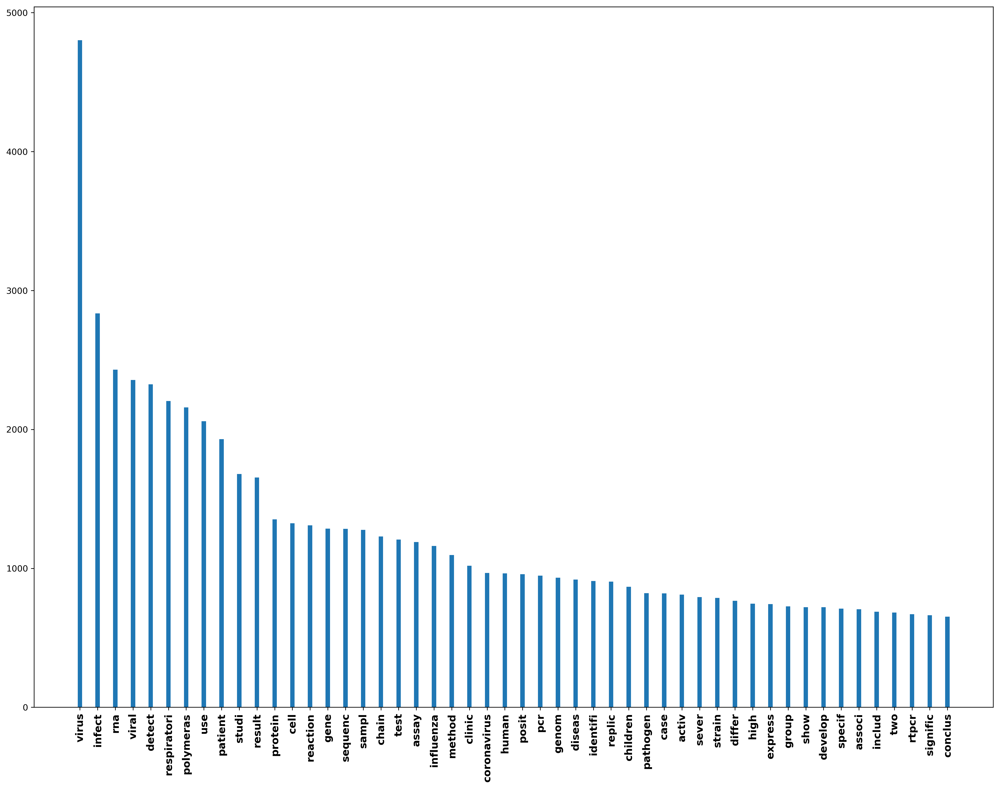

In [123]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np

import matplotlib

matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams['figure.dpi'] = 300
barWidth = 0.25
plt.figure(figsize=(20,15))

counts = Counter(x)
common = counts.most_common(50)
labels = [item[0] for item in common]
number = [item[1] for item in common]
nbars = len(common)

plt.bar(np.arange(nbars), number,width=barWidth, tick_label=labels)
plt.xticks(rotation = 90, fontweight='bold',fontsize=12,)
plt.show()

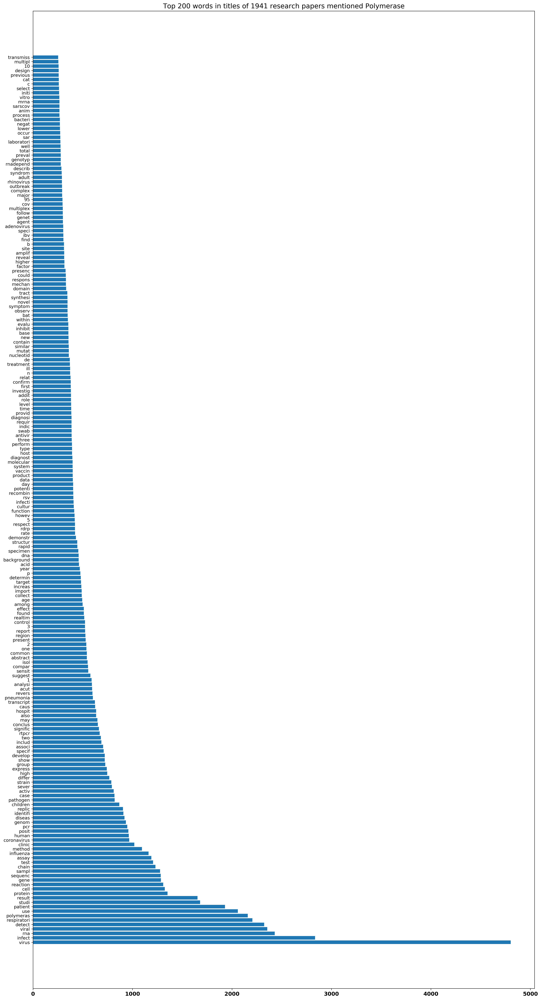

In [124]:
barWidth = 0.25
plt.figure(figsize=(20,40))

counts = Counter(x)
common = counts.most_common(200)
labels = [item[0] for item in common]
number = [item[1] for item in common]
nbars = len(common)

plt.barh(np.arange(nbars), number,tick_label=labels) #width=barWidth, 
plt.xticks( fontweight='bold',fontsize=12,) #rotation = 90,
plt.title('Top 200 words in titles of ' +str(df.ABS.shape[0])+  ' research papers mentioned Polymerase',fontsize=15)#,fontweight='bold'   #df2.title.shape
plt.show()

## Customize stop words

In [125]:
customize_stop_words2 = [
    'used', 'using', 'SARS CoV','MERS CoV','Abstract','found','result','method','conclusion','results','case','cases',
    'compared','many','well','including','identified','Although','present','Middle East','infection','patient'
    'infectious','treatment','China','East','Role','COVID','human','model','Chapter','viruses','methods','disease'
]
#capital letter must match

STOPWORDS2 = list(STOPWORDS)  + customize_stop_words2

## Word Cloud

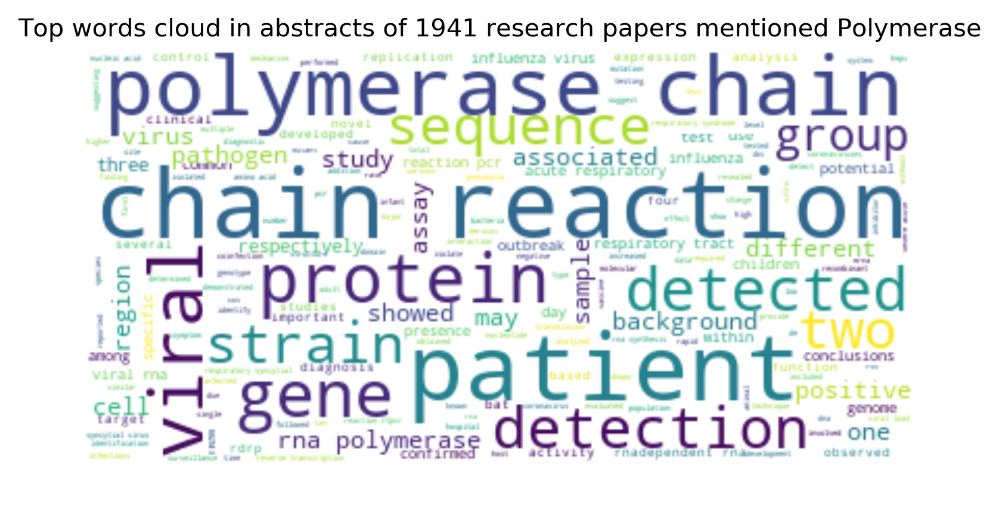

In [149]:
text = outString

# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords = STOPWORDS2,  background_color="white").generate(text)

#matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams['figure.dpi'] = 300

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Top words cloud in abstracts of ' +str(df.ABS.shape[0])+  ' research papers mentioned Polymerase',fontsize=10)#,fontweight='bold'
plt.show()

#### The most informative words are usually not the biggest. By reading the papers, we know “rdrp” is a critical target. “rna-dependent rna” could mean “RNA-dependent RNA polymerase or RNA replicase”. In addition, the plot shows "polymerase chain" is a high frequency word. By domain knowledge we know it is becasue PCR. 

## Vectorize the abstracts with TF-IDF

In [127]:
tf_idf_vectorizor = TfidfVectorizer(stop_words = 'english',max_features = 2**12)
tf_idf = tf_idf_vectorizor.fit_transform(df.ABS)
tf_idf_norm = normalize(tf_idf)
tf_idf_array = tf_idf_norm.toarray()
pd.DataFrame(tf_idf_array, columns=tf_idf_vectorizor.get_feature_names()).head()

,00001,0001,0002,0003,0005,001,002,003,005,01,...,yunnan,zaire,zanamivir,zbtb25,zebov,zika,zikv,zinc,zn2,zoonotic
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## KMeans Clustering

#### Try 5 clusters

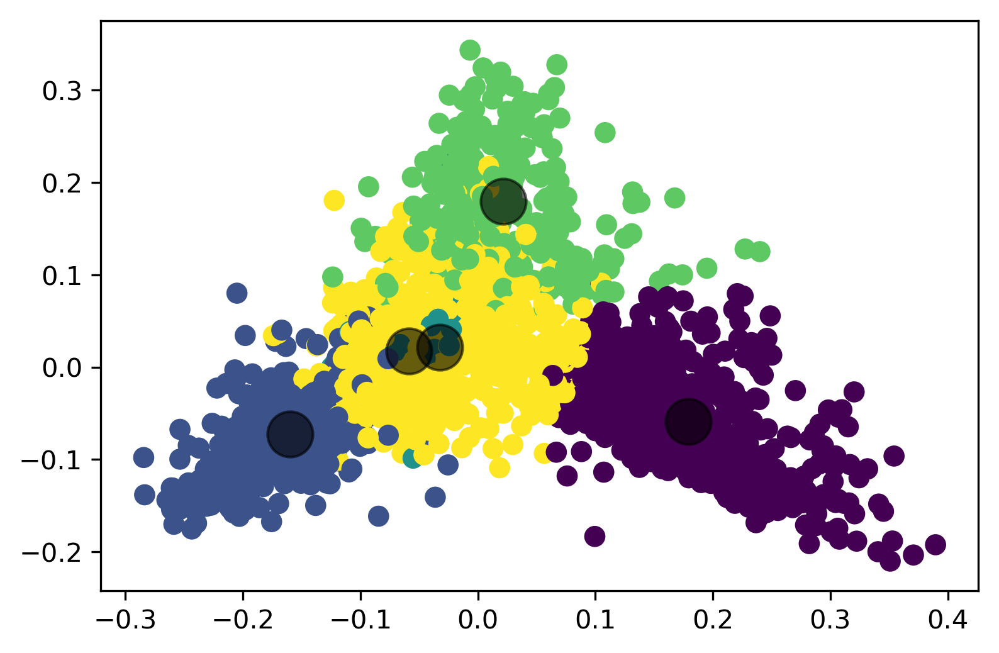

In [128]:
sklearn_pca = PCA(n_components = 30)
X = sklearn_pca.fit_transform(tf_idf_array)
kmeans = KMeans(n_clusters=5, max_iter=600, algorithm = 'auto')
fitted = kmeans.fit(X)
prediction = kmeans.predict(X)

plt.scatter(X[:, 0], X[:, 1], c=prediction, s=50, cmap='viridis')
centers = fitted.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=300, alpha=0.6);

#### Plot of 5 clusters

#### 5 clusters looks good.

#### Elbow method below picked n_clusters=5 or 6. However, Silhouette score picked n_clusters=6. So we also plot the results of n_clusters=6.

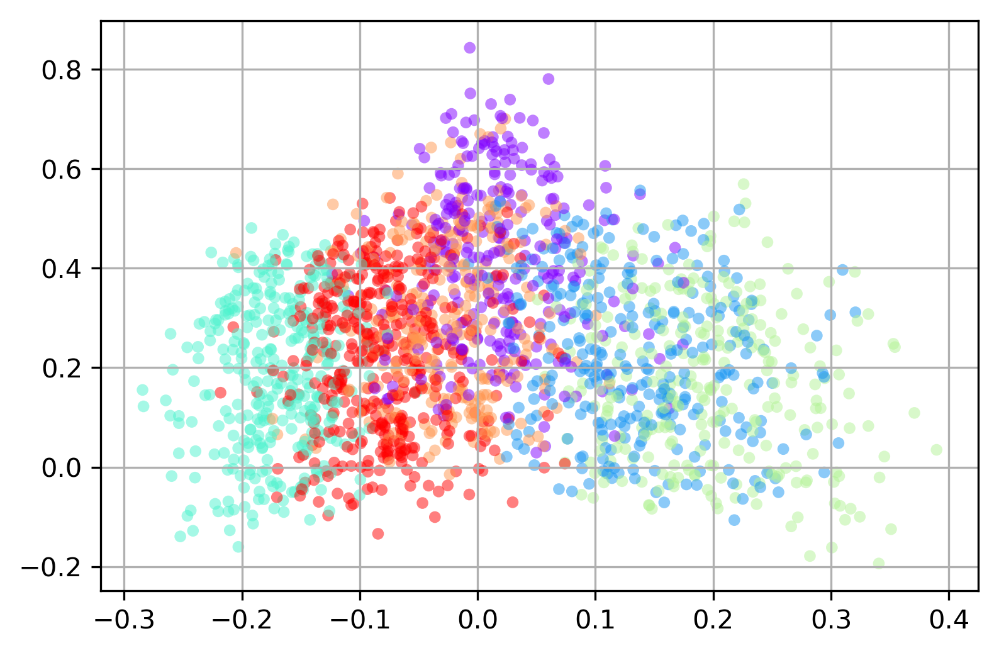

In [129]:
sklearn_pca = PCA(n_components = 30)
X = sklearn_pca.fit_transform(tf_idf_array)

cls = KMeans(n_clusters=6, init='k-means++',random_state=1) # 
cls.fit(X)
newfeature = cls.labels_ # the labels from kmeans clustering

X2 = np.column_stack((X,pd.get_dummies(newfeature)))

plt.figure()
#plt.subplot(1,2,1)
X2=X2
plt.scatter(X2[:, 0], X2[:, 1]+np.random.random(X2[:, 1].shape)/2, c=newfeature, cmap=plt.cm.rainbow, s=20, linewidths=0,alpha=0.5)
plt.xlabel(''), plt.ylabel('')
plt.grid()

### Plot of 6 clusters

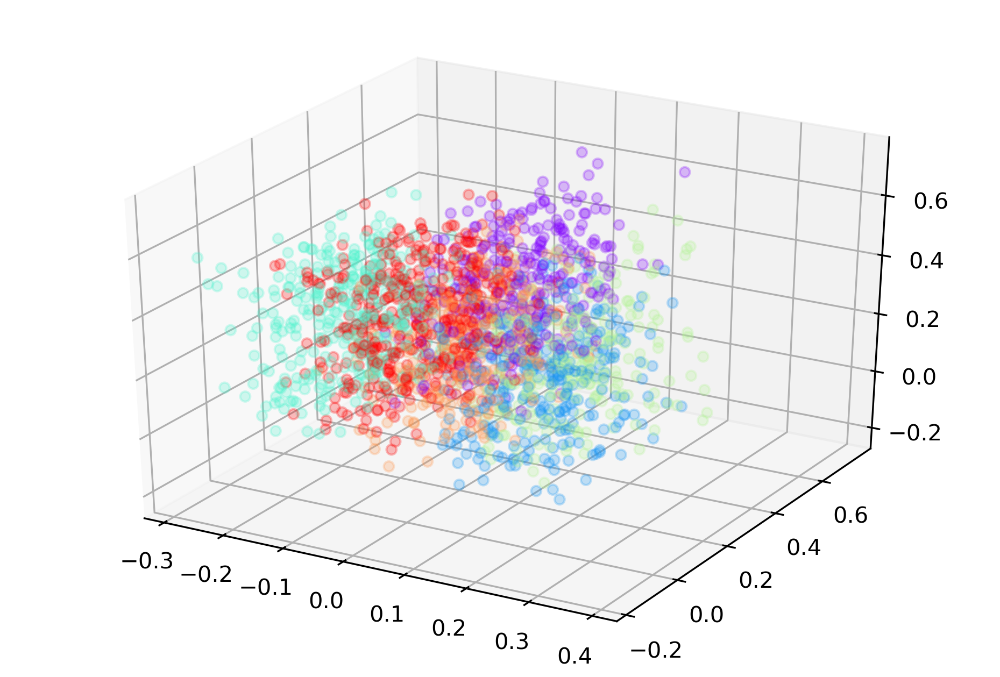

In [130]:
#3D plot

from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D


fig = pyplot.figure()
ax = Axes3D(fig)


ax.scatter(X2[:, 0], X2[:, 1]+np.random.random(X2[:, 1].shape)/2,X2[:, 2]+np.random.random(X2[:, 1].shape)/2, c=newfeature, cmap=plt.cm.rainbow,alpha=0.25)
pyplot.show()

3D Plot of 6 clusters

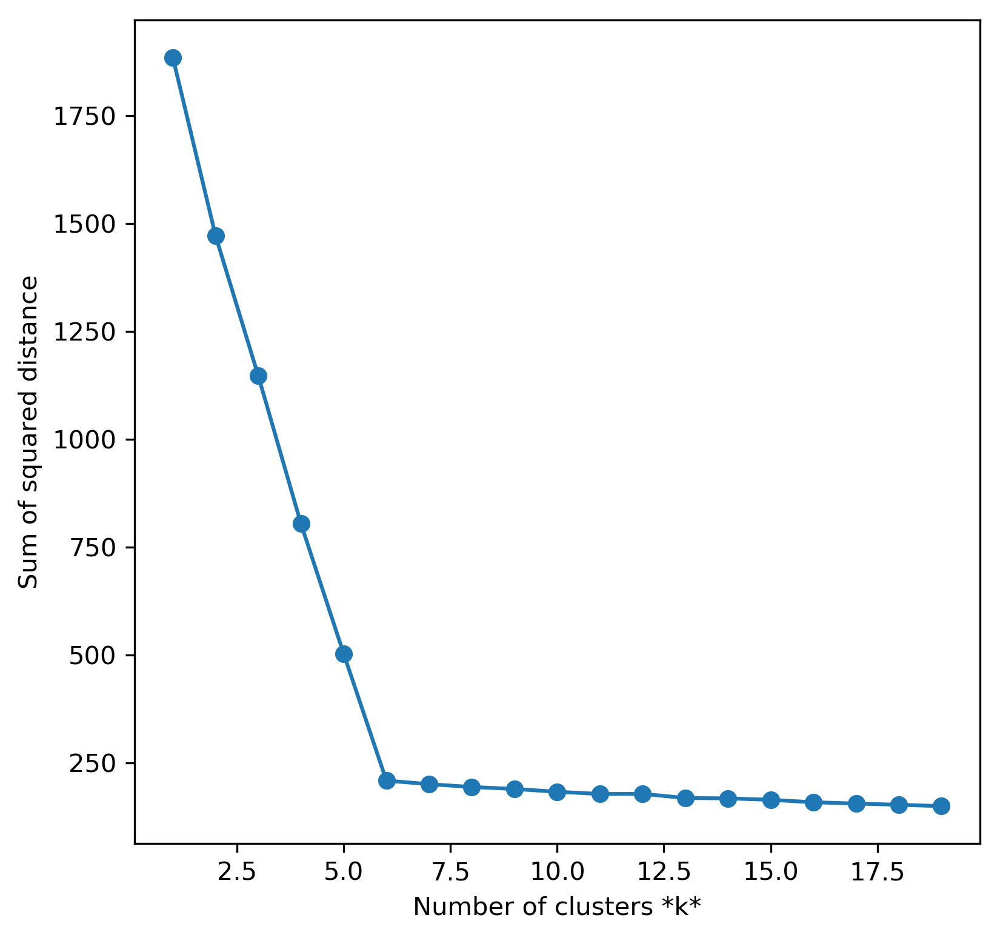

In [150]:
sse = []
list_k = list(range(1, 20))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(X)
    sse.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance');

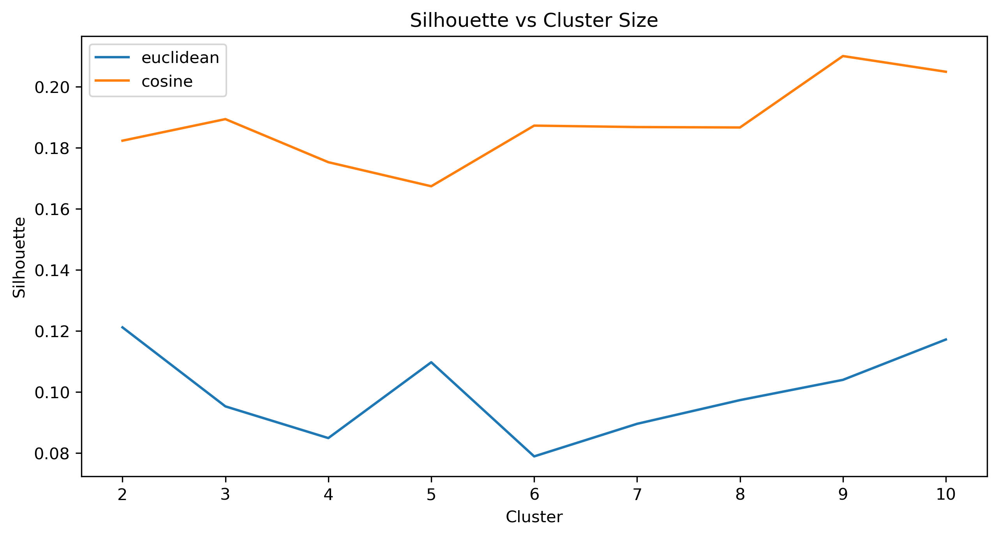

In [132]:

data=X

# Silhouette vs Cluster Size
# do it for the k-means
from sklearn import metrics
from sklearn.cluster import KMeans

seuclid = []
scosine = []
k = range(2,11)
for i in k:
    kmeans_model = KMeans(n_clusters=i, init="k-means++").fit(X)
    labels = kmeans_model.labels_
    seuclid.append(metrics.silhouette_score(data, labels, metric='euclidean'))
    scosine.append(metrics.silhouette_score(data, labels, metric='cosine'))
    
plt.figure(figsize=(10,5))
plt.plot(k,seuclid,label='euclidean')
plt.plot(k,scosine,label='cosine')
plt.ylabel("Silhouette")
plt.xlabel("Cluster")
plt.title("Silhouette vs Cluster Size")
plt.legend()
plt.show()

Automatically created module for IPython interactive environment
For n_clusters = 3 The average silhouette_score is : 0.3899113708853573
For n_clusters = 4 The average silhouette_score is : 0.49827989074182816
For n_clusters = 5 The average silhouette_score is : 0.6044838877968652
For n_clusters = 6 The average silhouette_score is : 0.706365002900673
For n_clusters = 7 The average silhouette_score is : 0.6435036179450423
For n_clusters = 8 The average silhouette_score is : 0.6476287240597427
For n_clusters = 9 The average silhouette_score is : 0.5422462868757627
For n_clusters = 10 The average silhouette_score is : 0.4671381868766424
For n_clusters = 11 The average silhouette_score is : 0.5537639538009065


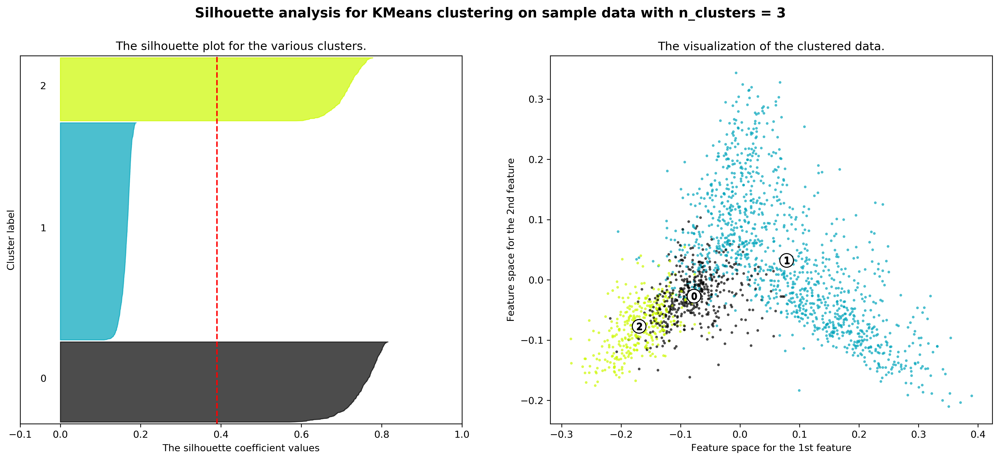

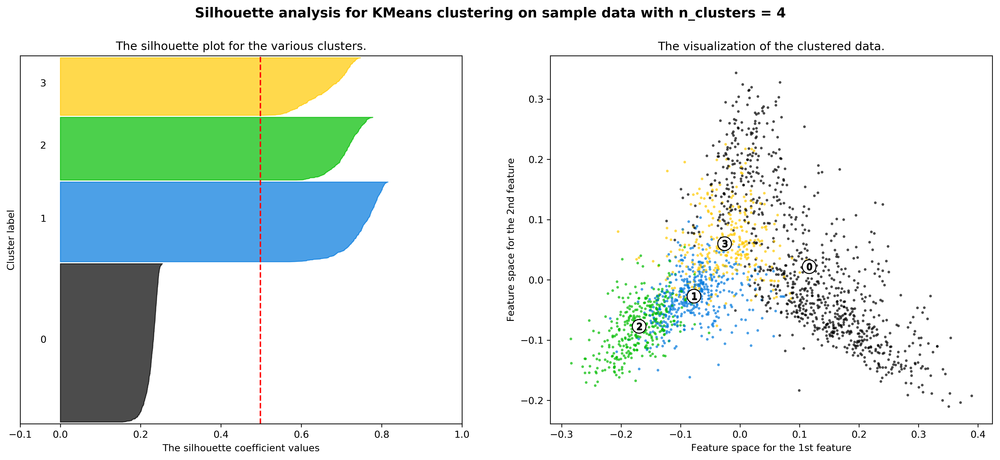

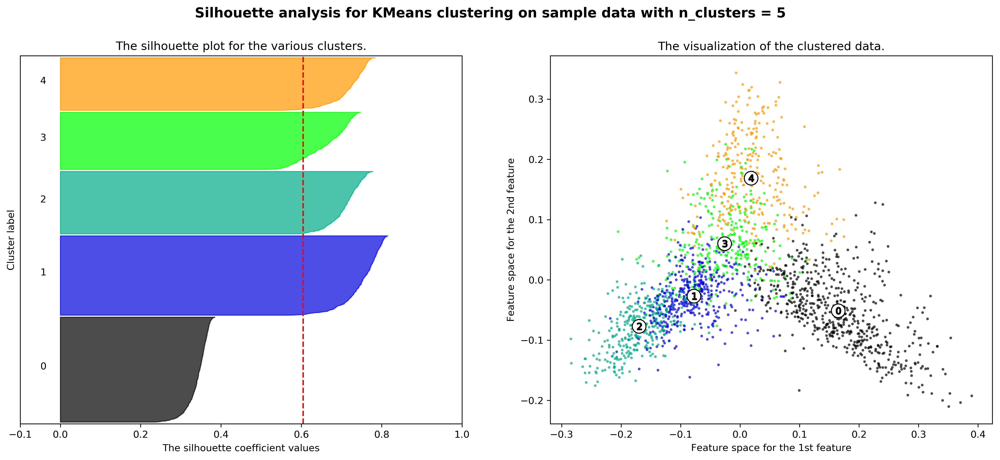

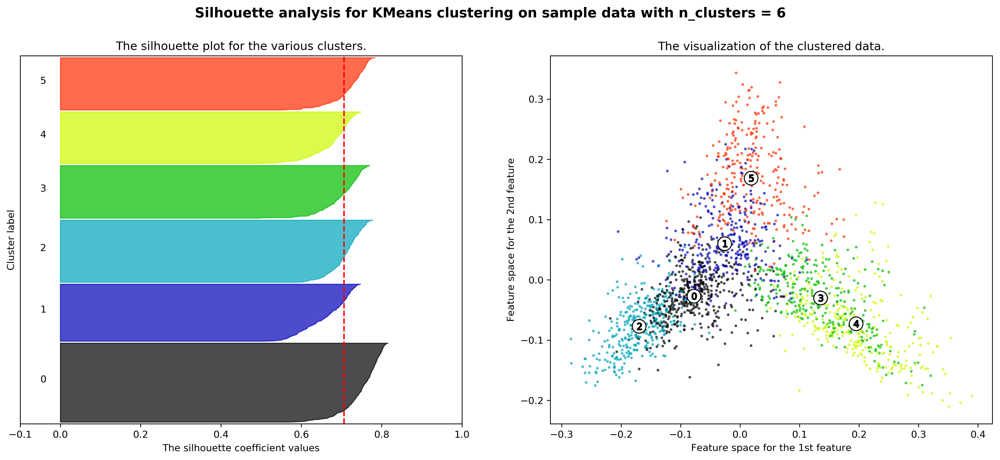

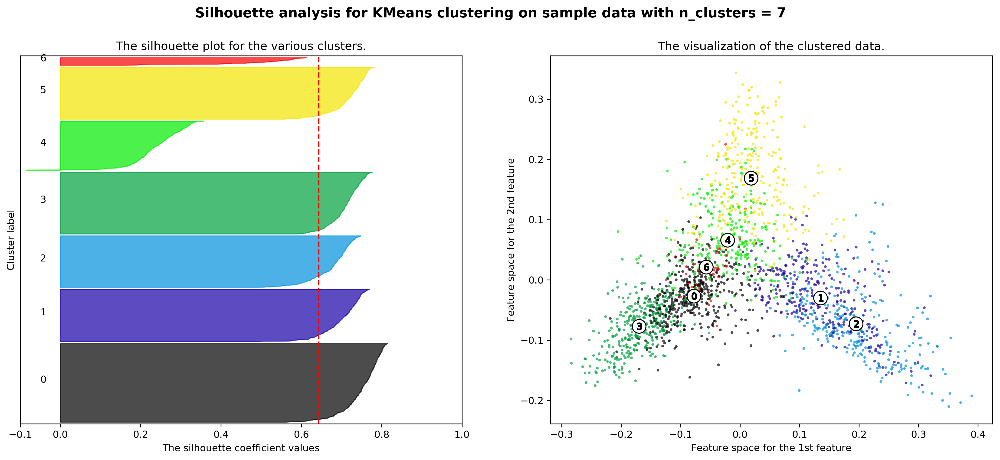

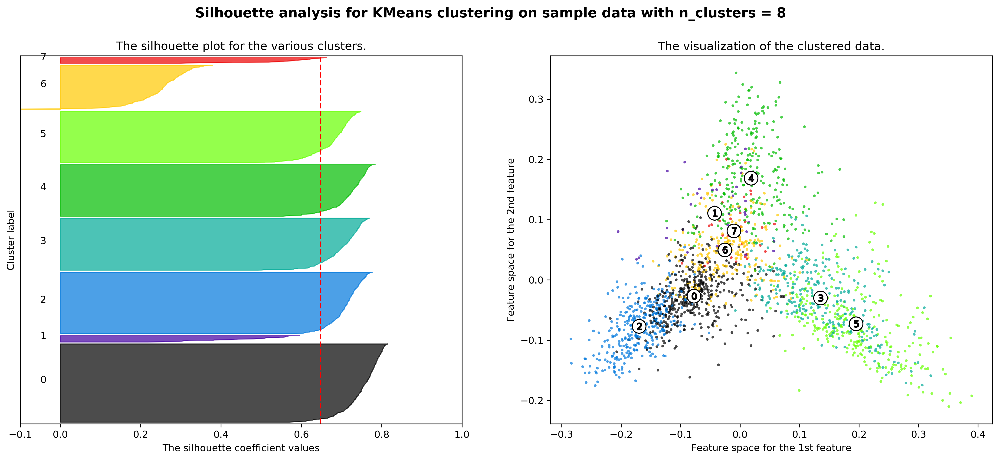

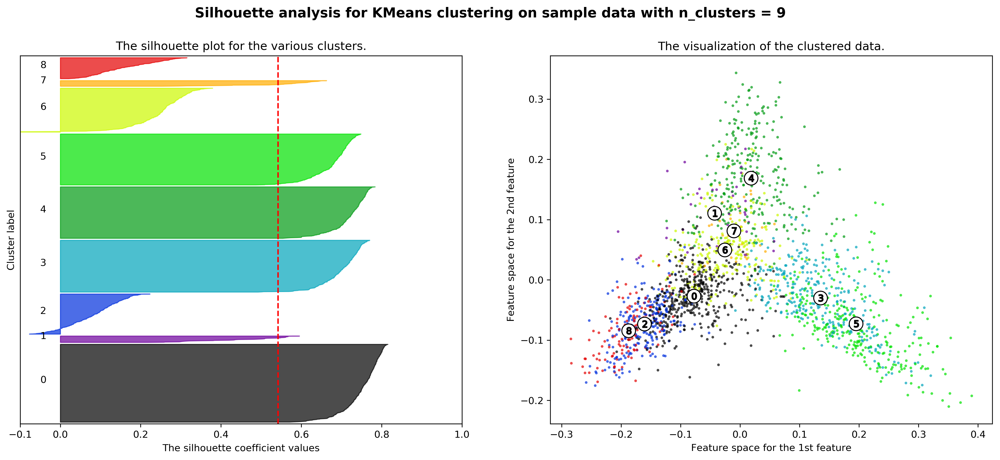

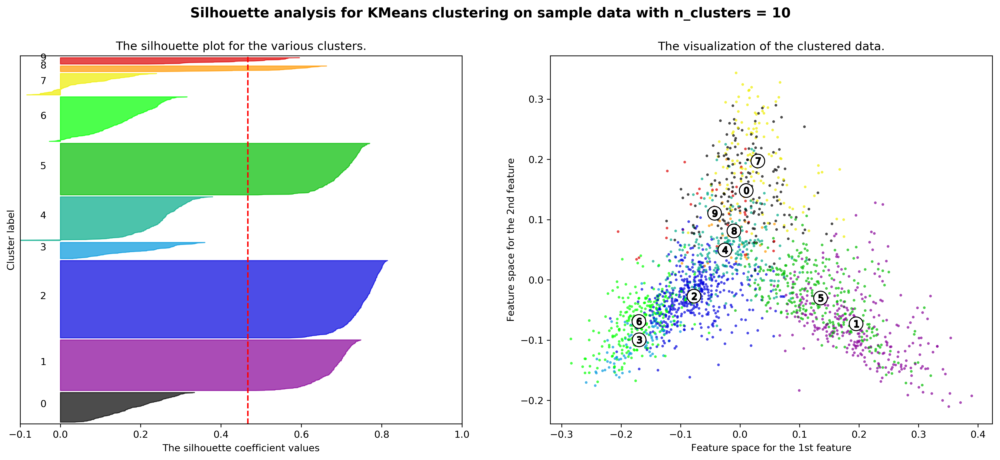

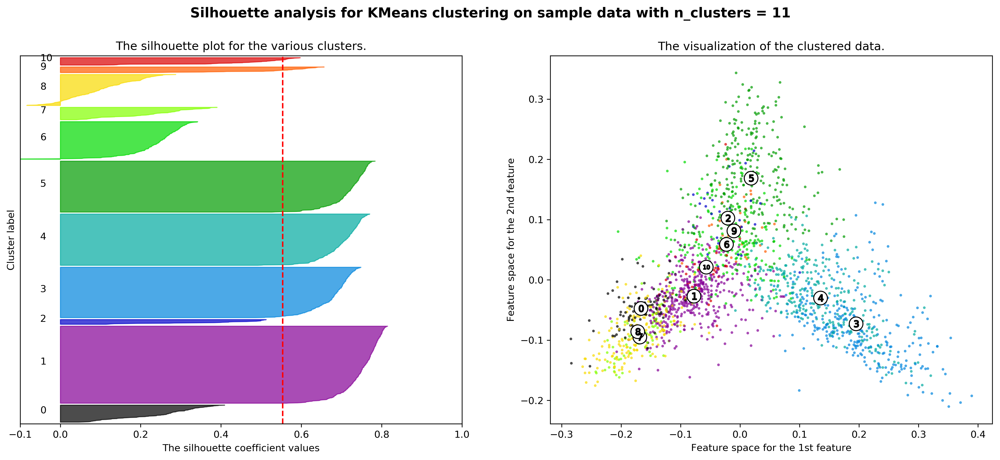

In [133]:

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np

print(__doc__)

# y_lower = 10?
X=X2
y=newfeature
range_n_clusters = [ 3, 4, 5, 6,7,8,9,10,11] # [3, 4, 5, 6,7,8,9,10,11,12,13,14,15,16,17,18,19,20] 


for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()


## Vectorize the abstracts using Universal Sentence Encoder

In [134]:
data1 = np.array(df.ABS.drop_duplicates(keep='last'))
data1

array(['abstract astrocytes produce granulocytemacrophage colonystimulating factor gmcsf and support the survival and proliferation of microglia to study the functions of gmcsf in the central nervous system cns we examined the effects of gmcsf on cytokine production by glial cells gmcsf induced interleukin6 il6 production by microglia but not by astrocytes in a dosedependent manner as assessed by bioassay and the detection of il6 mrna by reverse transcriptasepolymerase chain reaction rtpcr analysis gmcsf did not induce tumor necrosis factor tnfa or il1 in microglia and astrocytes whereas lipopolysaccharide induced all these cytokines the induction of il6 by gmcsf in microglia was completely inhibited by antibodies to gmcsf neither il3 nor macrophagecsf mcsf induced il6 production in microglia given that il1 and tnf monokines derived from microglia induce il6 production in astrocytes but not in microglia results indicate that astrocytes and microglia may mutually regulate il6 production

In [135]:
data1.shape


(1941,)

In [136]:
data1list=data1.tolist()

In [137]:
%%capture
# Install the latest Tensorflow version.
#!pip3 install --upgrade tensorflow-gpu
# Install TF-Hub.
!pip3 install tensorflow-hub
#!pip3 install seaborn

In [138]:
import numpy as np
import pandas as pd

import tensorflow as tf
import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/3")

In [139]:
embeddings = embed(data1list)["outputs"]

#print(embeddings)

In [140]:
embeddings.shape

TensorShape([1941, 512])

In [141]:
NParray1941papers512vector=np.array(embeddings)
NParray1941papers512vector

array([[ 0.02409276,  0.00333246,  0.02617527, ..., -0.05257908,
        -0.02694643, -0.06477401],
       [ 0.00073825,  0.02878778,  0.00838286, ..., -0.05337695,
        -0.03477789,  0.00727506],
       [-0.02900779,  0.03677293,  0.01629622, ..., -0.04934358,
        -0.00588756, -0.03237622],
       ...,
       [-0.0604236 , -0.00013403, -0.05867178, ..., -0.05803579,
        -0.06144454, -0.05860412],
       [-0.01348849,  0.04927895, -0.05944375, ..., -0.03317856,
        -0.04884239, -0.04074986],
       [ 0.01909221,  0.01242393, -0.05794841, ..., -0.04703324,
        -0.00612303, -0.06096034]], dtype=float32)

In [142]:
testAbstract1=["background enterovirus 71 ev71 is one of the major causative agents of hand foot and mouth disease hfmd which is sometimes associated with severe central nervous system disease in children there is currently no specific medication for ev71 infection quercetin one of the most widely distributed flavonoids in plants has been demonstrated to inhibit various viral infections however investigation of the antiev71 mechanism has not been reported to date methods the antiev71 activity of quercetin was evaluated by phenotype screening determining the cytopathic effect cpe and ev71induced cells apoptosis the effects on ev71 replication were evaluated further by determining virus yield viral rna synthesis and protein expression respectively the mechanism of action against ev71 was determined from the effective stage and timeofaddition assays the possible inhibitory functions of quercetin via viral 2apro 3cpro or 3dpol were tested the interaction between ev71 3cpro and quercetin was predicted and calculated by molecular docking results quercetin inhibited ev71mediated cytopathogenic effects reduced ev71 progeny yields and prevented ev71induced apoptosis with low cytotoxicity investigation of the underlying mechanism of action revealed that quercetin exhibited a preventive effect against ev71 infection and inhibited viral adsorption moreover quercetin mediated its powerful therapeutic effects primarily by blocking the early postattachment stage of viral infection further experiments demonstrated that quercetin potently inhibited the activity of the ev71 protease 3cpro blocking viral replication but not the activity of the protease 2apro or the rna polymerase 3dpol modeling of the molecular binding of the 3cproquercetin complex revealed that quercetin was predicted to insert into the substratebinding pocket of ev71 3cpro blocking substrate recognition and thereby inhibiting ev71 3cpro activity conclusions quercetin can effectively prevent ev71induced cell injury with low toxicity to host cells quercetin may act in more than one way to deter viral infection exhibiting some preventive and a powerful therapeutic effect against ev71 further quercetin potently inhibits ev71 3cpro activity thereby blocking ev71 replication"]

In [143]:
testAbstract2=["background to investigate the effects and immunological mechanisms of the traditional chinese medicine xinjiaxiangruyin on controlling influenza virus fm1 strain infection in mice housed in a hygrothermal environment methods mice were housed in normal and hygrothermal environments and intranasally infected with influenza virus fm1 a highperformance liquid chromatography fingerprint of xinjiaxiangruyin was used to provide an analytical method for quality control realtime quantitative polymerase chain reaction rtqpcr was used to measure messenger rna expression of tolllike receptor 7 tlr7 myeloid differentiation primary response 88 myd88 and nuclear factorkappa b nfb p65 in the tlr7 signaling pathway and virus replication in the lungs western blotting was used to measure the expression levels of tlr7 myd88 and nfb p65 proteins flow cytometry was used to detect the proportion of th17tregulatory cells results xinjiaxiangruyin effectively alleviated lung inflammation in c57bl6 mice in hot and humid environments guizhimahuanggebantang significantly reduced lung inflammation in c57bl6 mice the expression of tlr7 myd88 and nfb p65 mrna in lung tissue of wt mice in the normal environment gzmhgbt group was significantly lower than that in the model group p  005 in wt mice exposed to the hot and humid environment the expression levels of tlr7 myd88 and nfb p65 mrna in the xjxry group were significantly different from those in the virus group the expression levels of tlr7 myd88 and nfb p65 protein in lung tissue of wt mice exposed to the normal environment gzmhgbt group was significantly lower than those in the model group in wt mice exposed to hot and humid environments the expression levels of tlr7 myd88 and nfb p65 protein in xjxry group were significantly different from those in the virus group conclusion guizhimahuanggebantang demonstrated a satisfactory therapeutic effect on mice infected with the influenza a virus fm1 strain in a normal environment and xinjiaxiangruyin demonstrated a clear therapeutic effect in damp and hot environments and may play a protective role against influenza through downregulation of the tlr7 signal pathway"]

In [144]:
Question1=['What are clinical effective therapeutics or drugs for COVID-19?']

In [145]:
embeddingsT1 = embed(testAbstract1)["outputs"]
embeddingsT2 = embed(testAbstract2)["outputs"]

embeddingsQ1 = embed(Question1)["outputs"]

test1=np.array(embeddingsT1)
test2=np.array(embeddingsT2)

question1=np.array(embeddingsQ1)

import textwrap

## Examples of recommend similar papers

### Notice the paper find iteself as the most similar papers with cosine similarity score of 1.

In [151]:
result1 = np.sum(NParray1941papers512vector*test1,axis=1)/(np.sqrt(np.sum(NParray1941papers512vector*NParray1941papers512vector,axis=1))*np.sqrt(np.sum(test1*test1)))
maxRows1=result1.argsort()[-10:][::-1]  #https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array
print("The indexes for most similar papers are:") 
print(maxRows1)
print("\n")
print("The cosine similarity for top 10 papers are:") 
print(result1[result1.argsort()[-10:][::-1]])
print("\n")
print("For Paper Abstract:\n")
print(textwrap.fill(testAbstract1[0],100))
print("\nWe found the top 10 most similar papers as listed below:\n")
print(df.ABS.iloc[maxRows1])

The indexes for most similar papers are:
[ 984 1499 1937 1064  663 1636  154   38  146  776]


The cosine similarity for top 10 papers are:
[1.0000001  0.8270296  0.77556515 0.7716375  0.7676147  0.76736087
 0.75756586 0.7570242  0.75692165 0.75613713]


For Paper Abstract:

background enterovirus 71 ev71 is one of the major causative agents of hand foot and mouth disease
hfmd which is sometimes associated with severe central nervous system disease in children there is
currently no specific medication for ev71 infection quercetin one of the most widely distributed
flavonoids in plants has been demonstrated to inhibit various viral infections however investigation
of the antiev71 mechanism has not been reported to date methods the antiev71 activity of quercetin
was evaluated by phenotype screening determining the cytopathic effect cpe and ev71induced cells
apoptosis the effects on ev71 replication were evaluated further by determining virus yield viral
rna synthesis and protein expressi

In [152]:
result2 = np.sum(NParray1941papers512vector*test2,axis=1)/(np.sqrt(np.sum(NParray1941papers512vector*NParray1941papers512vector,axis=1))*np.sqrt(np.sum(test2*test2)))
maxRows2=result2.argsort()[-10:][::-1]  #https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array
print("The indexes for most similar papers are:") 
print(maxRows2)
print("\n")
print("The cosine similarity for top 10 papers are:") 
print(result2[result2.argsort()[-10:][::-1]])
print("\n")
print("For Paper Abstract:\n")
print(textwrap.fill(testAbstract2[0],100))
print("\nWe found the top 10 most similar papers as listed below:\n")
print(df.ABS.iloc[maxRows2])

The indexes for most similar papers are:
[1046 1453 1279 1383 1064 1168 1563  400  210 1419]


The cosine similarity for top 10 papers are:
[0.99999994 0.7110583  0.6851455  0.6791582  0.6723436  0.66990966
 0.66609055 0.6534611  0.64800745 0.6457796 ]


For Paper Abstract:

background to investigate the effects and immunological mechanisms of the traditional chinese
medicine xinjiaxiangruyin on controlling influenza virus fm1 strain infection in mice housed in a
hygrothermal environment methods mice were housed in normal and hygrothermal environments and
intranasally infected with influenza virus fm1 a highperformance liquid chromatography fingerprint
of xinjiaxiangruyin was used to provide an analytical method for quality control realtime
quantitative polymerase chain reaction rtqpcr was used to measure messenger rna expression of
tolllike receptor 7 tlr7 myeloid differentiation primary response 88 myd88 and nuclear factorkappa b
nfb p65 in the tlr7 signaling pathway and virus replic

## Example of Question Answering system

In [153]:
resultq1 = np.sum(NParray1941papers512vector*question1,axis=1)/(np.sqrt(np.sum(NParray1941papers512vector*NParray1941papers512vector,axis=1))*np.sqrt(np.sum(question1*question1)))
maxRowsq1=resultq1.argsort()[-20:][::-1]  #https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array
print("The indexes for most related papers are:") 
print(maxRowsq1)
print("\n")
print("The cosine similarity for top 20 papers are:") 
print(resultq1[resultq1.argsort()[-20:][::-1]])
print("\n")
print("For Question:\n")
print(textwrap.fill(Question1[0],100))
print("\nWe found the top 20 most related papers as listed below:\n")
print(df.ABS.iloc[maxRowsq1])

The indexes for most related papers are:
[ 644  818 1457 1145 1829   66 1774  496 1825  637   84  298 1403 1467
 1263  436 1789  647 1273  217]


The cosine similarity for top 20 papers are:
[0.31485555 0.28105113 0.27972364 0.2649105  0.2526728  0.24850303
 0.24528085 0.23647133 0.23592094 0.2335433  0.22230253 0.22137865
 0.22077075 0.21867044 0.21549016 0.21536064 0.2152237  0.21099517
 0.20463014 0.20306927]


For Question:

What are clinical effective therapeutics or drugs for COVID-19?

We found the top 20 most related papers as listed below:

644     ltpgtltbgtltbgt there is no specific drug that...
818     limited data is available on feline leishmanio...
1457    please cite this paper as wathen et al 2012 an...
1145    background rapid molecular methods have create...
1829    introduction the differentiation of viral from...
66      abstract viruses are major pathogenic agents c...
1774    abstractthe global spread of sarscov2 requires...
496     in this study 26 blood samples